<center>    
<h3>American Association of Physicists in Medicine</h3>    
<h3>Grand Challenge 2020</h3> 
<h3>OpenKBP</h3>
<hr>
<h1>Introduction</h1>    
<h3>February 14, 2020</h3>
</center> 

Before running this notebook, make a directory in the main directory of your Google Drive and name it open-kbp. The 
code-block below will mount your Google Drive and give you access to all your files from this notebook. 

In [2]:
# Mount your personal google drive
from google.colab import drive 
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


By default, the path to your Drive should be "/content/drive/My Drive". You may check this by clicking the file icon in
the toolbar on the left side of Colab. From there you can navigate through your file tree and copy the path of any
file in your Drive. 

Next, add the open-kbp directory to your path.

In [0]:
# Add all files to path related to open-kbp. 
# A directory 'train-pats' with all training patient data should be included in open-kbp
import sys
primary_directory = '/content/drive/My Drive/open-kbp-fork-d-alexandre'
sys.path.insert(0, primary_directory)


Import all necessary packages for the notebook.

In [5]:
import os

# %tensorflow_version 2.x #  This ensures you use the newest version of tensorflow
%tensorflow_version 2.x # Use tensorflow 2
import tensorflow as tf

# Import provided classes and functions
import shutil
import numpy as np
from provided_code.data_loader import DataLoader
from provided_code.dose_evaluation_class import EvaluateDose
from provided_code.general_functions import get_paths, make_directory_and_return_path
from provided_code.network_functions import PredictionModel

from provided_code.utils import visualize_3d_image

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `2.x # Use tensorflow 2`. This will be interpreted as: `2.x`.


TensorFlow 2.x selected.


The functions loaded from _provided\_code_ are written for this competition, and you can access them via the file 
explorer on the left hand side of the Colab window. You're welcome to change them as much as 
you'd like. Keep in mind, however, that on Colab any changes you make to the files in your Google Drive (e.g., files in
 _provided\_code_ directory) will only be recognized by Colab when the _Runtime_ is restarted via the Restart 
 Runtime option in the top toolbar. If you implement a neural network, we urge you to you start with the provided 
 network architecture and network functions. The neural network we provide is only meant to be a template, and will not 
 be a competitive model without some significant modifications.

Before we run anything, first define the paths where the provided data is stored and where the results (e.g., models, predictions) should be saved. 

In [0]:
# Define parent directory
training_data_dir = '{}/provided-data/train-pats'.format(primary_directory)
validation_data_dir = '{}/provided-data/validation-pats-no-dose'.format(primary_directory)
# path where any data generated by this code (e.g., predictions, models) are stored
results_dir = '{}/results'.format(primary_directory)  # parent path where results are stored


Name the model. This name will be used to label directories containing the results that the model generates. Also, 
define how many epochs the model should be trained for. It will likely take a large number of epochs (e.g., 100-200)
to get good results. 

In [0]:
prediction_name = 'bruh'
number_of_training_epochs = 200

Retrieve the paths for all patient directories in the training set and seperate them into a list of paths for training 
a model and another for hold-out testing. 

In [0]:
# Prepare the data directory 
plan_paths = get_paths(training_data_dir, ext='')  # gets the path of each plan's directory
num_train_pats = np.minimum(150, len(plan_paths))  # number of plans that will be used to train model
training_paths = plan_paths[:num_train_pats]  # list of training plans
hold_out_paths = plan_paths[num_train_pats:]  # list of paths used for held out testing

Initialize a data loader for the training set data, and use it to initialize a prediction model object. Call the
train_model method to train the model for the predefined number of epochs.

Model: "generator"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
ct_input (InputLayer)           [(None, 128, 128, 12 0                                            
__________________________________________________________________________________________________
roi_input (InputLayer)          [(None, 128, 128, 12 0                                            
__________________________________________________________________________________________________
concatenate_6 (Concatenate)     (None, 128, 128, 128 0           ct_input[0][0]                   
                                                                 roi_input[0][0]                  
__________________________________________________________________________________________________
conv3d_15 (Conv3D)              (None, 64, 64, 64, 8 5640        concatenate_6[0][0]      

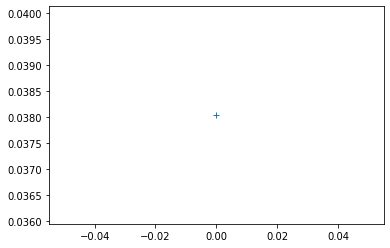

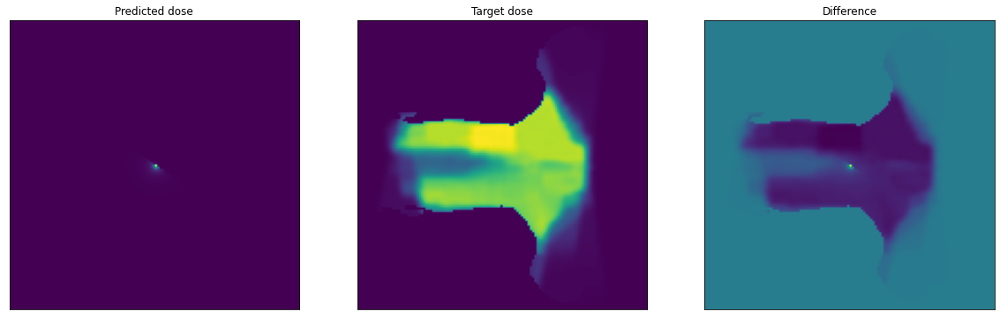

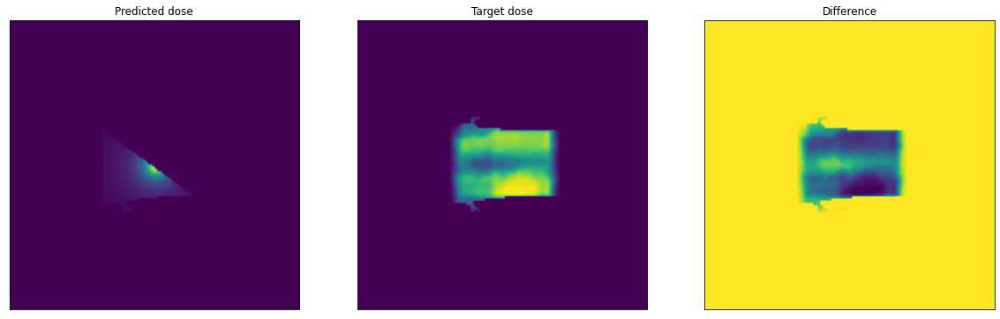

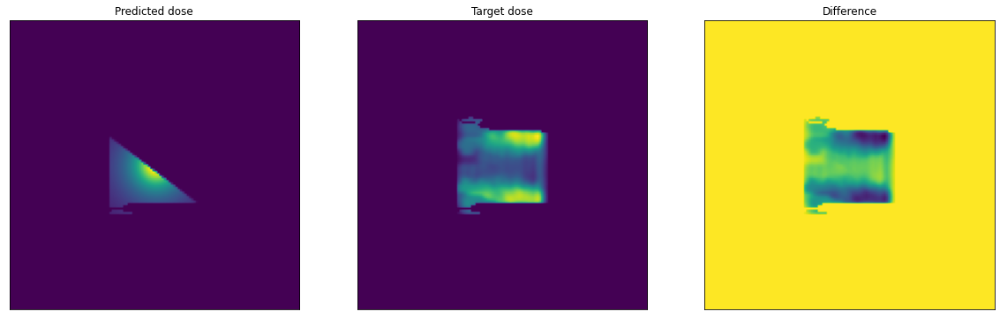

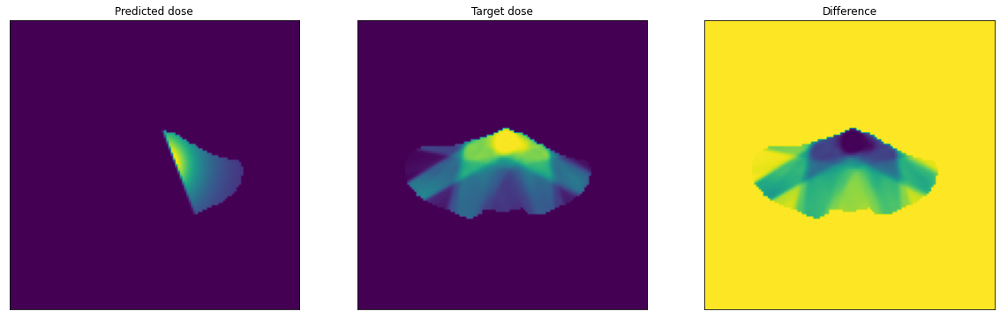

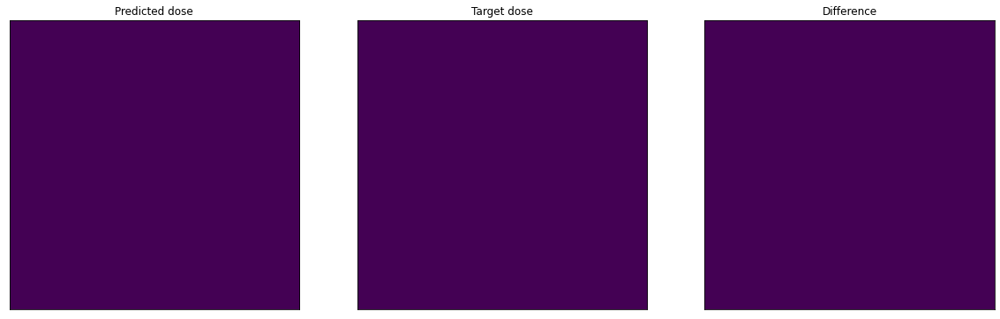

<Figure size 432x288 with 0 Axes>

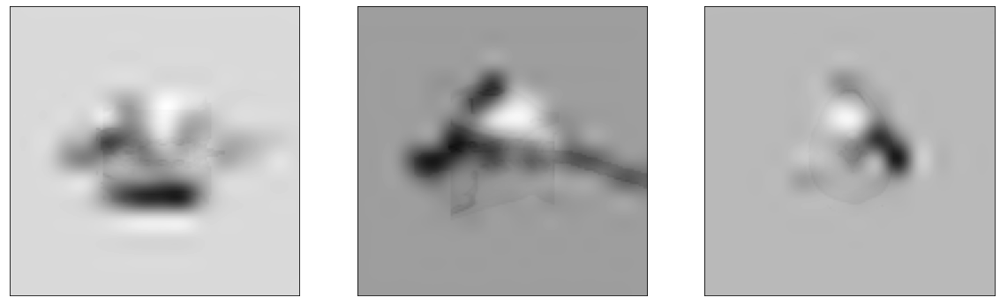

Epoch 1 performed in 238.427s



Epoch number 2 out of 200


EPOCH #2/200 - BATCH #1/150
Loading the data...
Data loaded in 0.245
Generator training...
Mean absolute error : 0.030
Generator trained in 0.802
Attention weight sigma  [[0.00031398033], [0.0]]
Total training time : 1.050s

--------------------------------------------------------------------------------

EPOCH #2/200 - BATCH #2/150
Loading the data...
Data loaded in 0.312
Generator training...
Mean absolute error : 0.033
Generator trained in 0.789
Attention weight sigma  [[0.00035062138], [0.0]]
Total training time : 1.103s

--------------------------------------------------------------------------------

EPOCH #2/200 - BATCH #3/150
Loading the data...
Data loaded in 0.387
Generator training...
Mean absolute error : 0.053
Generator trained in 0.797
Attention weight sigma  [[0.00037137006], [0.0]]
Total training time : 1.187s

--------------------------------------------------------------------------------

EPOCH #2/200 - BAT

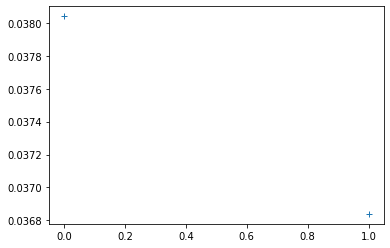

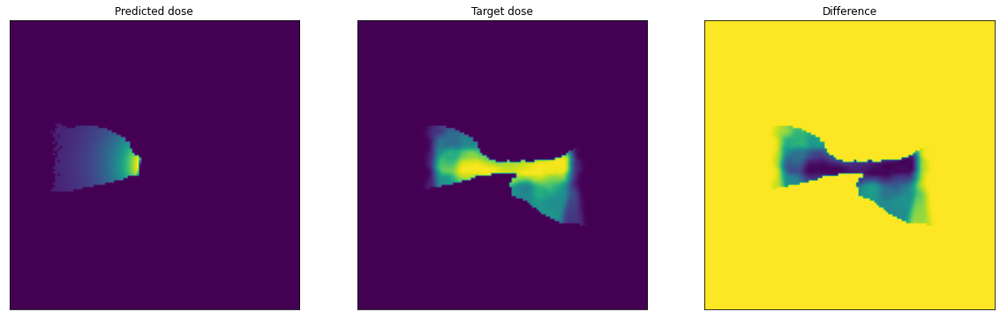

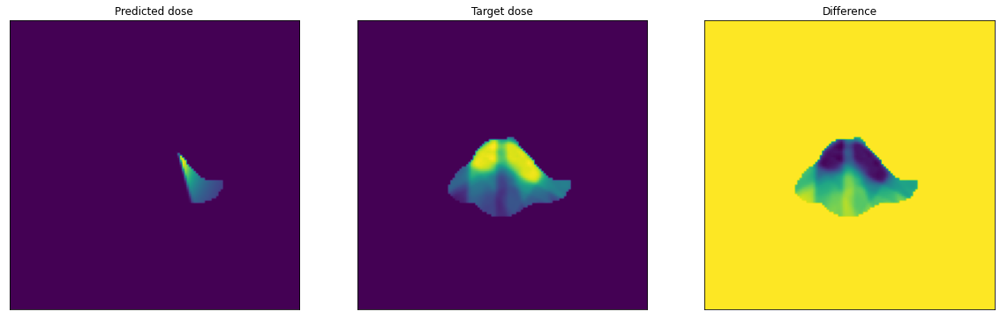

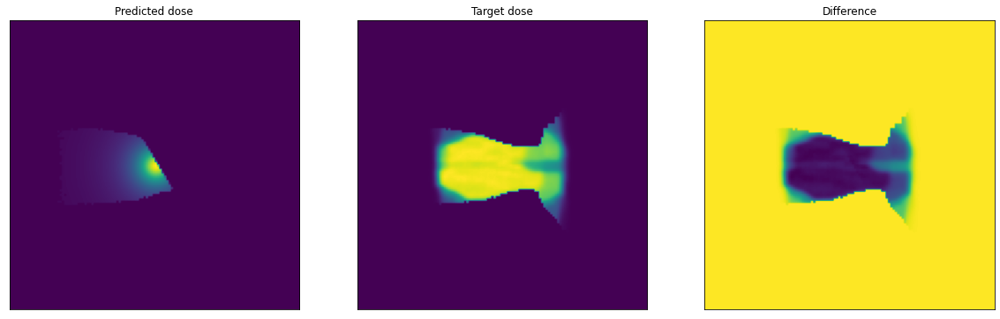

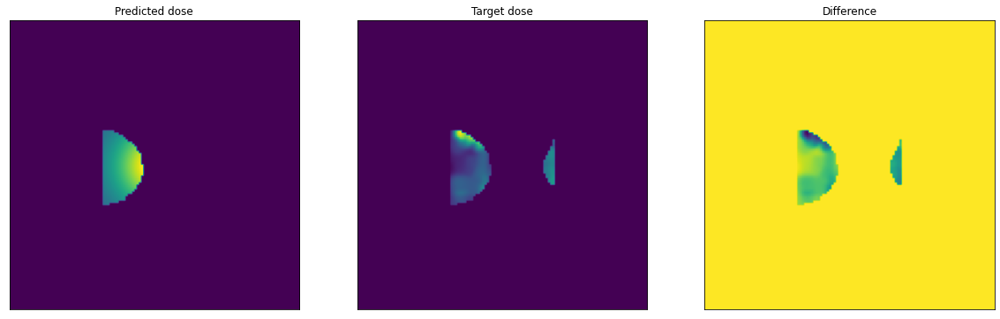

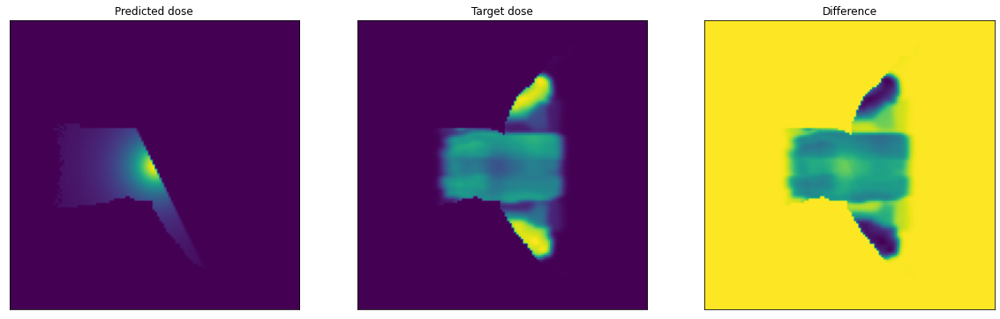

<Figure size 432x288 with 0 Axes>

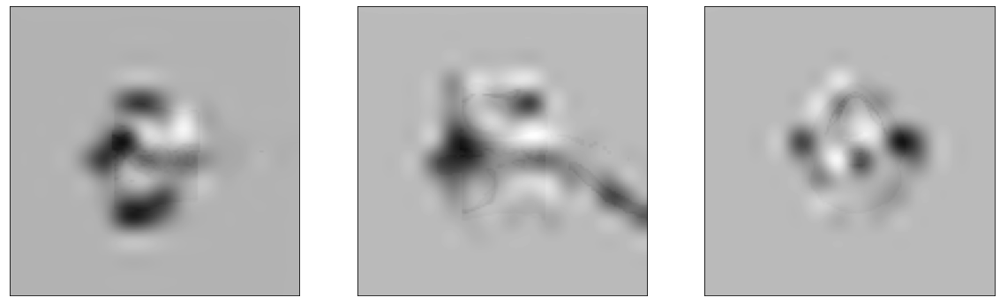

Epoch 2 performed in 174.873s



Epoch number 3 out of 200


EPOCH #3/200 - BATCH #1/150
Loading the data...
Data loaded in 0.240
Generator training...
Mean absolute error : 0.030
Generator trained in 0.822
Attention weight sigma  [[2.538705e-05], [0.0]]
Total training time : 1.064s

--------------------------------------------------------------------------------

EPOCH #3/200 - BATCH #2/150
Loading the data...
Data loaded in 0.293
Generator training...
Mean absolute error : 0.033
Generator trained in 0.794
Attention weight sigma  [[3.4036864e-05], [0.0]]
Total training time : 1.090s

--------------------------------------------------------------------------------

EPOCH #3/200 - BATCH #3/150
Loading the data...
Data loaded in 0.311
Generator training...
Mean absolute error : 0.031
Generator trained in 0.801
Attention weight sigma  [[3.776842e-05], [0.0]]
Total training time : 1.114s

--------------------------------------------------------------------------------

EPOCH #3/200 - BATCH

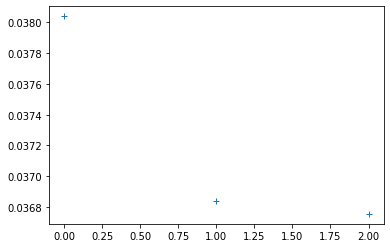

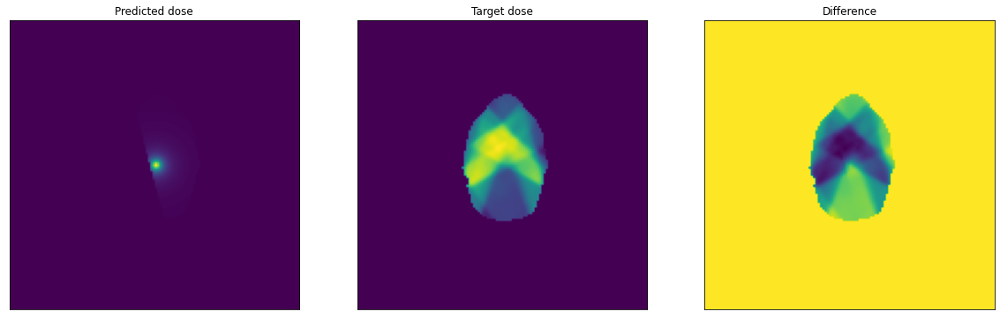

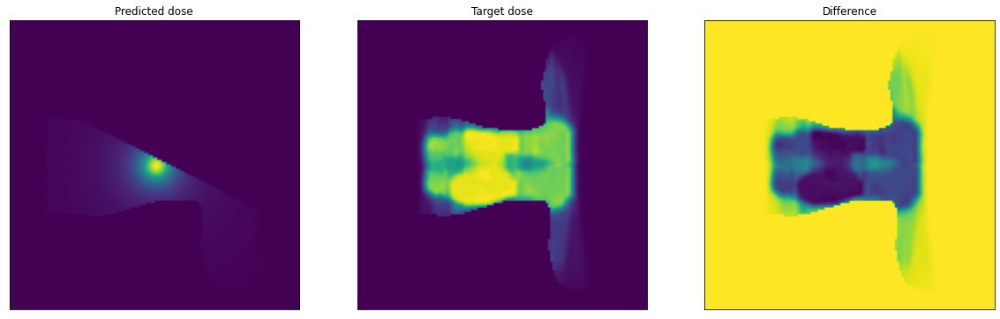

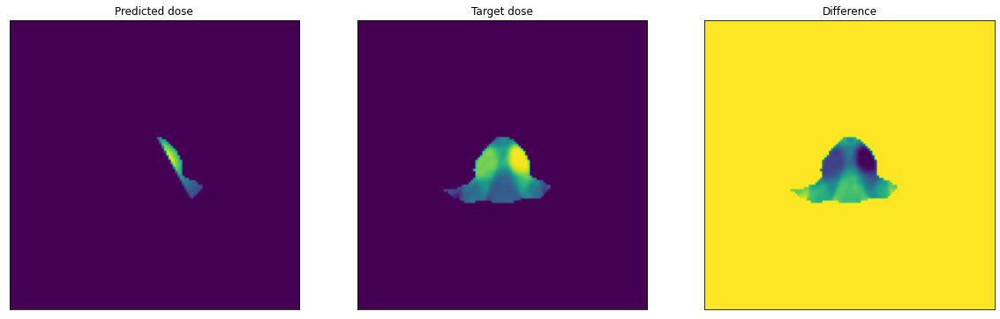

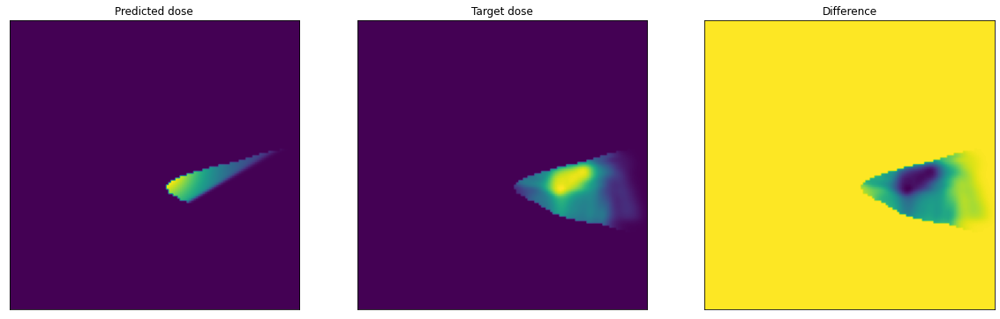

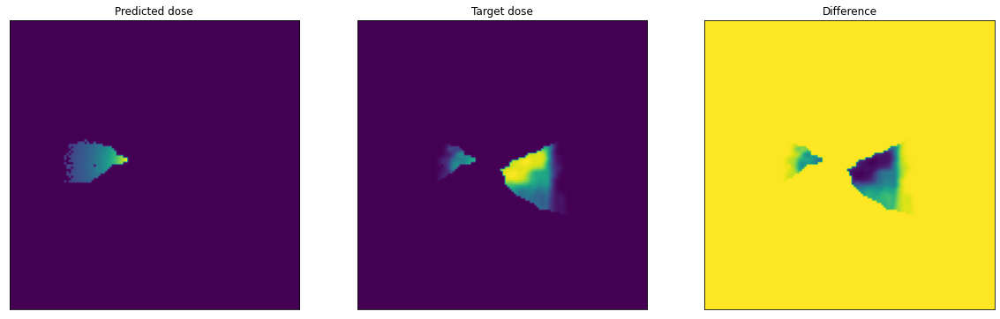

<Figure size 432x288 with 0 Axes>

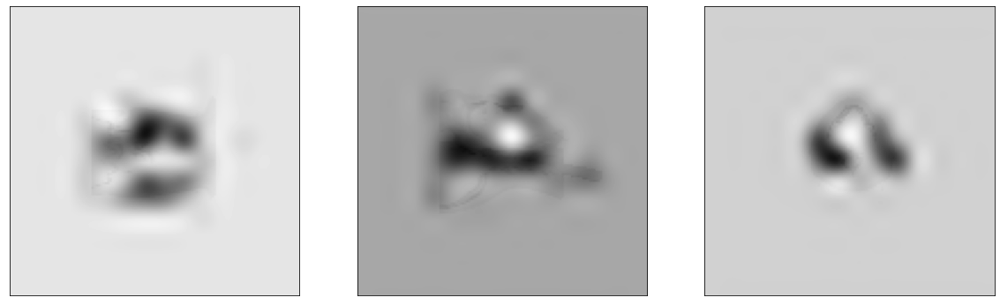

Epoch 3 performed in 173.964s



Epoch number 4 out of 200


EPOCH #4/200 - BATCH #1/150
Loading the data...
Data loaded in 0.388
Generator training...
Mean absolute error : 0.040
Generator trained in 0.800
Attention weight sigma  [[0.00014434561], [0.0]]
Total training time : 1.190s

--------------------------------------------------------------------------------

EPOCH #4/200 - BATCH #2/150
Loading the data...
Data loaded in 0.348
Generator training...
Mean absolute error : 0.036
Generator trained in 0.790
Attention weight sigma  [[0.00014786607], [0.0]]
Total training time : 1.140s

--------------------------------------------------------------------------------

EPOCH #4/200 - BATCH #3/150
Loading the data...
Data loaded in 0.395
Generator training...
Mean absolute error : 0.034
Generator trained in 0.800
Attention weight sigma  [[0.00015204879], [0.0]]
Total training time : 1.197s

--------------------------------------------------------------------------------

EPOCH #4/200 - BAT

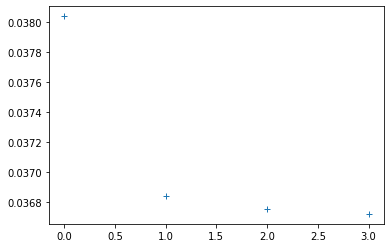

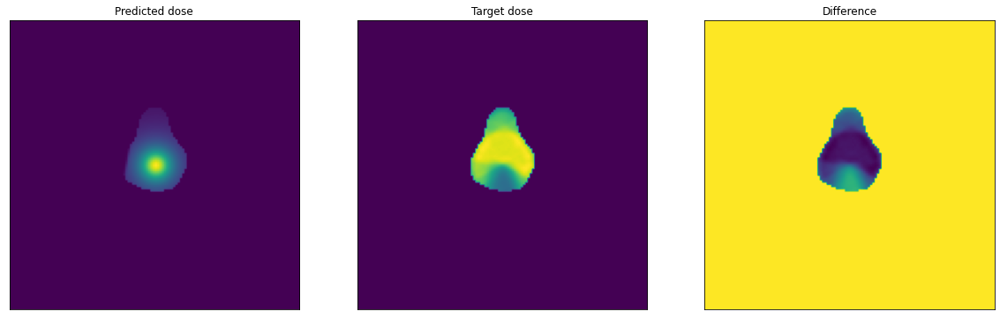

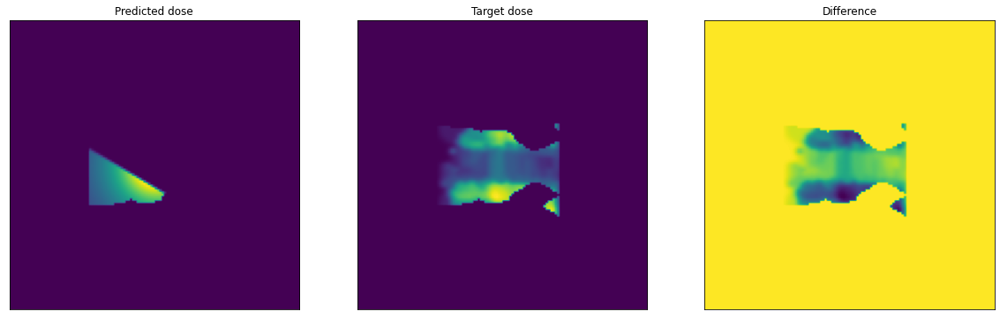

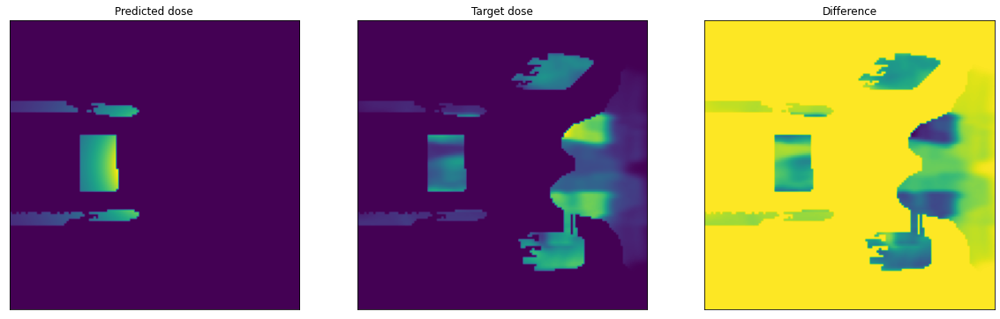

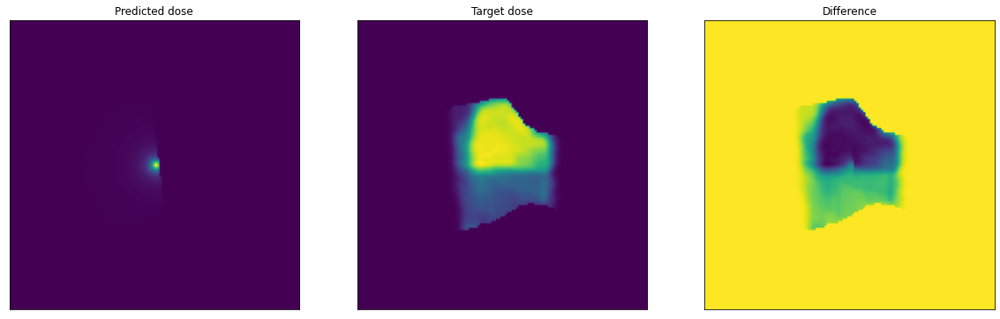

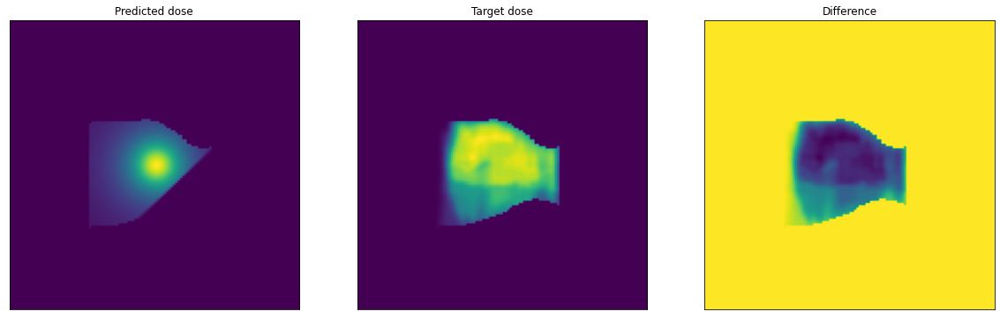

<Figure size 432x288 with 0 Axes>

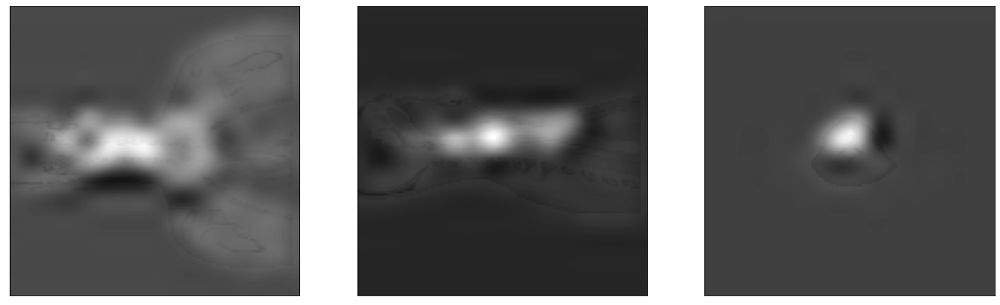

Epoch 4 performed in 174.838s



Epoch number 5 out of 200


EPOCH #5/200 - BATCH #1/150
Loading the data...
Data loaded in 0.391
Generator training...
Mean absolute error : 0.044
Generator trained in 0.810
Attention weight sigma  [[0.000121373756], [0.0]]
Total training time : 1.203s

--------------------------------------------------------------------------------

EPOCH #5/200 - BATCH #2/150
Loading the data...
Data loaded in 0.258
Generator training...
Mean absolute error : 0.035
Generator trained in 0.796
Attention weight sigma  [[0.000120695906], [0.0]]
Total training time : 1.056s

--------------------------------------------------------------------------------

EPOCH #5/200 - BATCH #3/150
Loading the data...
Data loaded in 0.406
Generator training...
Mean absolute error : 0.047
Generator trained in 0.808
Attention weight sigma  [[0.00012021476], [0.0]]
Total training time : 1.217s

--------------------------------------------------------------------------------

EPOCH #5/200 - B

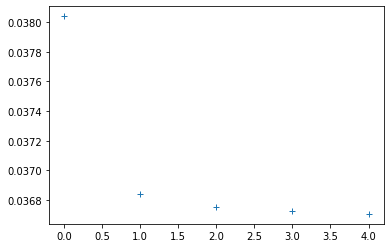

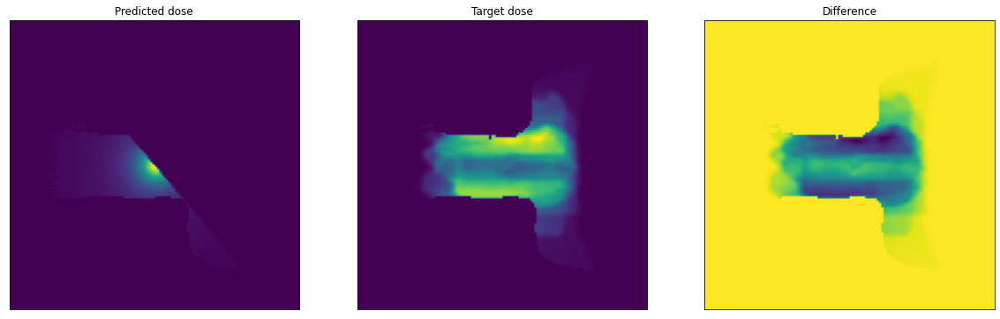

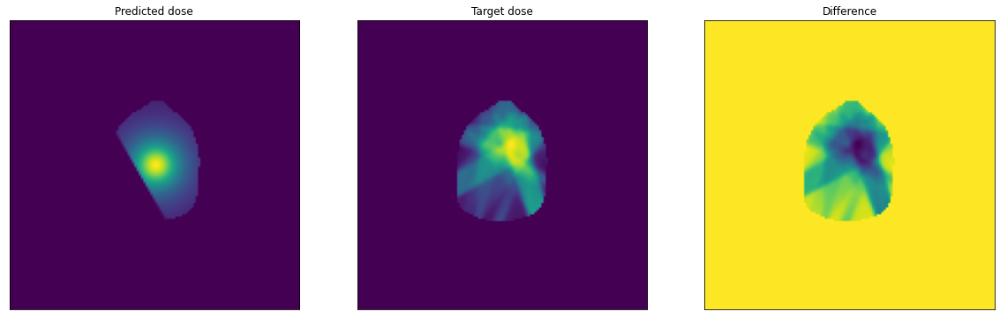

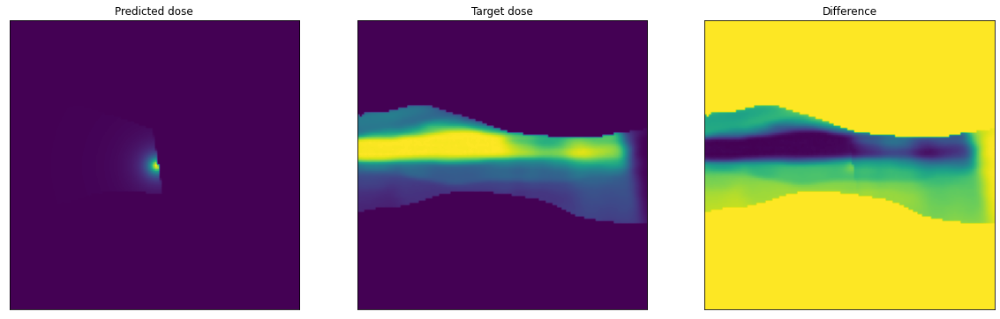

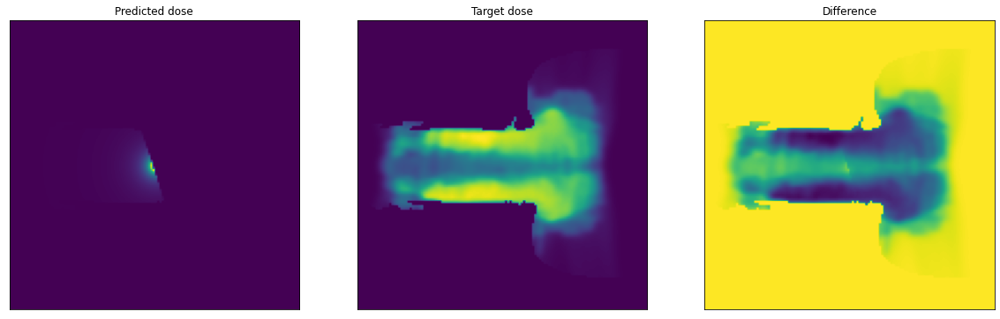

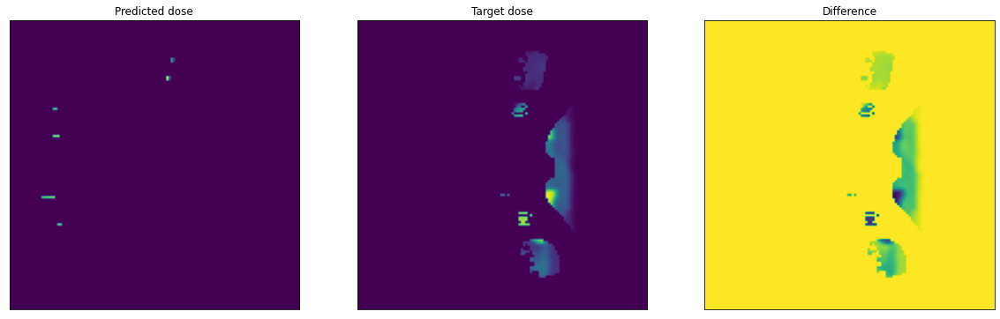

<Figure size 432x288 with 0 Axes>

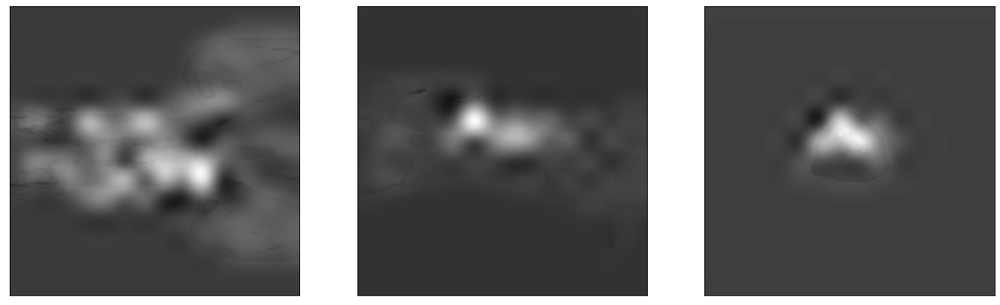

Epoch 5 performed in 175.232s



Epoch number 6 out of 200


EPOCH #6/200 - BATCH #1/150
Loading the data...
Data loaded in 0.419
Generator training...
Mean absolute error : 0.042
Generator trained in 0.813
Attention weight sigma  [[0.00015381051], [0.0]]
Total training time : 1.234s

--------------------------------------------------------------------------------

EPOCH #6/200 - BATCH #2/150
Loading the data...
Data loaded in 0.245
Generator training...
Mean absolute error : 0.029
Generator trained in 0.793
Attention weight sigma  [[0.0001561919], [0.0]]
Total training time : 1.040s

--------------------------------------------------------------------------------

EPOCH #6/200 - BATCH #3/150
Loading the data...
Data loaded in 0.368
Generator training...
Mean absolute error : 0.038
Generator trained in 0.796
Attention weight sigma  [[0.00015681208], [0.0]]
Total training time : 1.166s

--------------------------------------------------------------------------------

EPOCH #6/200 - BATC

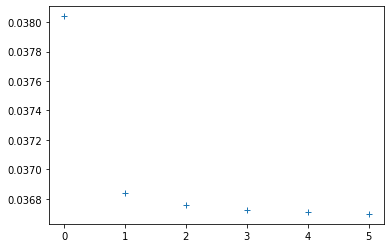

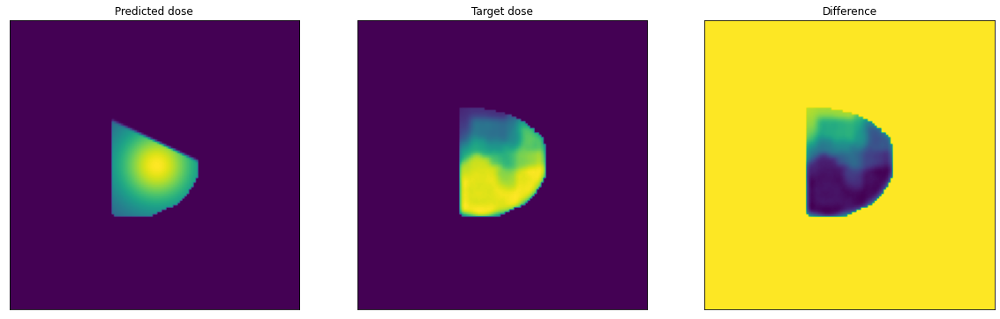

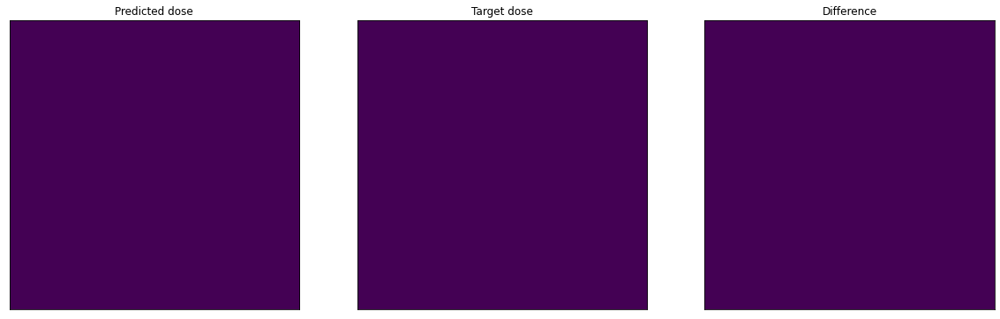

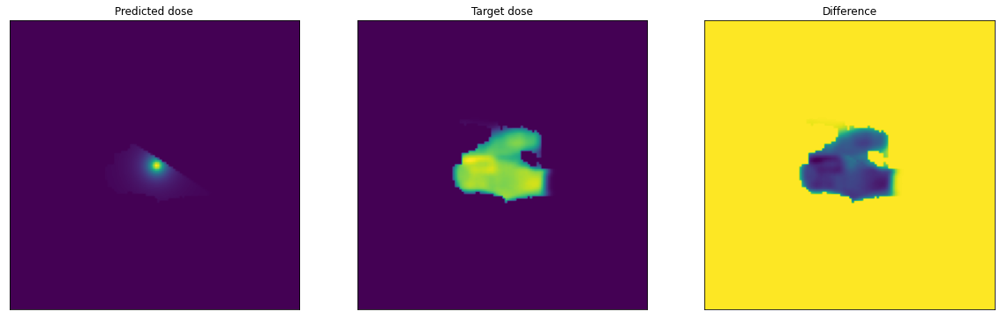

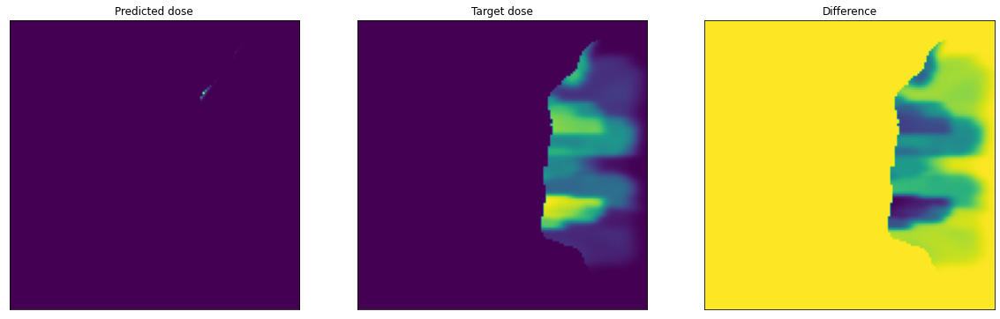

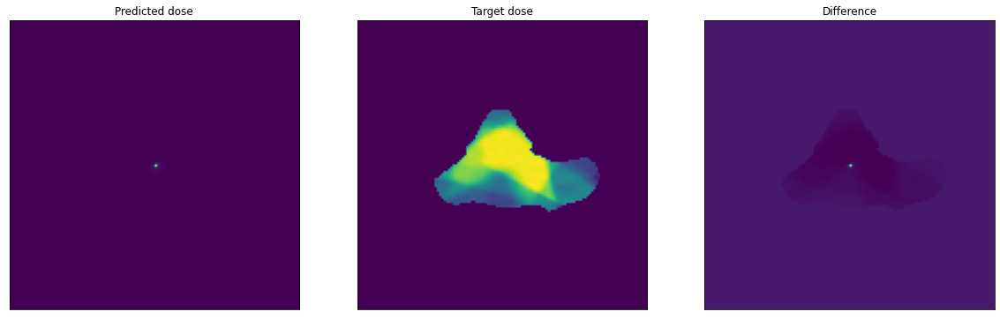

<Figure size 432x288 with 0 Axes>

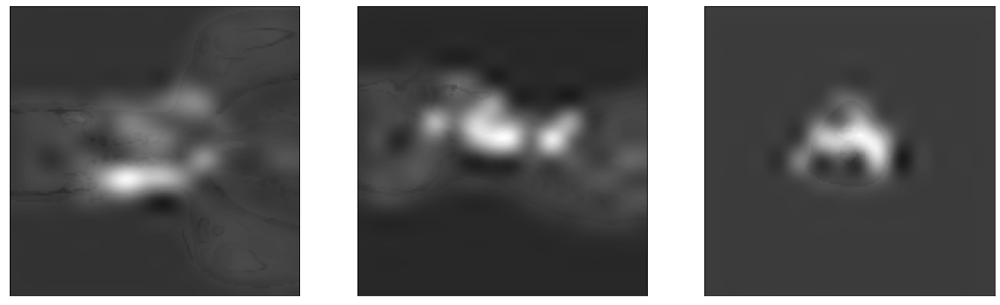

Epoch 6 performed in 173.650s



Epoch number 7 out of 200


EPOCH #7/200 - BATCH #1/150
Loading the data...
Data loaded in 0.270
Generator training...
Mean absolute error : 0.024
Generator trained in 0.794
Attention weight sigma  [[0.00014272617], [0.0]]
Total training time : 1.067s

--------------------------------------------------------------------------------

EPOCH #7/200 - BATCH #2/150
Loading the data...
Data loaded in 0.232
Generator training...
Mean absolute error : 0.029
Generator trained in 0.788
Attention weight sigma  [[0.00014256031], [0.0]]
Total training time : 1.022s

--------------------------------------------------------------------------------

EPOCH #7/200 - BATCH #3/150
Loading the data...
Data loaded in 0.210
Generator training...
Mean absolute error : 0.027
Generator trained in 0.790
Attention weight sigma  [[0.00014323443], [0.0]]
Total training time : 1.002s

--------------------------------------------------------------------------------

EPOCH #7/200 - BAT

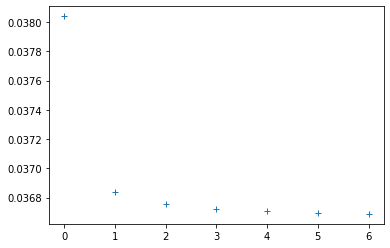

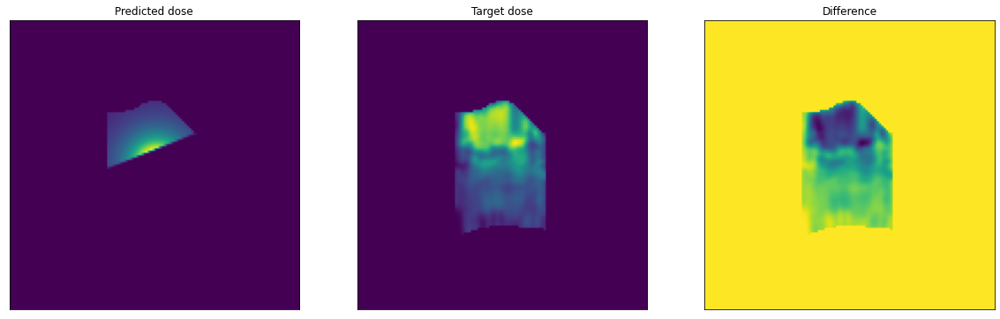

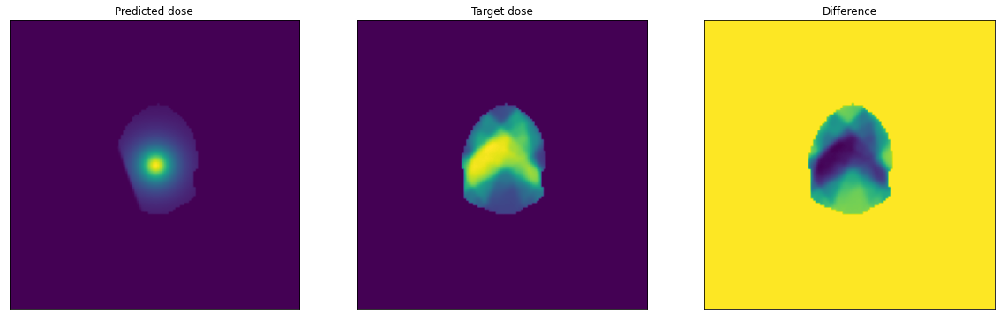

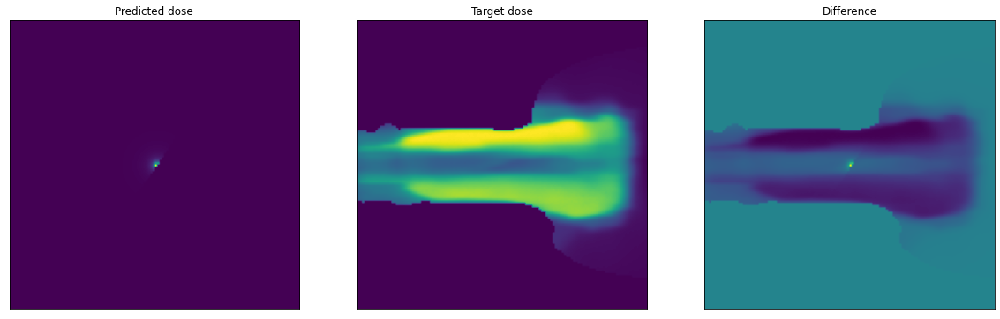

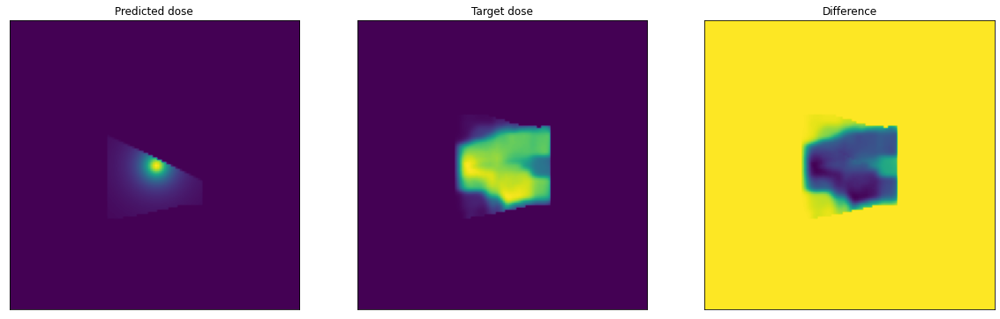

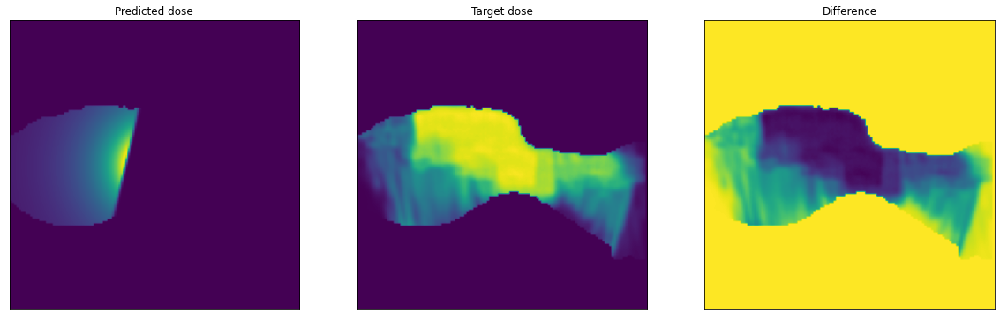

<Figure size 432x288 with 0 Axes>

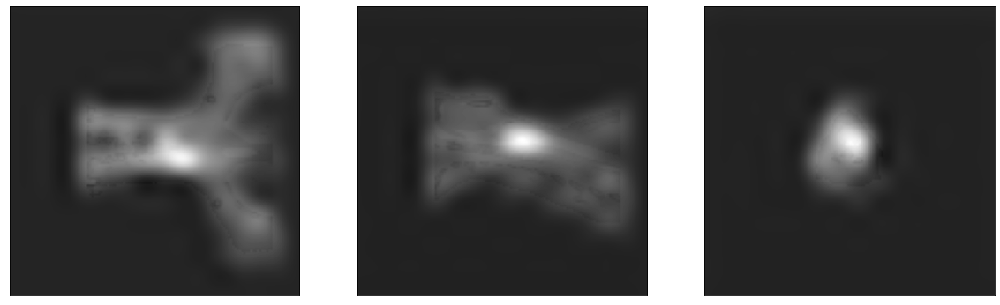

Epoch 7 performed in 173.230s



Epoch number 8 out of 200


EPOCH #8/200 - BATCH #1/150
Loading the data...
Data loaded in 0.298
Generator training...
Mean absolute error : 0.035
Generator trained in 0.793
Attention weight sigma  [[0.00014241689], [0.0]]
Total training time : 1.094s

--------------------------------------------------------------------------------

EPOCH #8/200 - BATCH #2/150
Loading the data...
Data loaded in 0.248
Generator training...
Mean absolute error : 0.029
Generator trained in 0.792
Attention weight sigma  [[0.00014239704], [0.0]]
Total training time : 1.042s

--------------------------------------------------------------------------------

EPOCH #8/200 - BATCH #3/150
Loading the data...
Data loaded in 0.388
Generator training...
Mean absolute error : 0.034
Generator trained in 0.799
Attention weight sigma  [[0.00014166297], [0.0]]
Total training time : 1.190s

--------------------------------------------------------------------------------

EPOCH #8/200 - BAT

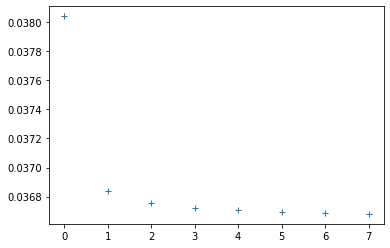

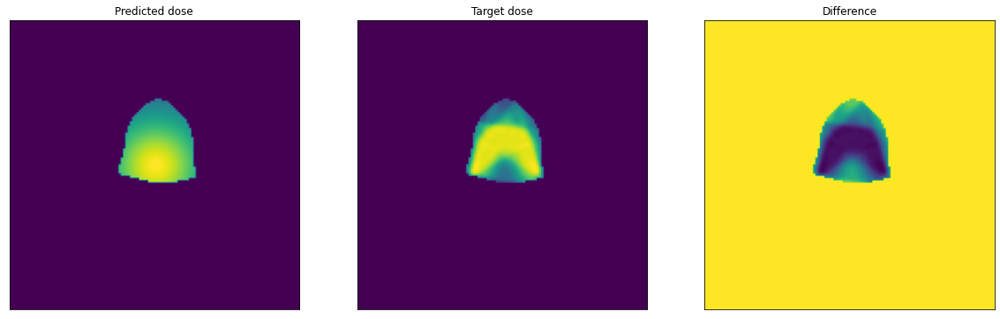

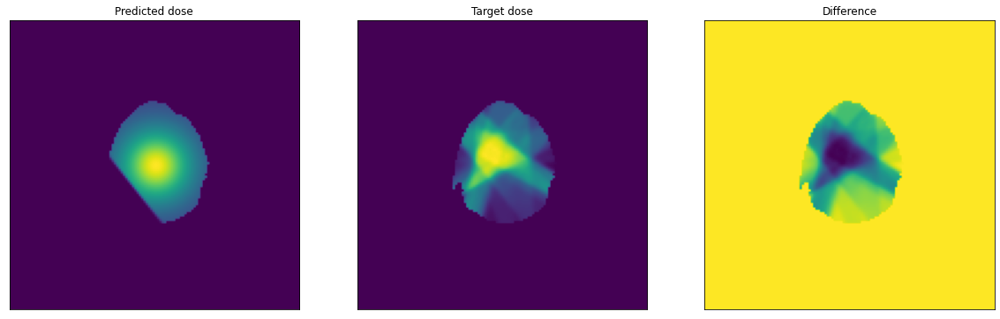

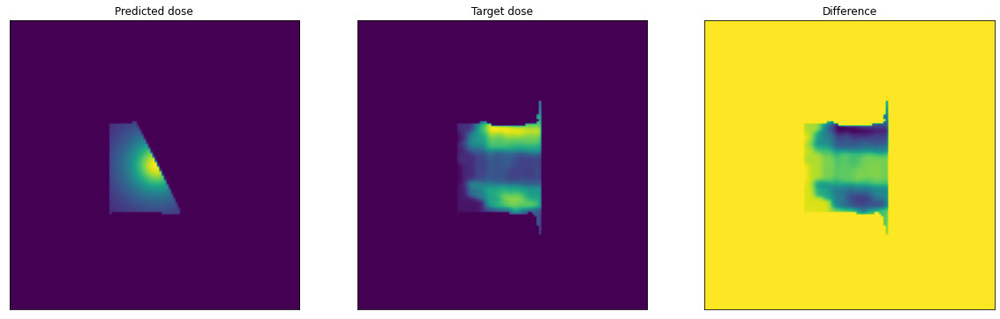

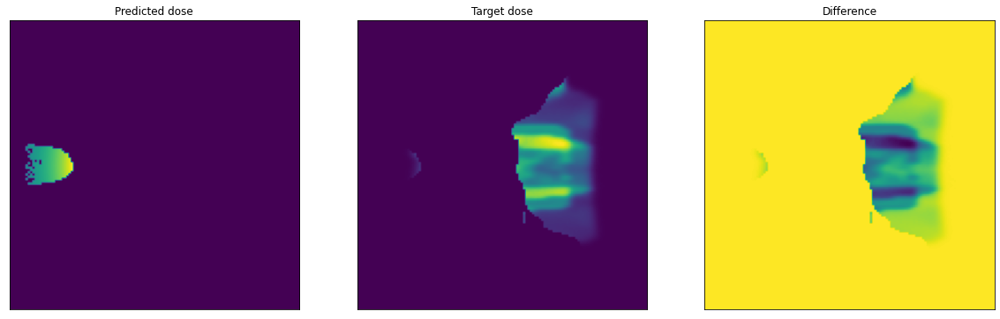

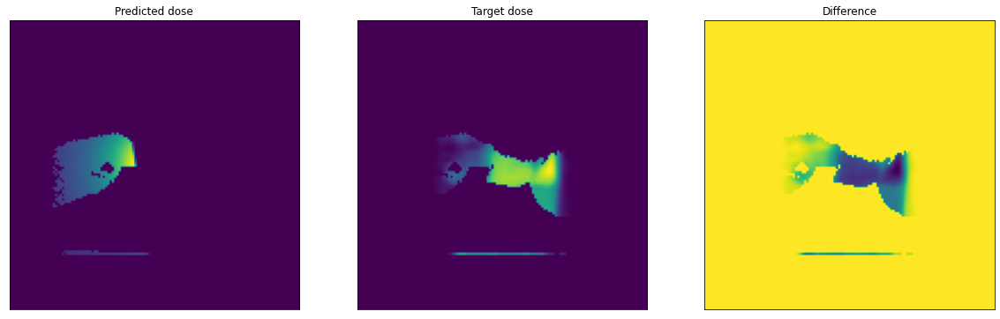

<Figure size 432x288 with 0 Axes>

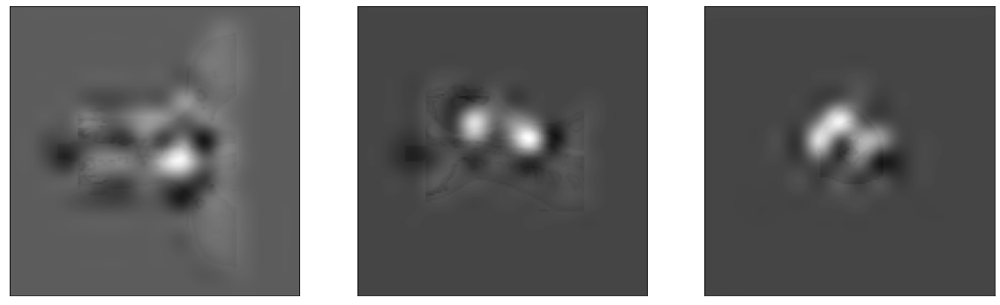

Epoch 8 performed in 174.256s



Epoch number 9 out of 200


EPOCH #9/200 - BATCH #1/150
Loading the data...
Data loaded in 0.358
Generator training...
Mean absolute error : 0.037
Generator trained in 0.800
Attention weight sigma  [[0.00014564097], [0.0]]
Total training time : 1.161s

--------------------------------------------------------------------------------

EPOCH #9/200 - BATCH #2/150
Loading the data...
Data loaded in 0.269
Generator training...
Mean absolute error : 0.024
Generator trained in 0.789
Attention weight sigma  [[0.00014576518], [0.0]]
Total training time : 1.060s

--------------------------------------------------------------------------------

EPOCH #9/200 - BATCH #3/150
Loading the data...
Data loaded in 0.180
Generator training...
Mean absolute error : 0.022
Generator trained in 0.789
Attention weight sigma  [[0.00014580763], [0.0]]
Total training time : 0.971s

--------------------------------------------------------------------------------

EPOCH #9/200 - BAT

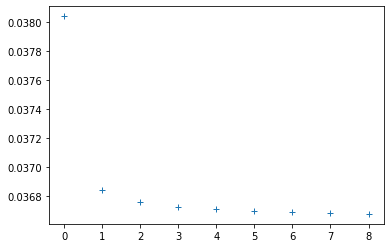

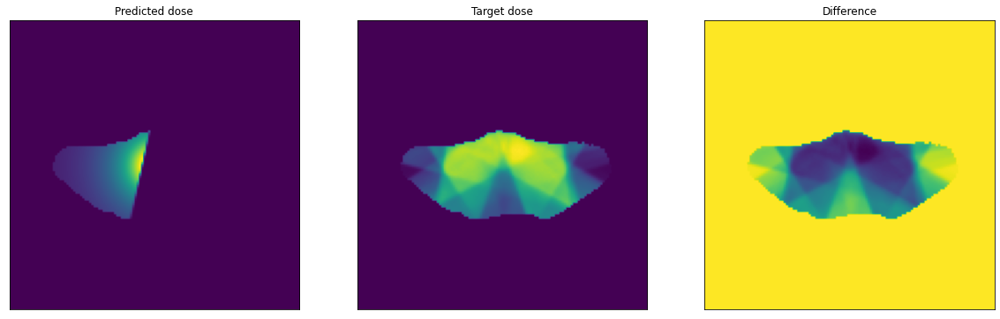

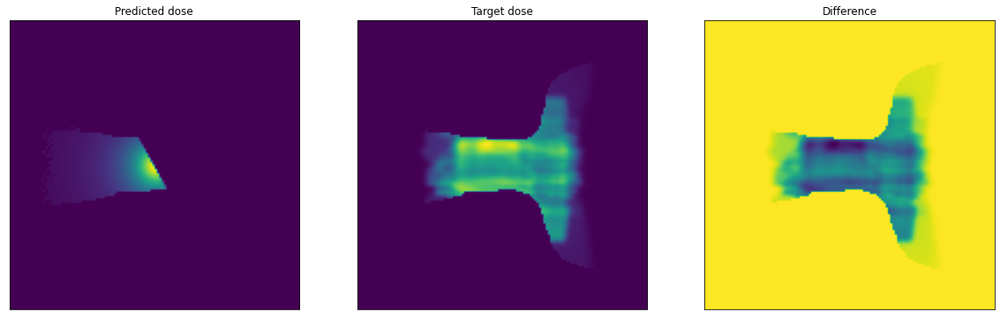

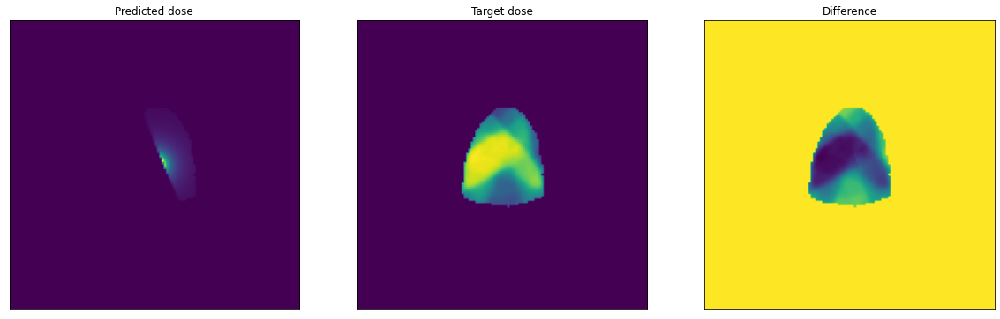

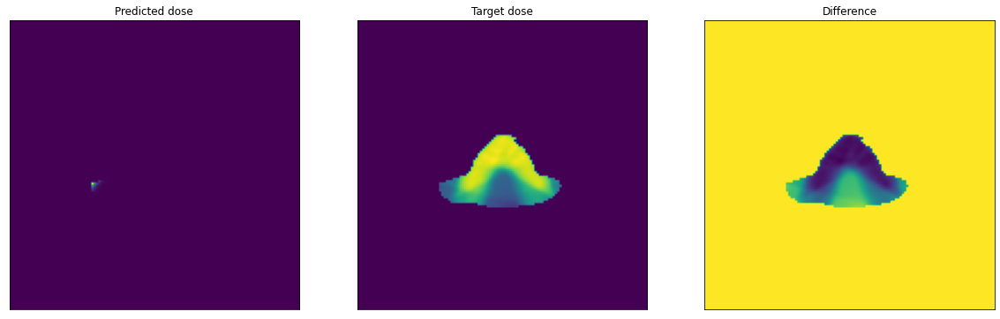

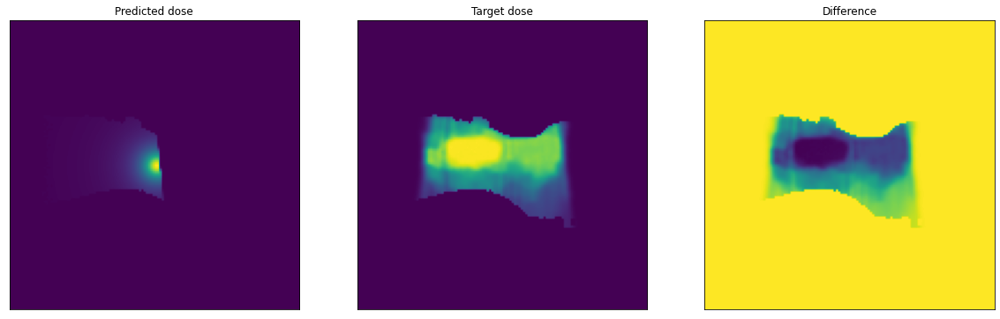

<Figure size 432x288 with 0 Axes>

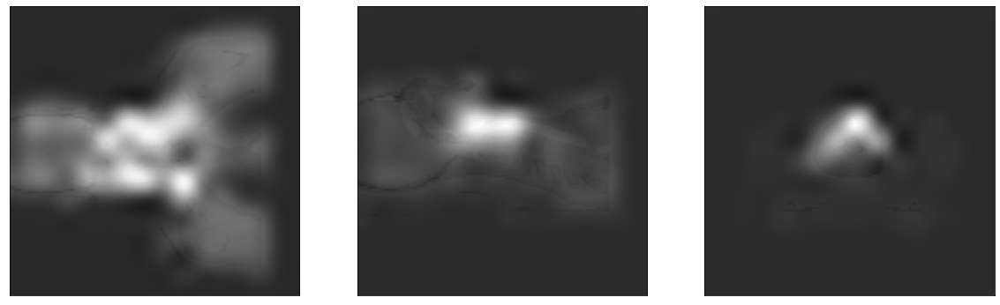

Epoch 9 performed in 172.326s



Epoch number 10 out of 200


EPOCH #10/200 - BATCH #1/150
Loading the data...
Data loaded in 0.240
Generator training...
Mean absolute error : 0.027
Generator trained in 0.787
Attention weight sigma  [[0.0001511483], [0.0]]
Total training time : 1.029s

--------------------------------------------------------------------------------

EPOCH #10/200 - BATCH #2/150
Loading the data...
Data loaded in 0.321
Generator training...
Mean absolute error : 0.032
Generator trained in 0.790
Attention weight sigma  [[0.00015107315], [0.0]]
Total training time : 1.113s

--------------------------------------------------------------------------------

EPOCH #10/200 - BATCH #3/150
Loading the data...
Data loaded in 0.245
Generator training...
Mean absolute error : 0.035
Generator trained in 0.791
Attention weight sigma  [[0.00015062006], [0.0]]
Total training time : 1.039s

--------------------------------------------------------------------------------

EPOCH #10/200 -

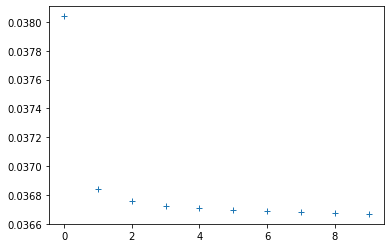

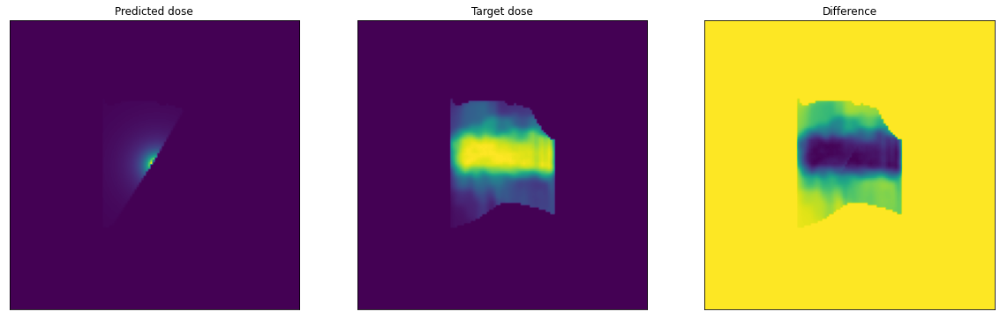

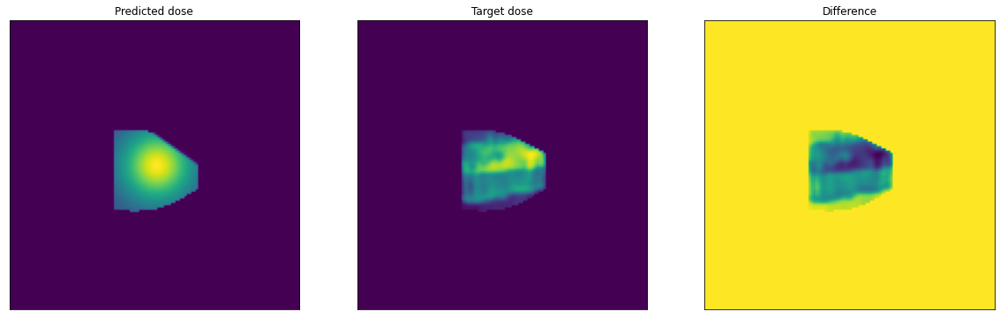

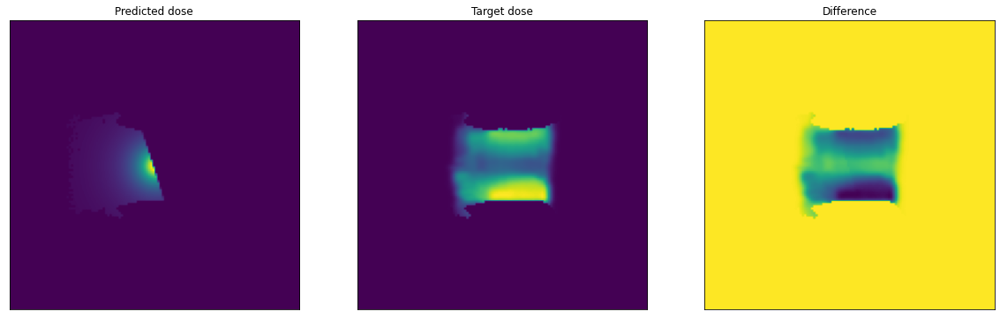

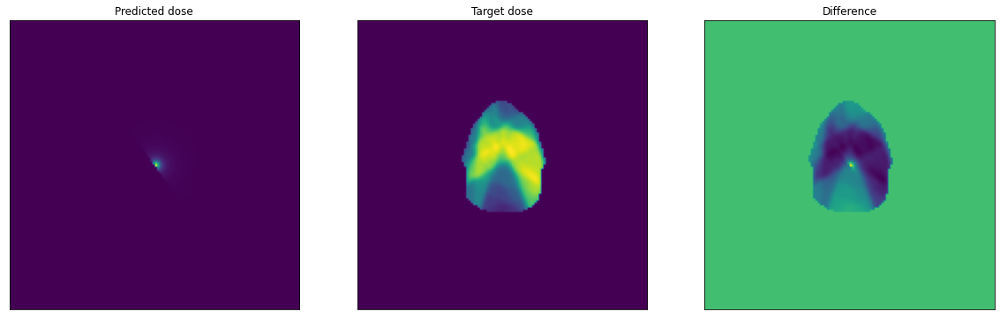

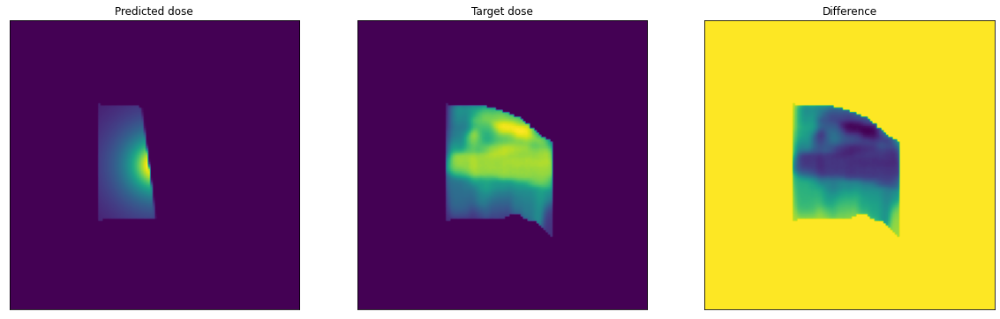

<Figure size 432x288 with 0 Axes>

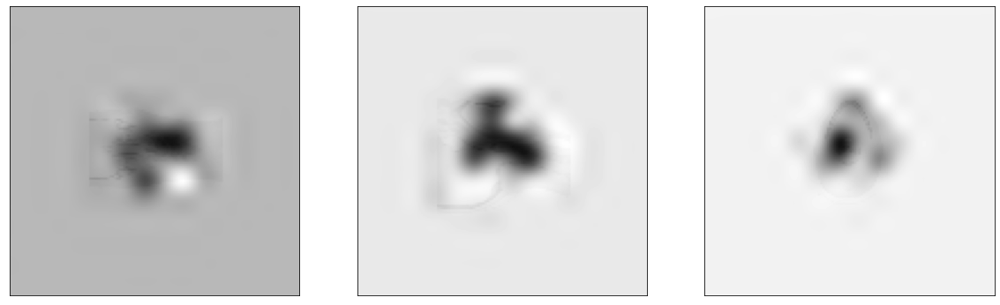

Epoch 10 performed in 172.937s



Epoch number 11 out of 200


EPOCH #11/200 - BATCH #1/150
Loading the data...
Data loaded in 0.227
Generator training...
Mean absolute error : 0.029
Generator trained in 0.790
Attention weight sigma  [[0.00013594181], [0.0]]
Total training time : 1.019s

--------------------------------------------------------------------------------

EPOCH #11/200 - BATCH #2/150
Loading the data...
Data loaded in 0.306
Generator training...
Mean absolute error : 0.034
Generator trained in 0.810
Attention weight sigma  [[0.00013607282], [0.0]]
Total training time : 1.119s

--------------------------------------------------------------------------------

EPOCH #11/200 - BATCH #3/150
Loading the data...
Data loaded in 0.227
Generator training...
Mean absolute error : 0.029
Generator trained in 0.795
Attention weight sigma  [[0.00013575966], [0.0]]
Total training time : 1.024s

--------------------------------------------------------------------------------

EPOCH #11/200

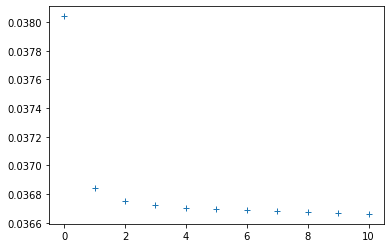

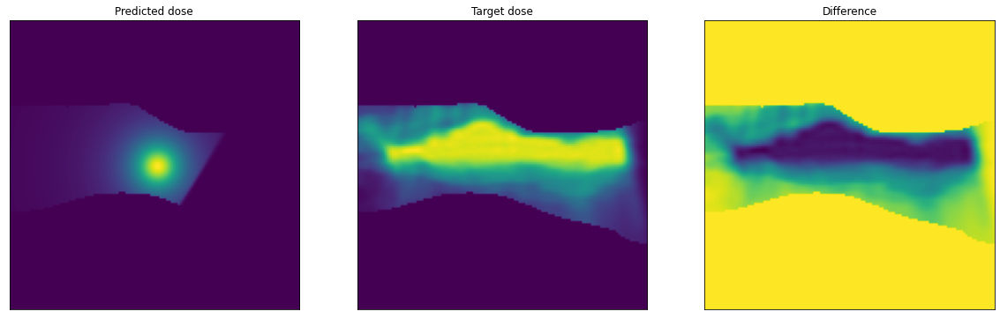

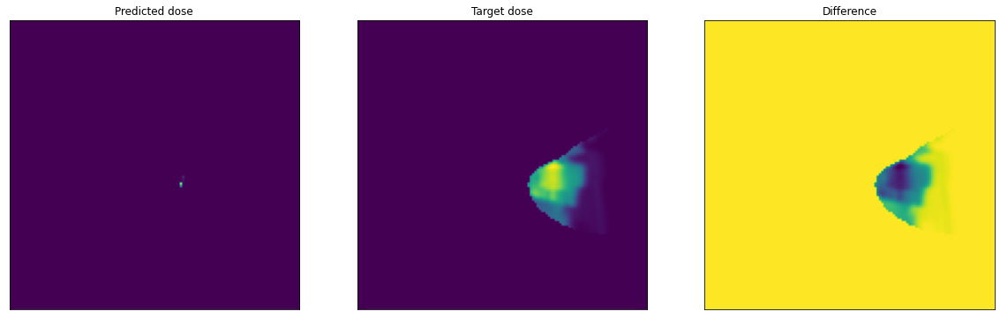

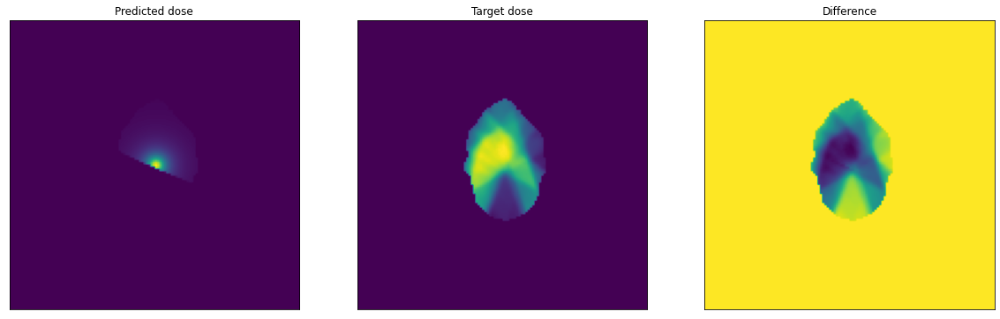

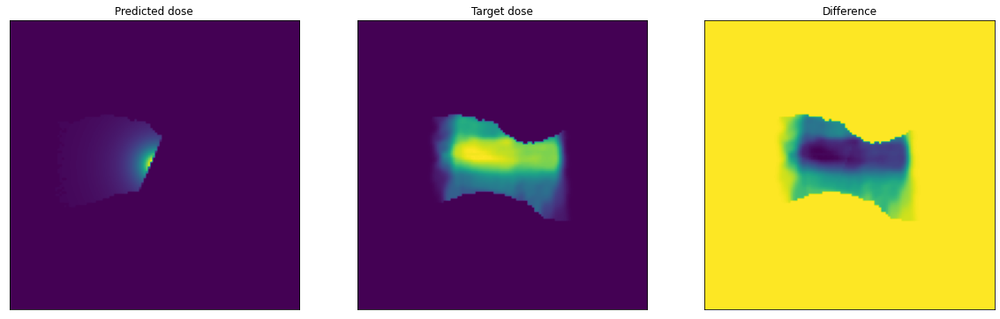

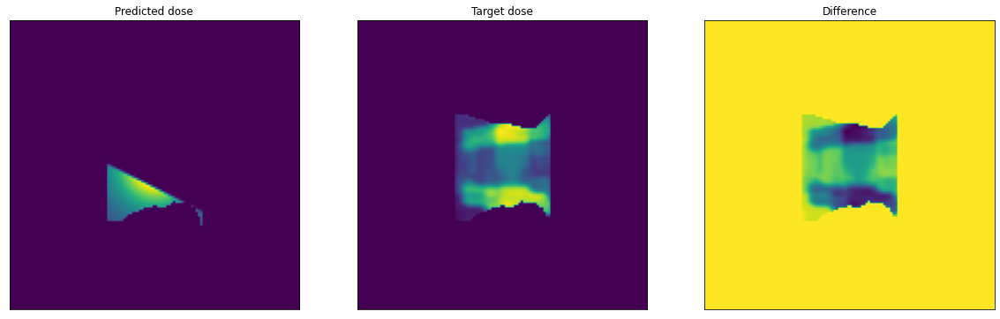

<Figure size 432x288 with 0 Axes>

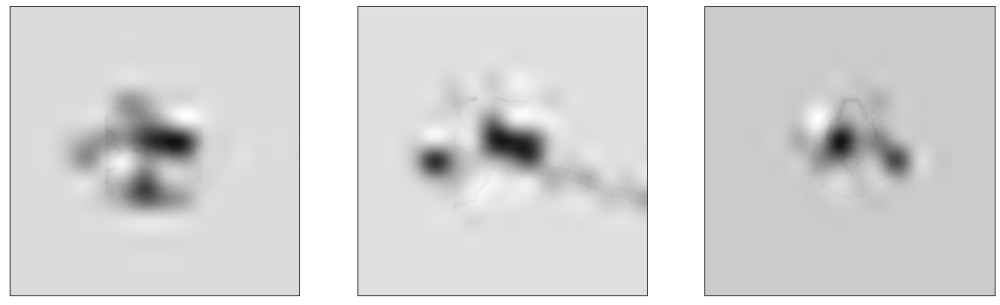

Epoch 11 performed in 173.330s



Epoch number 12 out of 200


EPOCH #12/200 - BATCH #1/150
Loading the data...
Data loaded in 0.292
Generator training...
Mean absolute error : 0.030
Generator trained in 0.791
Attention weight sigma  [[0.00012489114], [0.0]]
Total training time : 1.085s

--------------------------------------------------------------------------------

EPOCH #12/200 - BATCH #2/150
Loading the data...
Data loaded in 0.355
Generator training...
Mean absolute error : 0.044
Generator trained in 0.789
Attention weight sigma  [[0.00012519976], [0.0]]
Total training time : 1.147s

--------------------------------------------------------------------------------

EPOCH #12/200 - BATCH #3/150
Loading the data...
Data loaded in 0.471
Generator training...
Mean absolute error : 0.058
Generator trained in 0.809
Attention weight sigma  [[0.00012550474], [0.0]]
Total training time : 1.282s

--------------------------------------------------------------------------------

EPOCH #12/200

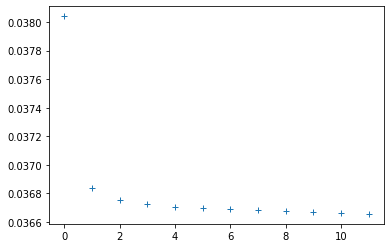

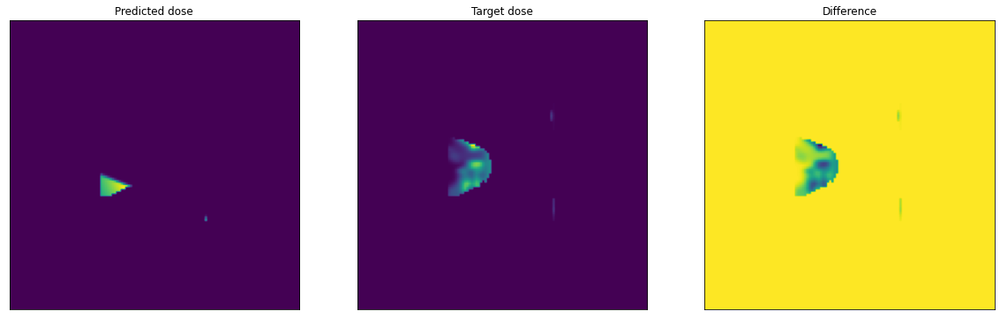

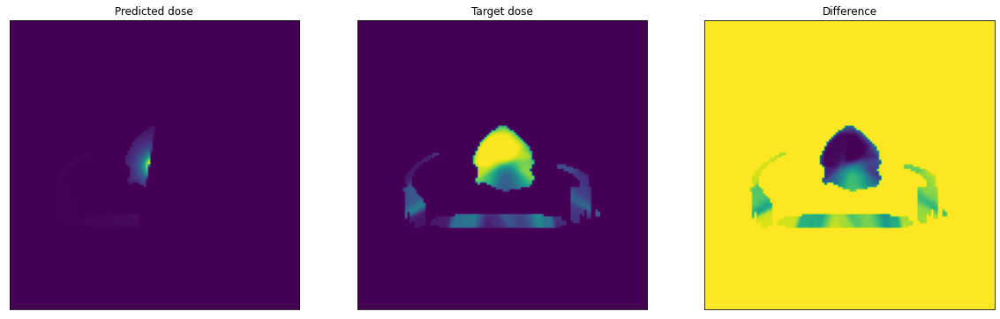

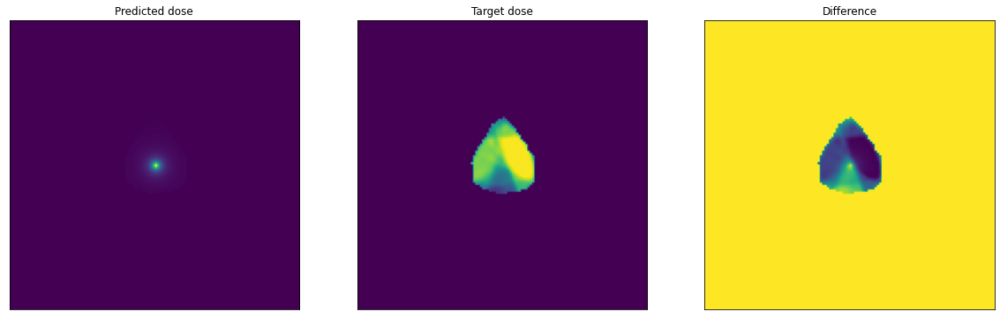

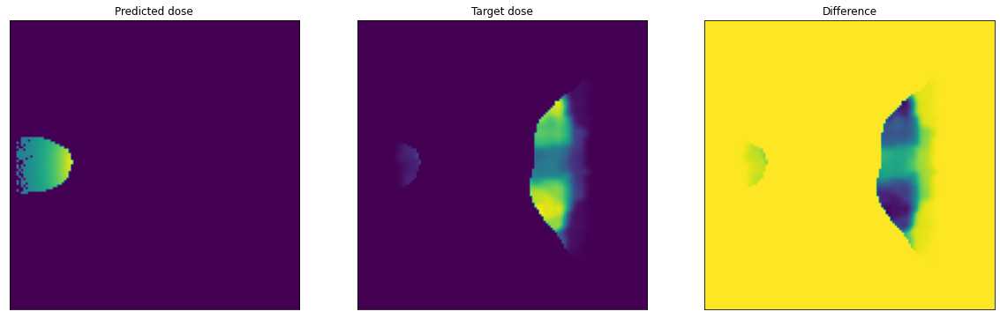

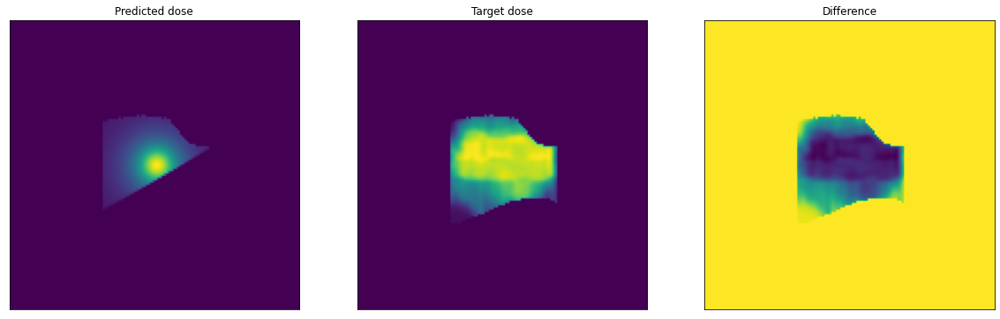

<Figure size 432x288 with 0 Axes>

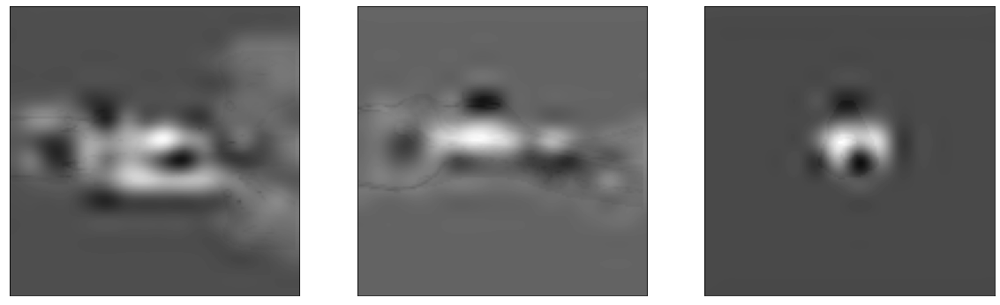

Epoch 12 performed in 172.952s



Epoch number 13 out of 200


EPOCH #13/200 - BATCH #1/150
Loading the data...
Data loaded in 0.386
Generator training...
Mean absolute error : 0.041
Generator trained in 0.803
Attention weight sigma  [[0.00012784879], [0.0]]
Total training time : 1.192s

--------------------------------------------------------------------------------

EPOCH #13/200 - BATCH #2/150
Loading the data...
Data loaded in 0.340
Generator training...
Mean absolute error : 0.040
Generator trained in 0.797
Attention weight sigma  [[0.00012712495], [0.0]]
Total training time : 1.140s

--------------------------------------------------------------------------------

EPOCH #13/200 - BATCH #3/150
Loading the data...
Data loaded in 0.383
Generator training...
Mean absolute error : 0.037
Generator trained in 0.791
Attention weight sigma  [[0.00012665521], [0.0]]
Total training time : 1.176s

--------------------------------------------------------------------------------

EPOCH #13/200

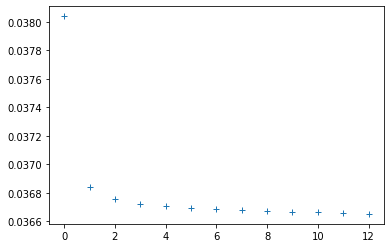

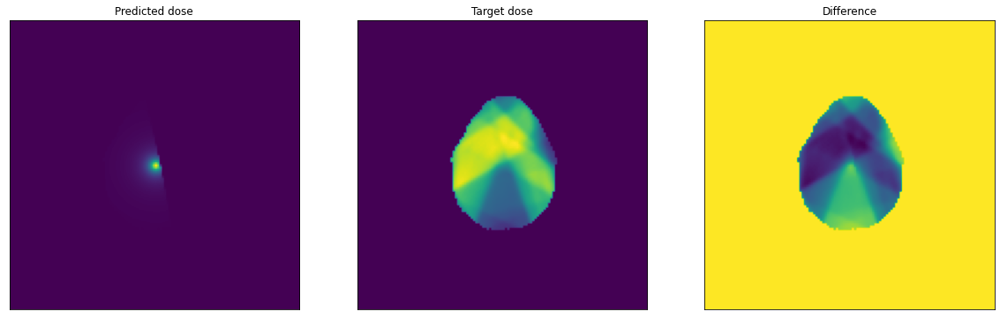

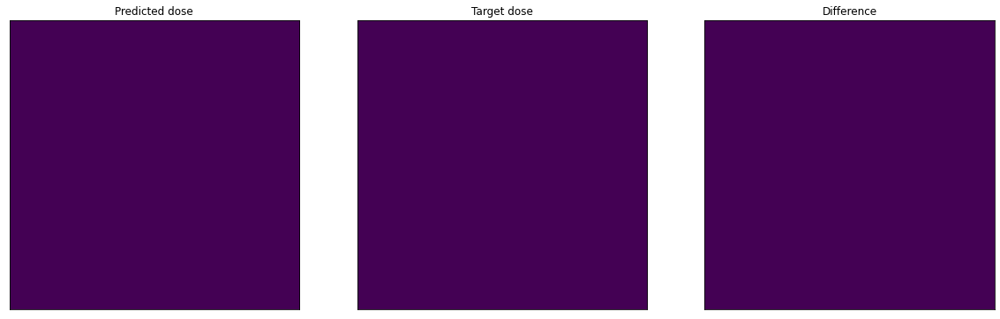

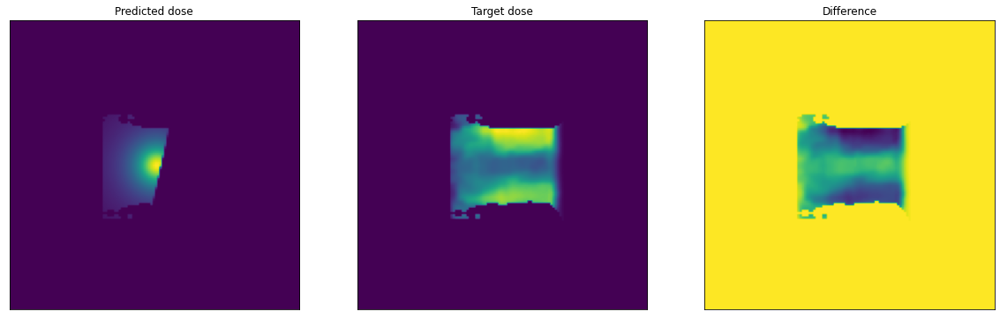

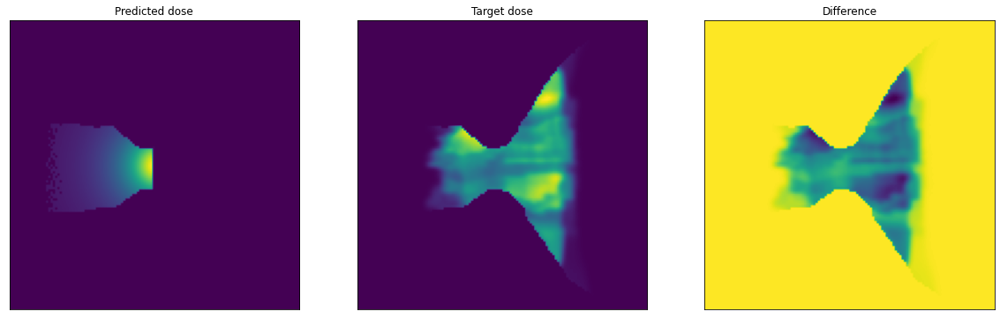

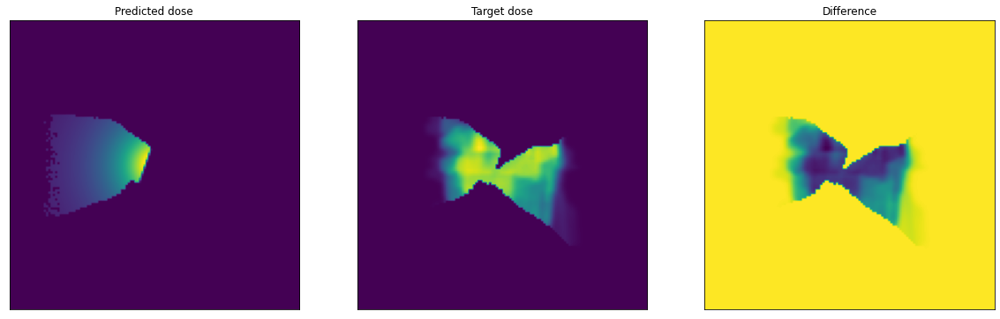

<Figure size 432x288 with 0 Axes>

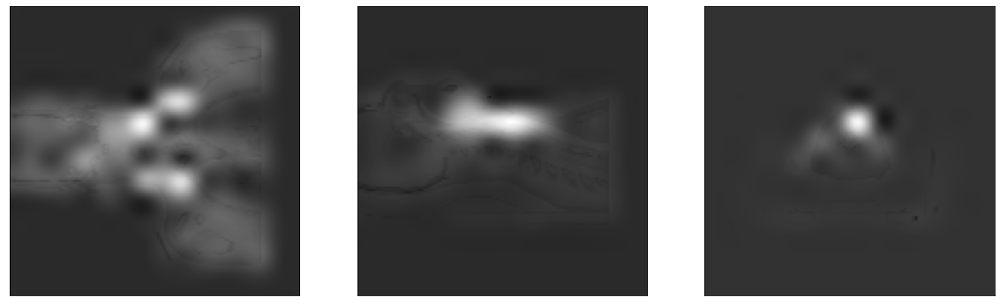

Epoch 13 performed in 173.704s



Epoch number 14 out of 200


EPOCH #14/200 - BATCH #1/150
Loading the data...
Data loaded in 0.404
Generator training...
Mean absolute error : 0.048
Generator trained in 0.816
Attention weight sigma  [[0.00012377226], [0.0]]
Total training time : 1.222s

--------------------------------------------------------------------------------

EPOCH #14/200 - BATCH #2/150
Loading the data...
Data loaded in 0.230
Generator training...
Mean absolute error : 0.030
Generator trained in 0.792
Attention weight sigma  [[0.00012354368], [0.0]]
Total training time : 1.024s

--------------------------------------------------------------------------------

EPOCH #14/200 - BATCH #3/150
Loading the data...
Data loaded in 0.262
Generator training...
Mean absolute error : 0.033
Generator trained in 0.796
Attention weight sigma  [[0.00012352997], [0.0]]
Total training time : 1.060s

--------------------------------------------------------------------------------

EPOCH #14/200

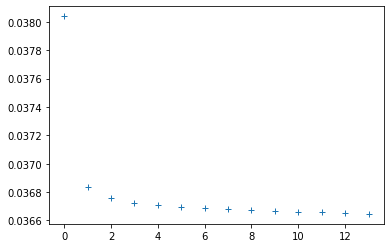

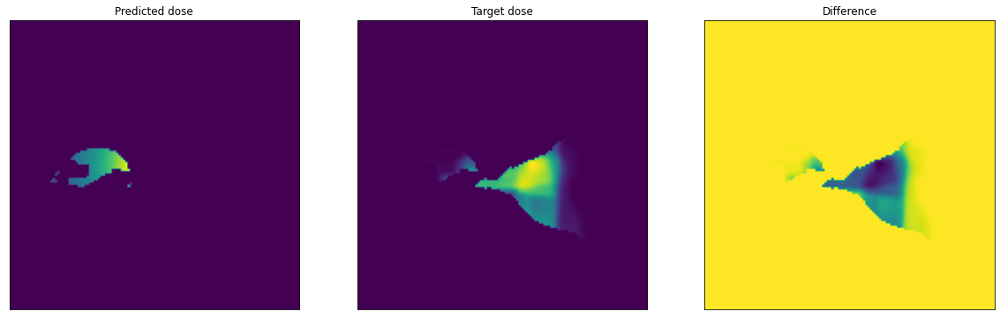

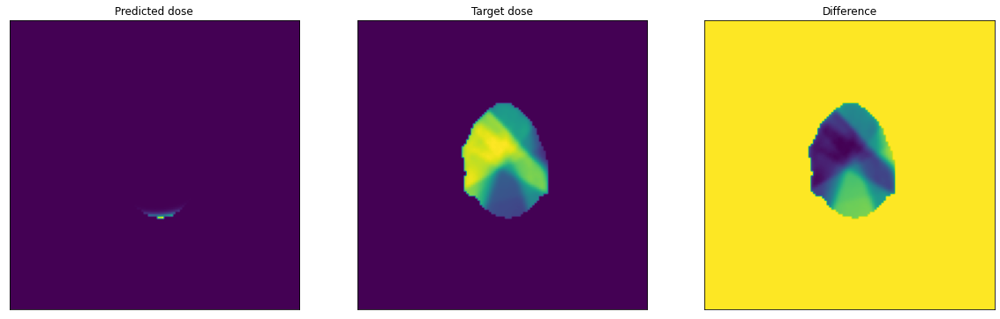

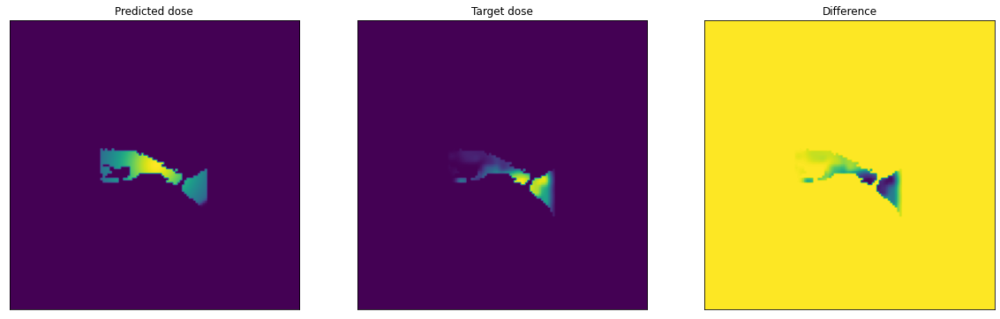

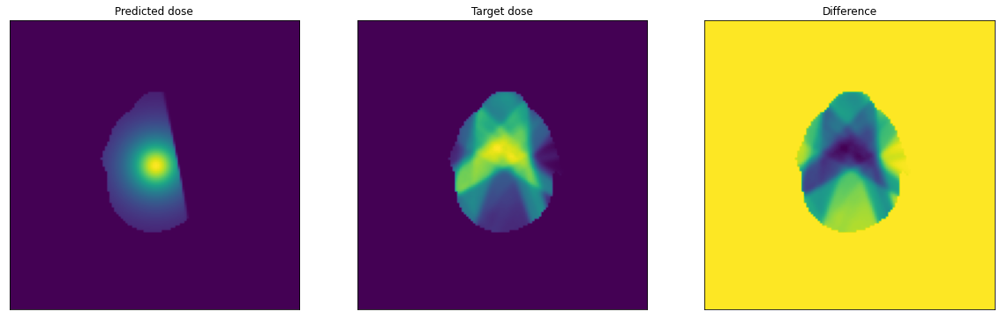

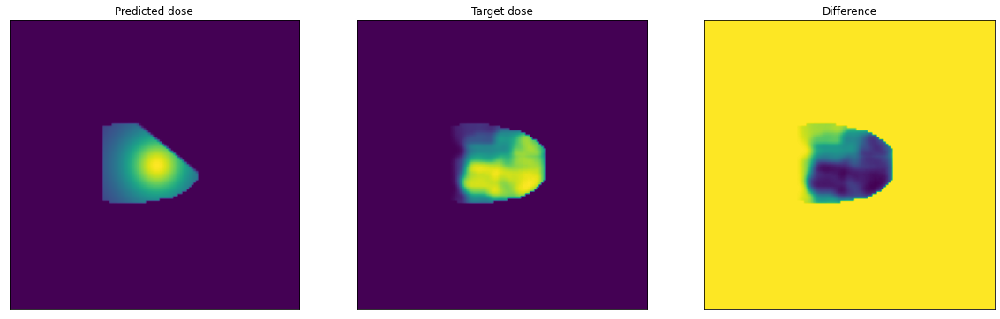

<Figure size 432x288 with 0 Axes>

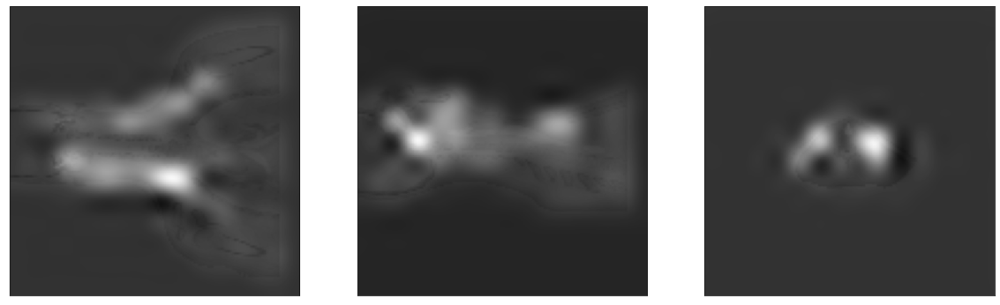

Epoch 14 performed in 173.668s



Epoch number 15 out of 200


EPOCH #15/200 - BATCH #1/150
Loading the data...
Data loaded in 0.259
Generator training...
Mean absolute error : 0.032
Generator trained in 0.787
Attention weight sigma  [[0.0001304609], [0.0]]
Total training time : 1.049s

--------------------------------------------------------------------------------

EPOCH #15/200 - BATCH #2/150
Loading the data...
Data loaded in 0.422
Generator training...
Mean absolute error : 0.042
Generator trained in 0.792
Attention weight sigma  [[0.00012885543], [0.0]]
Total training time : 1.216s

--------------------------------------------------------------------------------

EPOCH #15/200 - BATCH #3/150
Loading the data...
Data loaded in 0.293
Generator training...
Mean absolute error : 0.029
Generator trained in 0.786
Attention weight sigma  [[0.00012801428], [0.0]]
Total training time : 1.081s

--------------------------------------------------------------------------------

EPOCH #15/200 

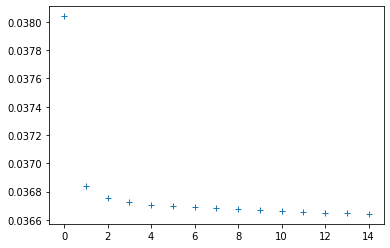

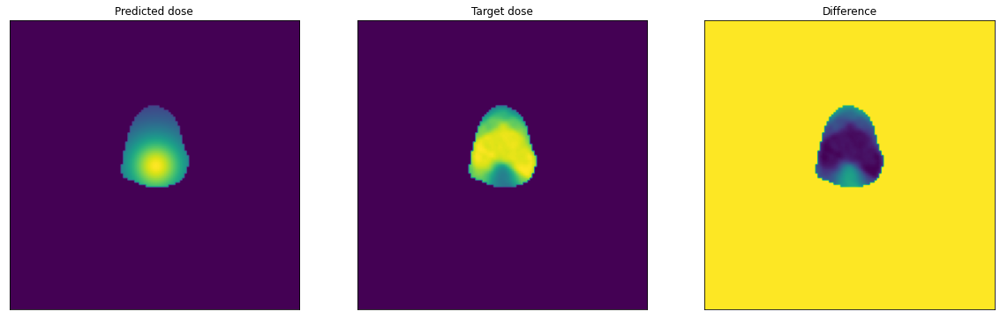

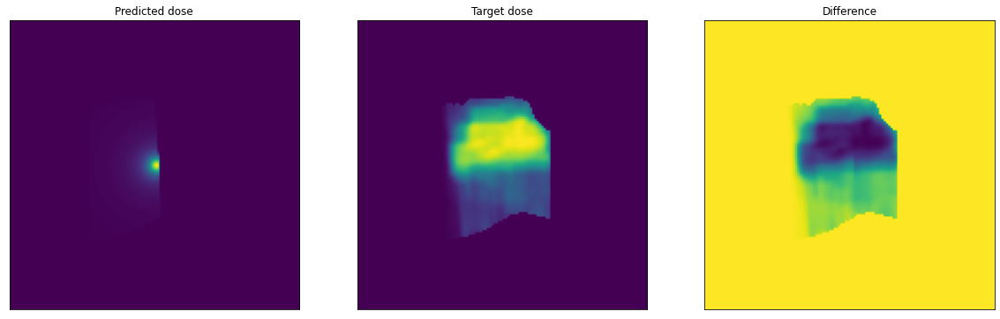

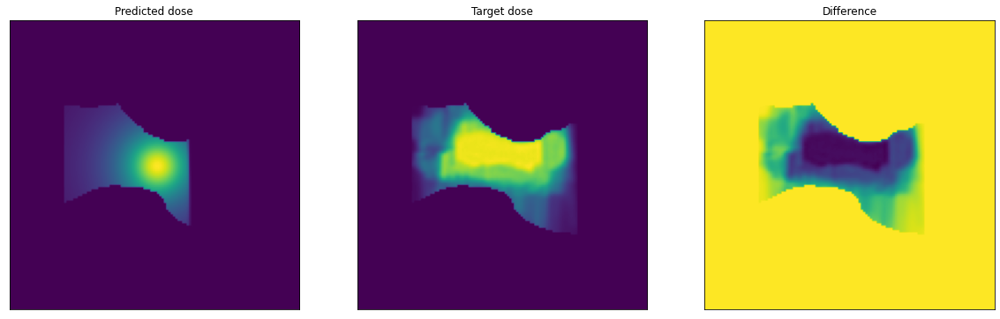

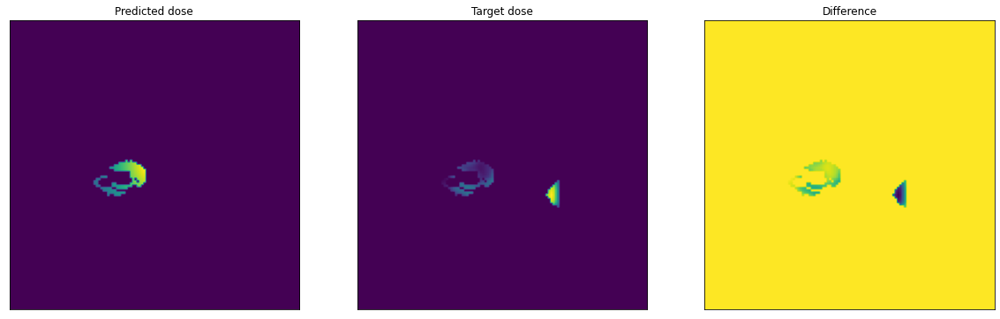

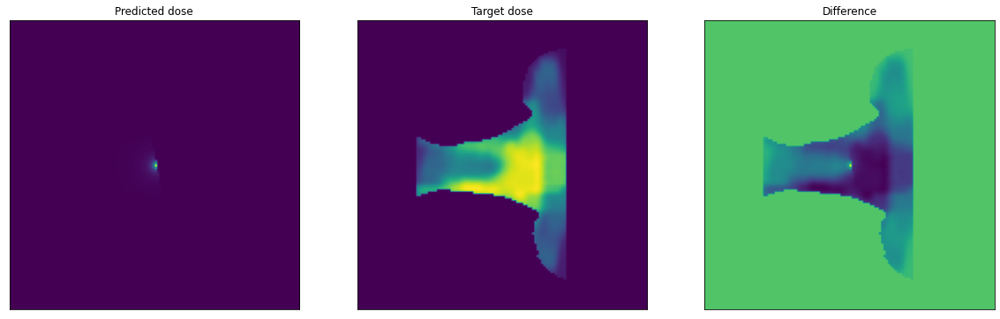

<Figure size 432x288 with 0 Axes>

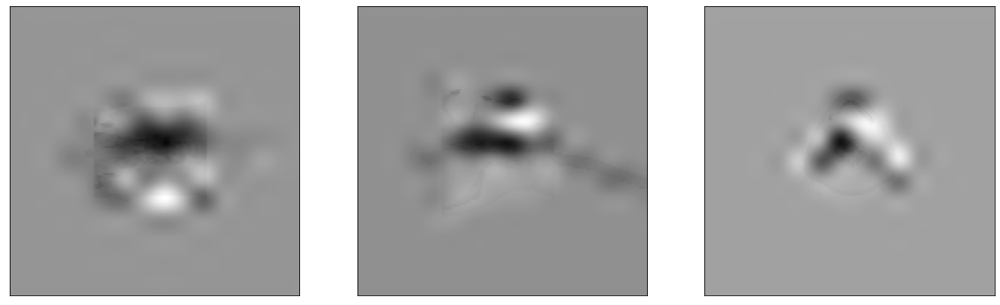

Epoch 15 performed in 175.520s



Epoch number 16 out of 200


EPOCH #16/200 - BATCH #1/150
Loading the data...
Data loaded in 0.350
Generator training...
Mean absolute error : 0.031
Generator trained in 0.808
Attention weight sigma  [[0.00012795617], [0.0]]
Total training time : 1.160s

--------------------------------------------------------------------------------

EPOCH #16/200 - BATCH #2/150
Loading the data...
Data loaded in 0.227
Generator training...
Mean absolute error : 0.033
Generator trained in 0.789
Attention weight sigma  [[0.00012858973], [0.0]]
Total training time : 1.018s

--------------------------------------------------------------------------------

EPOCH #16/200 - BATCH #3/150
Loading the data...
Data loaded in 0.231
Generator training...
Mean absolute error : 0.031
Generator trained in 0.802
Attention weight sigma  [[0.0001294078], [0.0]]
Total training time : 1.035s

--------------------------------------------------------------------------------

EPOCH #16/200 

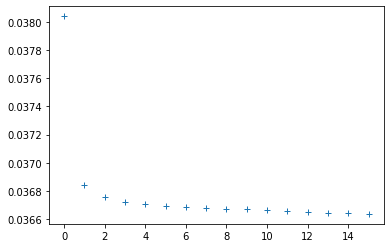

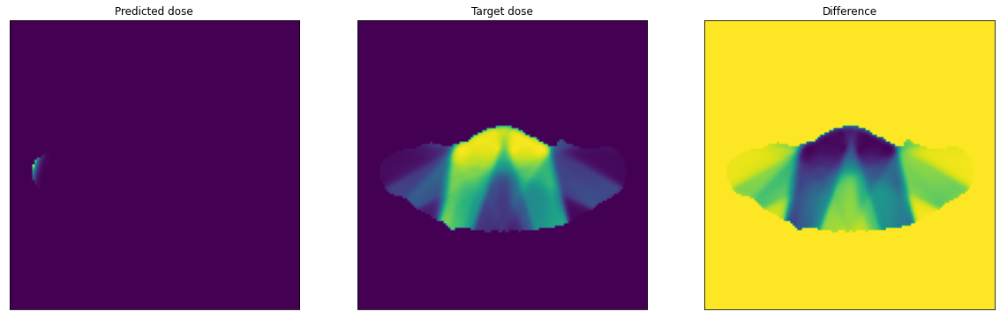

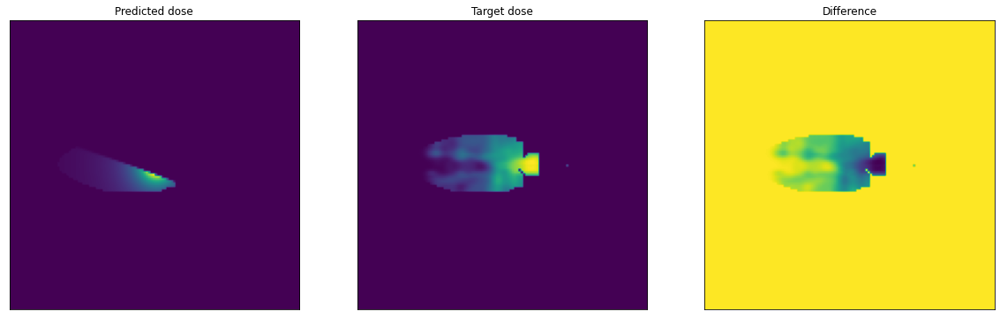

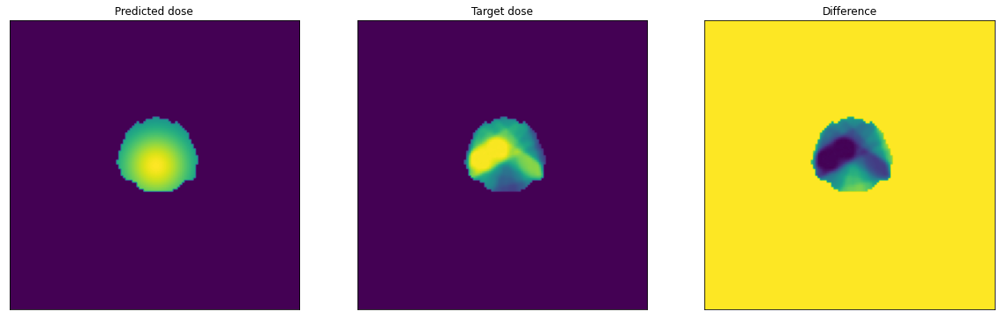

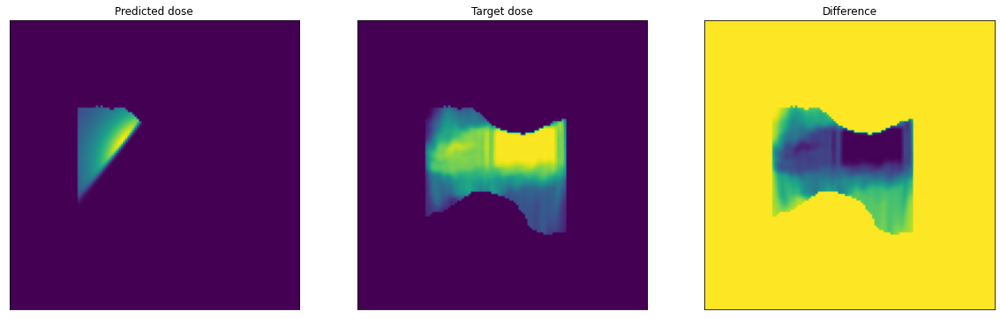

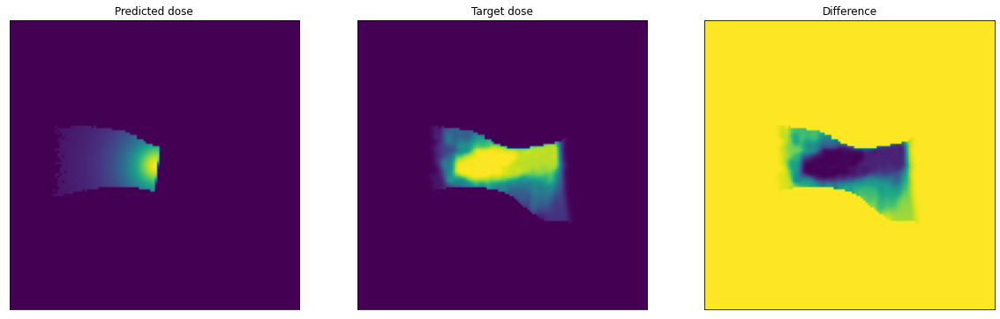

<Figure size 432x288 with 0 Axes>

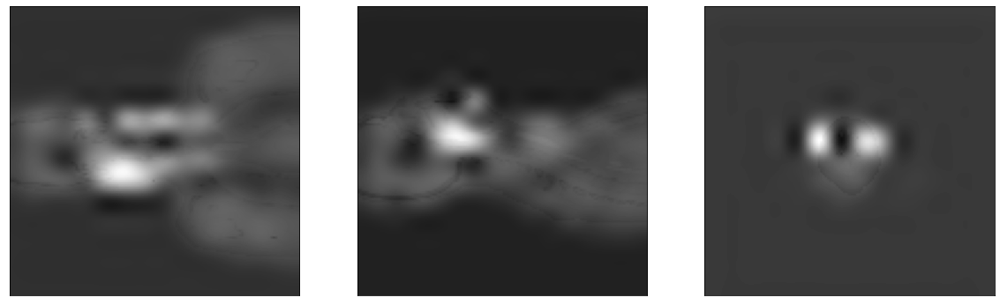

Epoch 16 performed in 171.352s



Epoch number 17 out of 200


EPOCH #17/200 - BATCH #1/150
Loading the data...
Data loaded in 0.375
Generator training...
Mean absolute error : 0.052
Generator trained in 0.780
Attention weight sigma  [[0.00011824543], [0.0]]
Total training time : 1.157s

--------------------------------------------------------------------------------

EPOCH #17/200 - BATCH #2/150
Loading the data...
Data loaded in 0.368
Generator training...
Mean absolute error : 0.048
Generator trained in 0.791
Attention weight sigma  [[0.00011838064], [0.0]]
Total training time : 1.162s

--------------------------------------------------------------------------------

EPOCH #17/200 - BATCH #3/150
Loading the data...
Data loaded in 0.379
Generator training...
Mean absolute error : 0.038
Generator trained in 0.790
Attention weight sigma  [[0.00011862808], [0.0]]
Total training time : 1.171s

--------------------------------------------------------------------------------

EPOCH #17/200

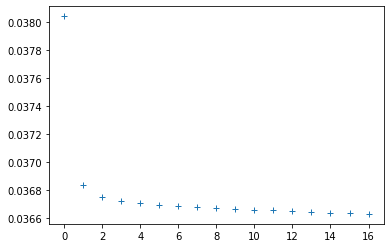

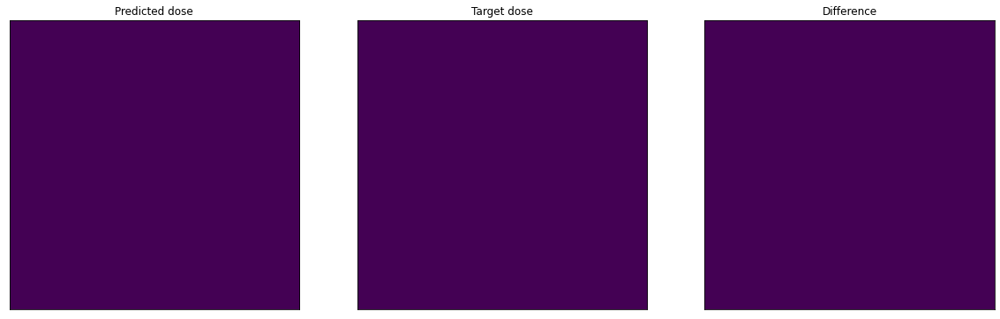

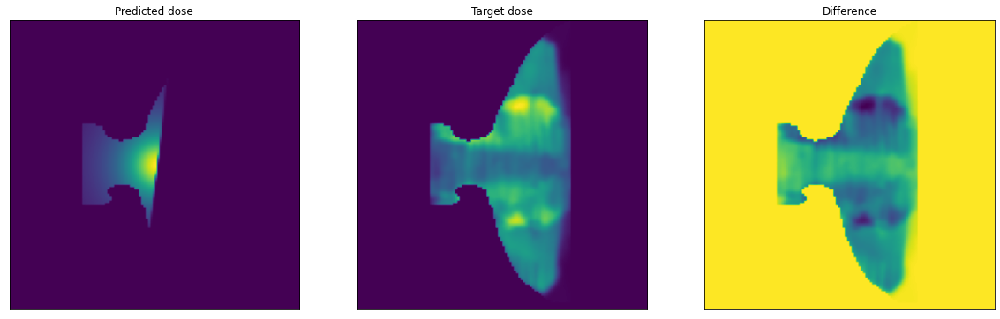

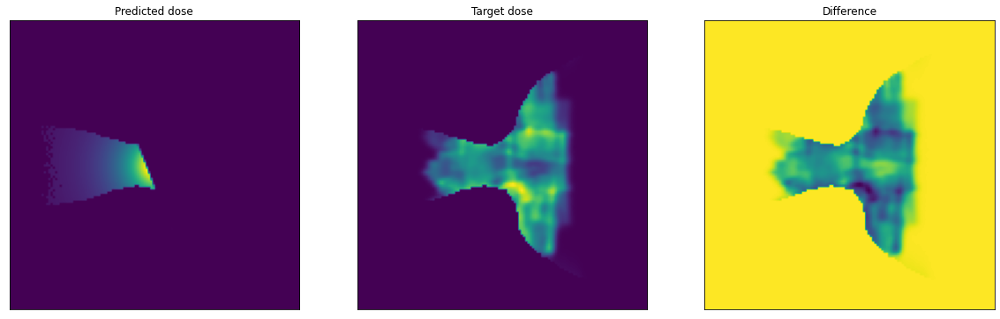

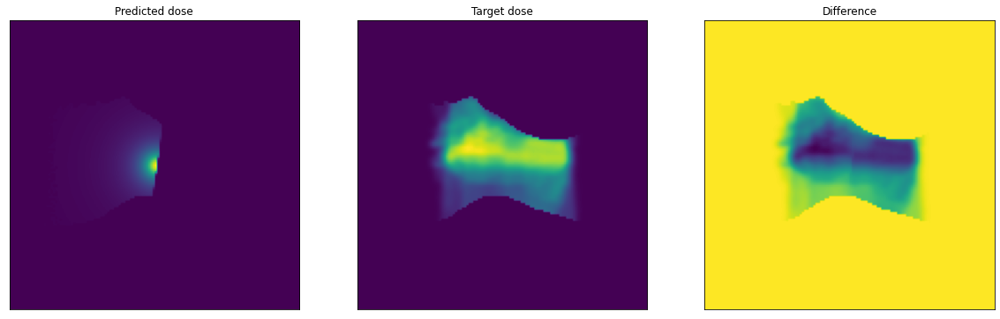

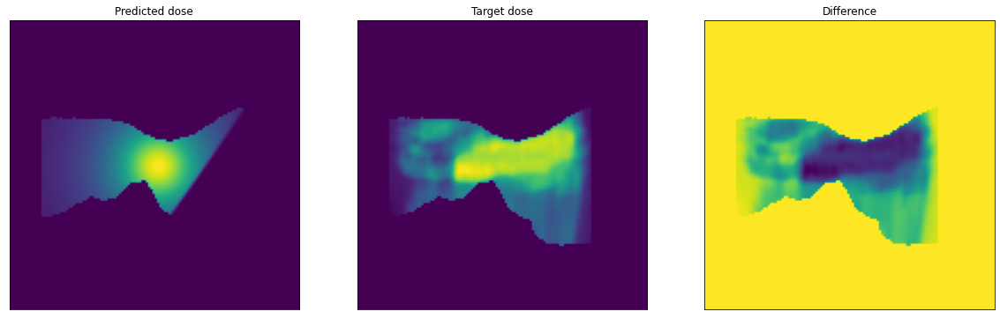

<Figure size 432x288 with 0 Axes>

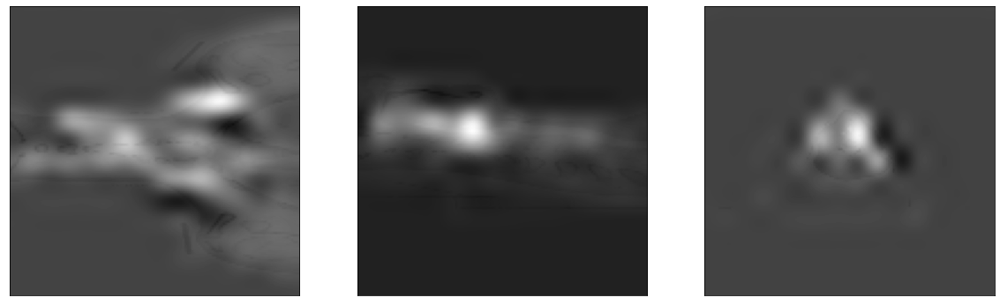

Epoch 17 performed in 172.681s



Epoch number 18 out of 200


EPOCH #18/200 - BATCH #1/150
Loading the data...
Data loaded in 0.266
Generator training...
Mean absolute error : 0.034
Generator trained in 0.797
Attention weight sigma  [[0.00011118717], [0.0]]
Total training time : 1.065s

--------------------------------------------------------------------------------

EPOCH #18/200 - BATCH #2/150
Loading the data...
Data loaded in 0.384
Generator training...
Mean absolute error : 0.048
Generator trained in 0.803
Attention weight sigma  [[0.000112788606], [0.0]]
Total training time : 1.189s

--------------------------------------------------------------------------------

EPOCH #18/200 - BATCH #3/150
Loading the data...
Data loaded in 0.271
Generator training...
Mean absolute error : 0.029
Generator trained in 0.788
Attention weight sigma  [[0.00011359044], [0.0]]
Total training time : 1.062s

--------------------------------------------------------------------------------

EPOCH #18/20

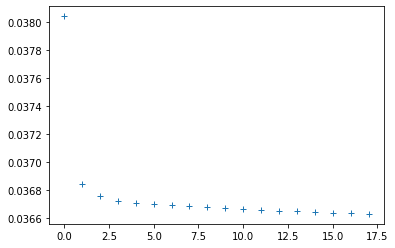

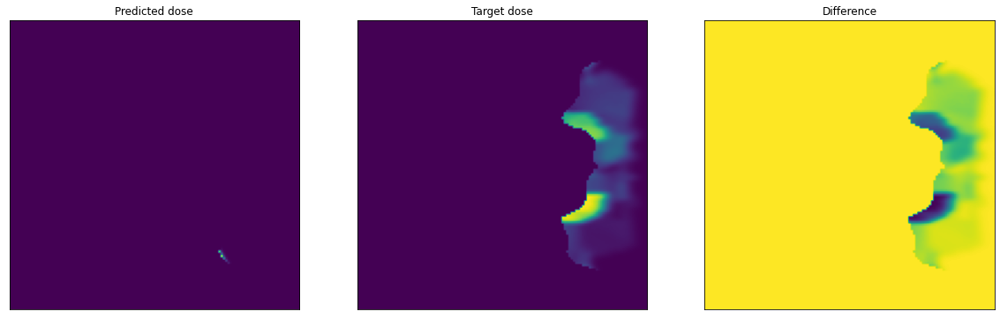

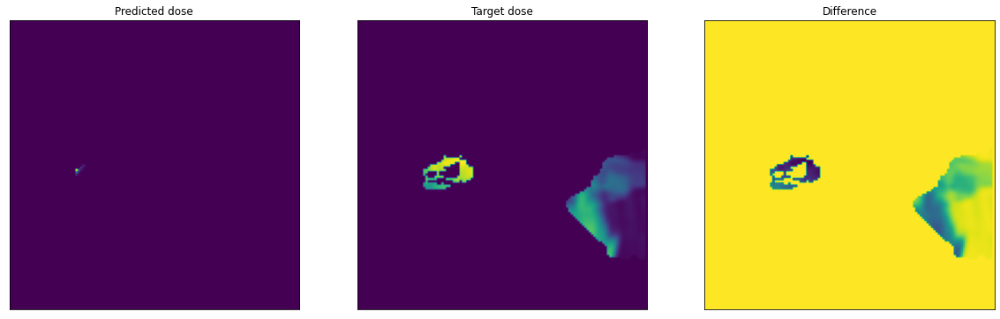

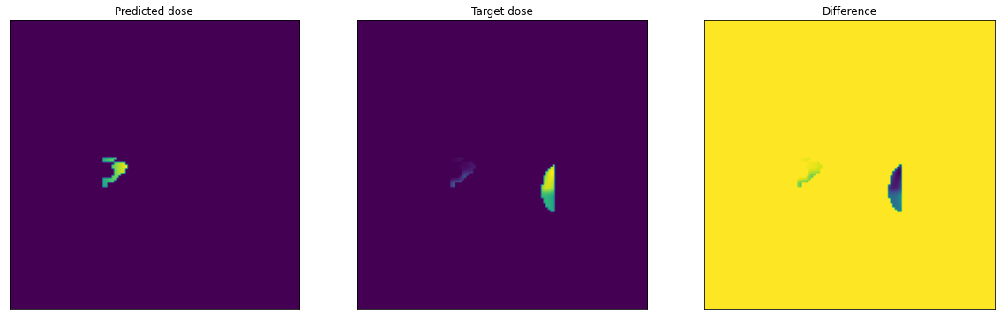

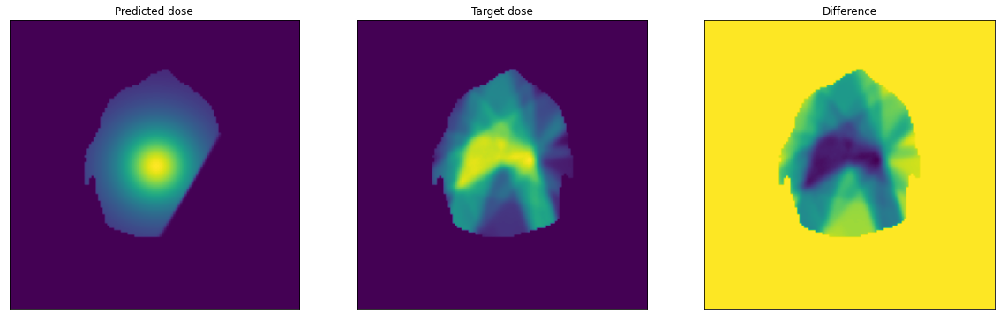

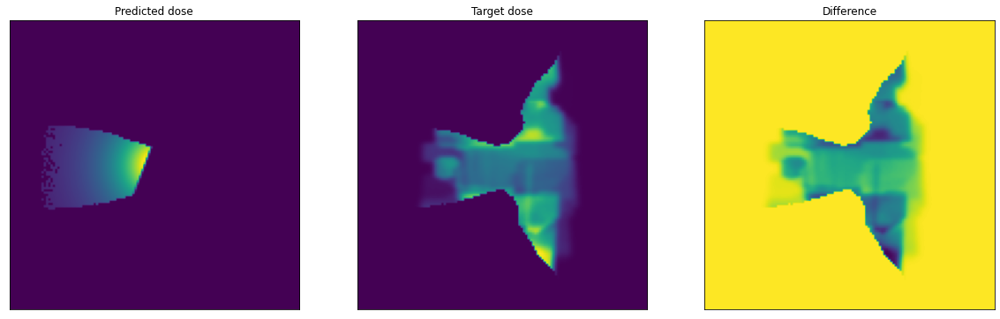

<Figure size 432x288 with 0 Axes>

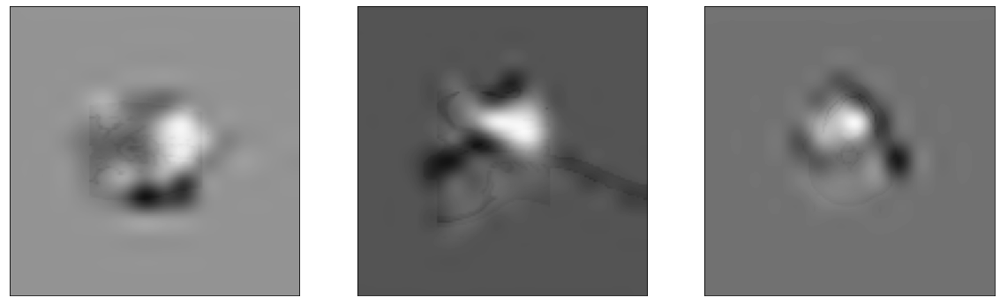

Epoch 18 performed in 172.391s



Epoch number 19 out of 200


EPOCH #19/200 - BATCH #1/150
Loading the data...
Data loaded in 0.418
Generator training...
Mean absolute error : 0.042
Generator trained in 0.794
Attention weight sigma  [[0.00012421024], [0.0]]
Total training time : 1.215s

--------------------------------------------------------------------------------

EPOCH #19/200 - BATCH #2/150
Loading the data...
Data loaded in 0.368
Generator training...
Mean absolute error : 0.040
Generator trained in 0.792
Attention weight sigma  [[0.00012455587], [0.0]]
Total training time : 1.162s

--------------------------------------------------------------------------------

EPOCH #19/200 - BATCH #3/150
Loading the data...
Data loaded in 0.383
Generator training...
Mean absolute error : 0.033
Generator trained in 0.792
Attention weight sigma  [[0.0001241105], [0.0]]
Total training time : 1.179s

--------------------------------------------------------------------------------

EPOCH #19/200 

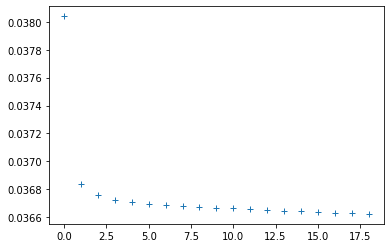

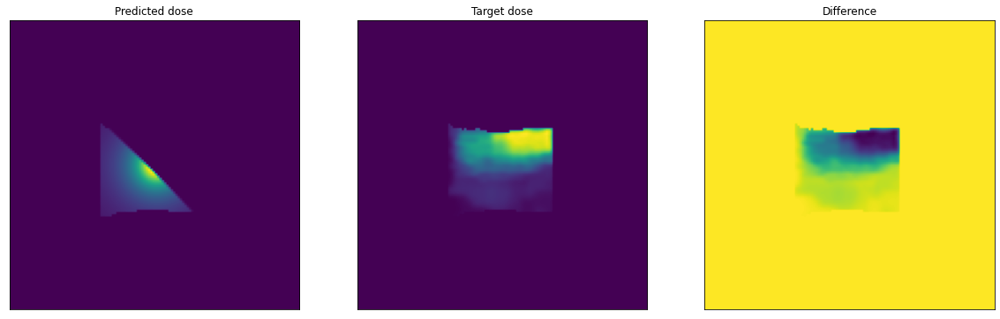

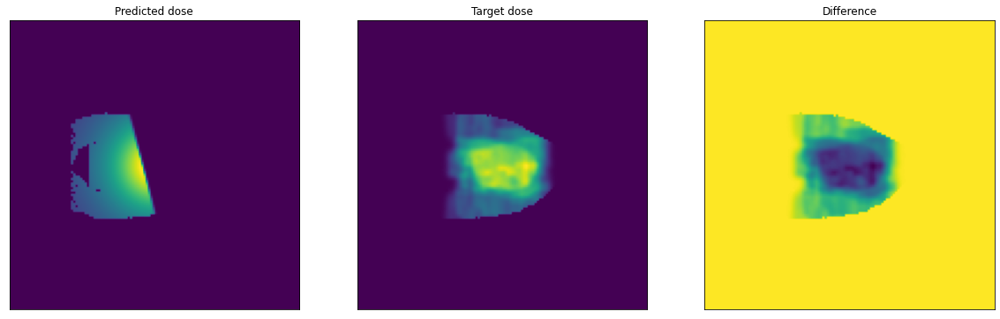

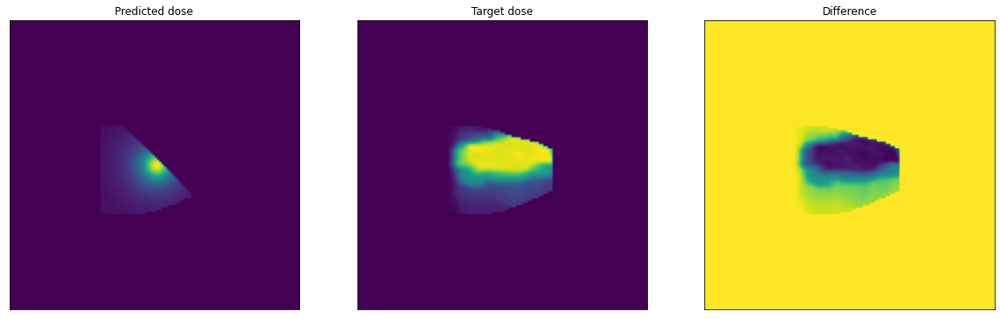

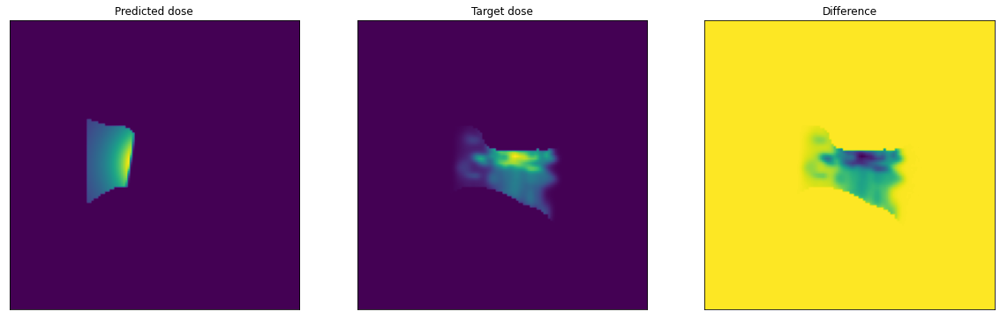

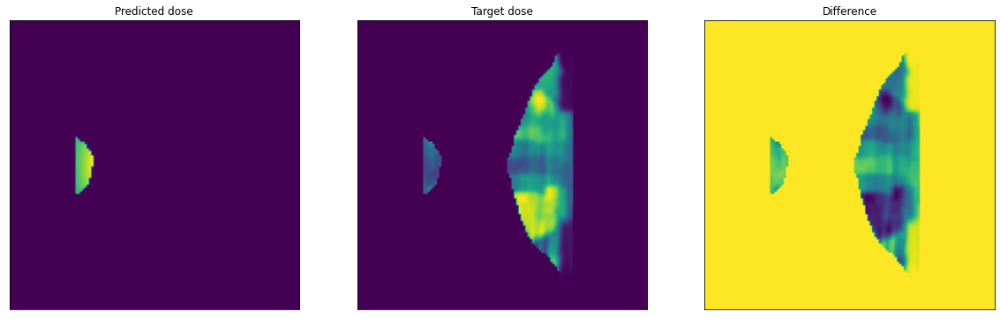

<Figure size 432x288 with 0 Axes>

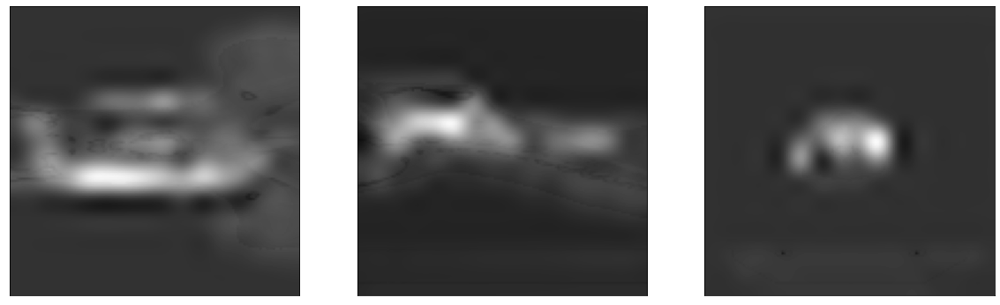

Epoch 19 performed in 172.820s



Epoch number 20 out of 200


EPOCH #20/200 - BATCH #1/150
Loading the data...
Data loaded in 0.241
Generator training...
Mean absolute error : 0.029
Generator trained in 0.792
Attention weight sigma  [[9.908865e-05], [0.0]]
Total training time : 1.035s

--------------------------------------------------------------------------------

EPOCH #20/200 - BATCH #2/150
Loading the data...
Data loaded in 0.323
Generator training...
Mean absolute error : 0.036
Generator trained in 0.794
Attention weight sigma  [[9.924269e-05], [0.0]]
Total training time : 1.119s

--------------------------------------------------------------------------------

EPOCH #20/200 - BATCH #3/150
Loading the data...
Data loaded in 0.221
Generator training...
Mean absolute error : 0.029
Generator trained in 0.789
Attention weight sigma  [[9.8289885e-05], [0.0]]
Total training time : 1.012s

--------------------------------------------------------------------------------

EPOCH #20/200 -

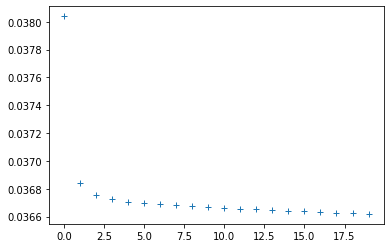

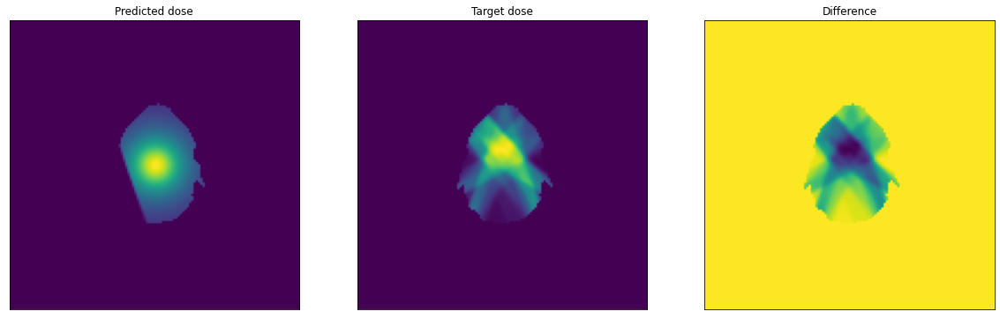

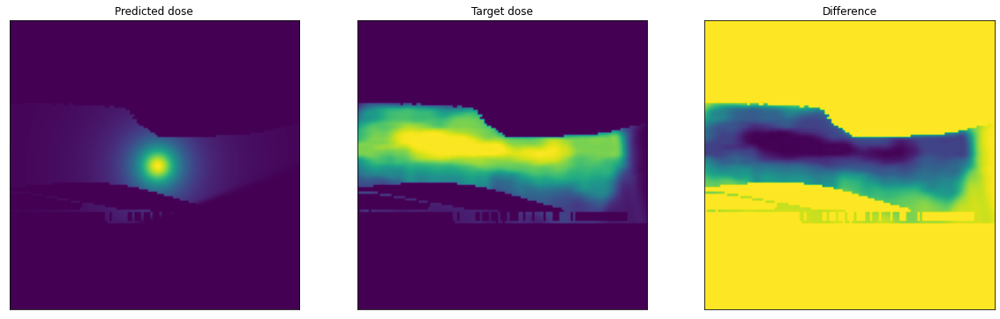

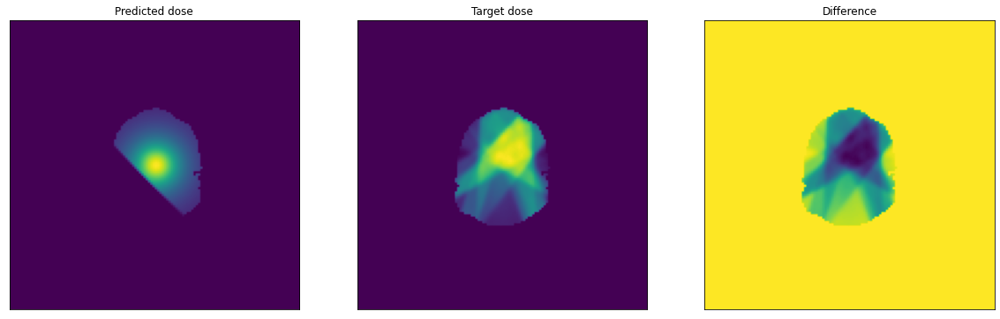

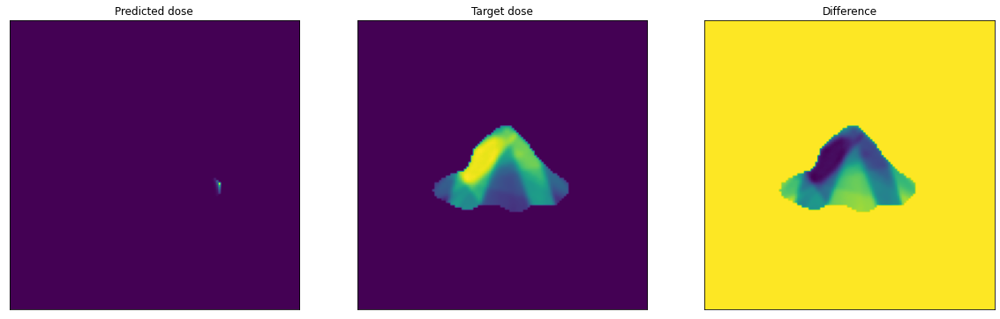

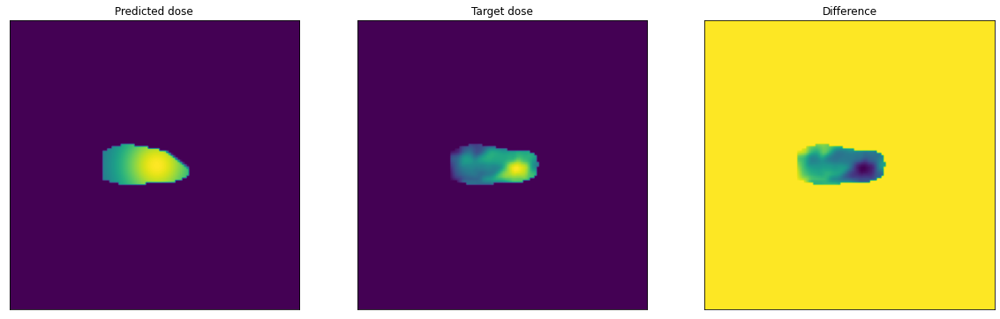

<Figure size 432x288 with 0 Axes>

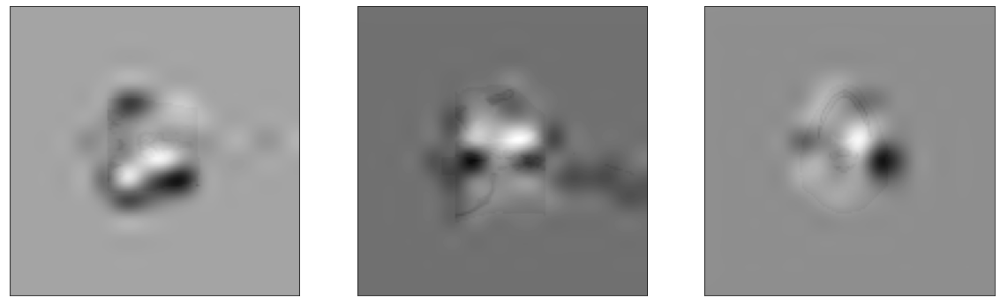

Epoch 20 performed in 171.805s



Epoch number 21 out of 200


EPOCH #21/200 - BATCH #1/150
Loading the data...
Data loaded in 0.302
Generator training...
Mean absolute error : 0.032
Generator trained in 0.793
Attention weight sigma  [[9.3172755e-05], [0.0]]
Total training time : 1.097s

--------------------------------------------------------------------------------

EPOCH #21/200 - BATCH #2/150
Loading the data...
Data loaded in 0.332
Generator training...
Mean absolute error : 0.048
Generator trained in 0.794
Attention weight sigma  [[9.151291e-05], [0.0]]
Total training time : 1.128s

--------------------------------------------------------------------------------

EPOCH #21/200 - BATCH #3/150
Loading the data...
Data loaded in 0.358
Generator training...
Mean absolute error : 0.044
Generator trained in 0.790
Attention weight sigma  [[9.0639325e-05], [0.0]]
Total training time : 1.150s

--------------------------------------------------------------------------------

EPOCH #21/200 

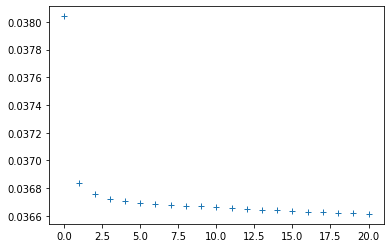

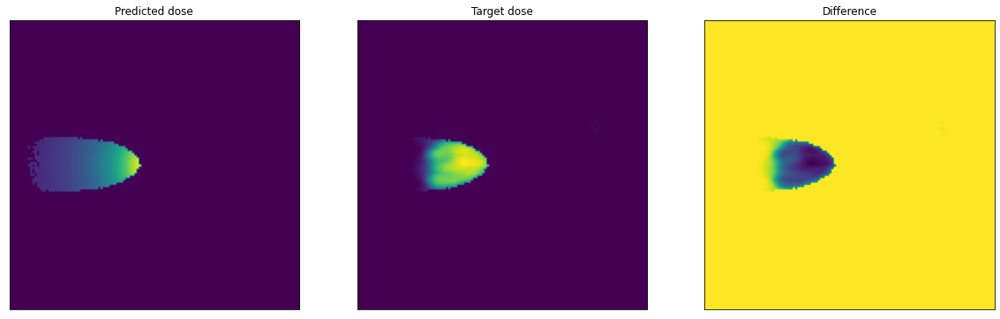

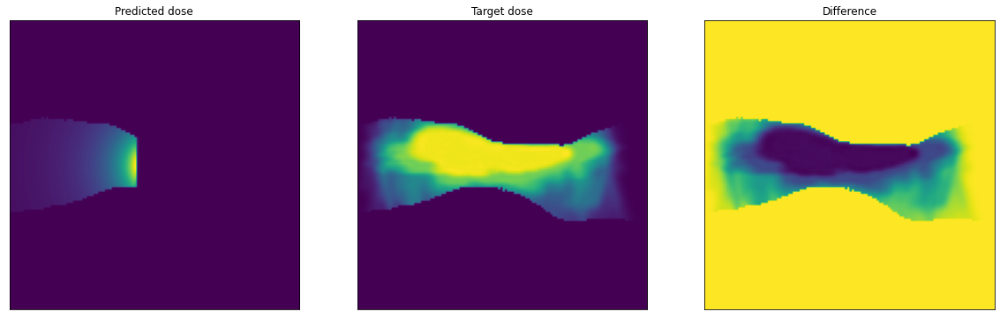

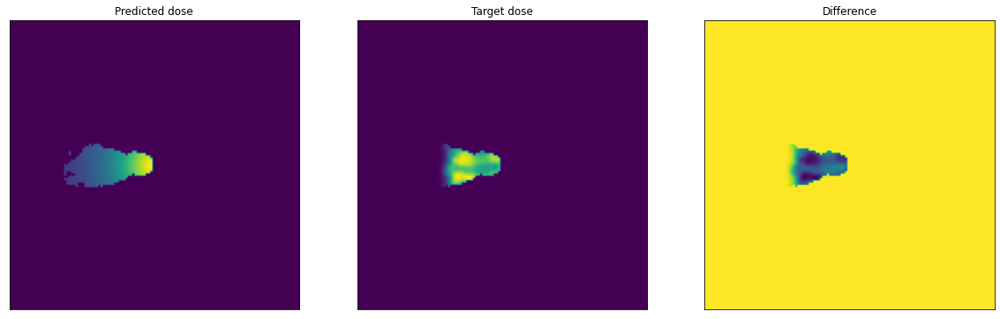

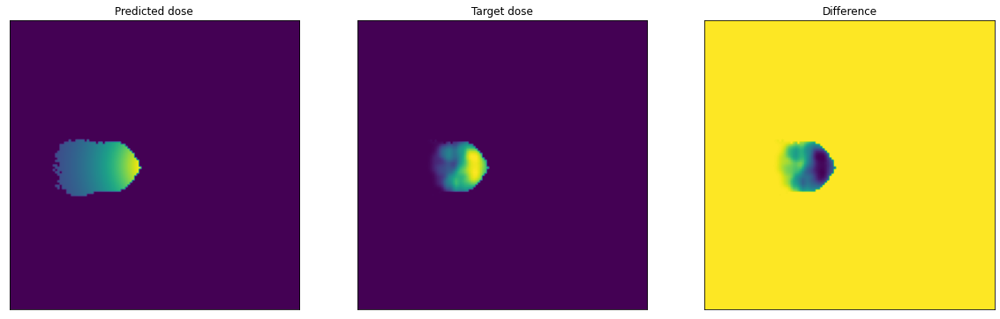

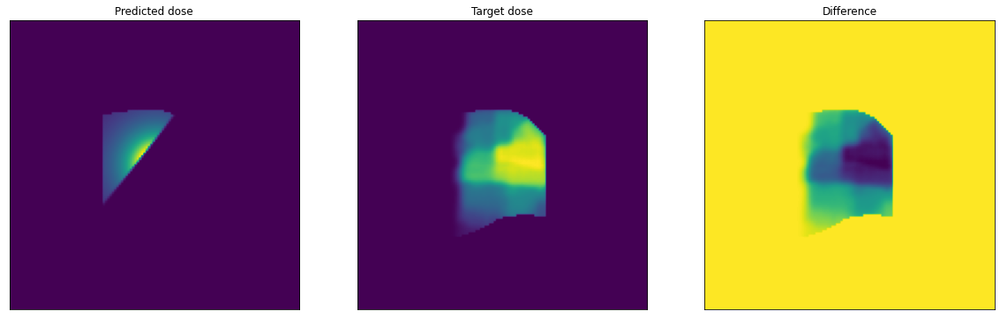

<Figure size 432x288 with 0 Axes>

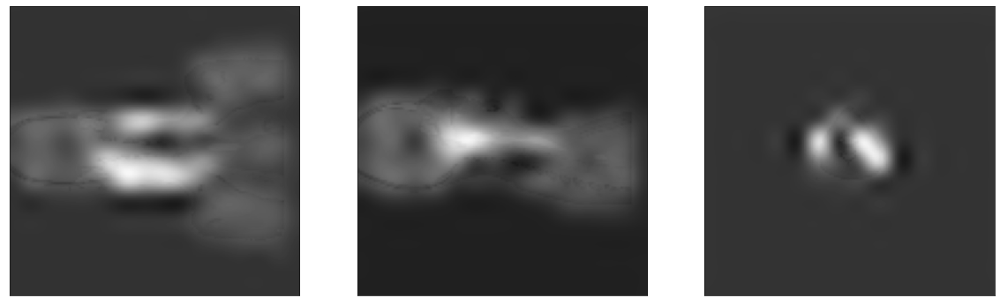

Epoch 21 performed in 171.335s



Epoch number 22 out of 200


EPOCH #22/200 - BATCH #1/150
Loading the data...
Data loaded in 0.388
Generator training...
Mean absolute error : 0.033
Generator trained in 0.800
Attention weight sigma  [[8.299531e-05], [0.0]]
Total training time : 1.190s

--------------------------------------------------------------------------------

EPOCH #22/200 - BATCH #2/150
Loading the data...
Data loaded in 0.342
Generator training...
Mean absolute error : 0.031
Generator trained in 0.792
Attention weight sigma  [[8.282844e-05], [0.0]]
Total training time : 1.136s

--------------------------------------------------------------------------------

EPOCH #22/200 - BATCH #3/150
Loading the data...
Data loaded in 0.354
Generator training...
Mean absolute error : 0.044
Generator trained in 0.788
Attention weight sigma  [[8.2605264e-05], [0.0]]
Total training time : 1.145s

--------------------------------------------------------------------------------

EPOCH #22/200 -

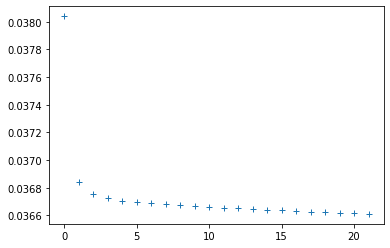

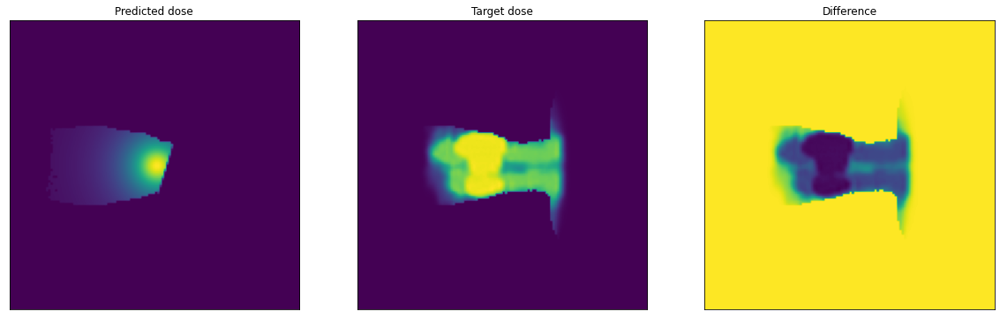

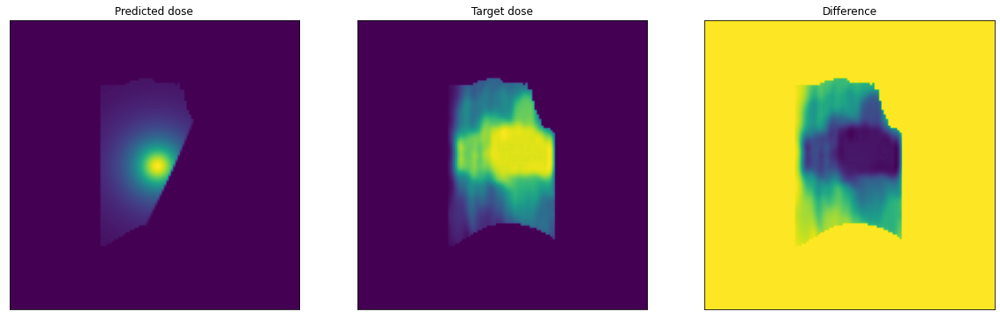

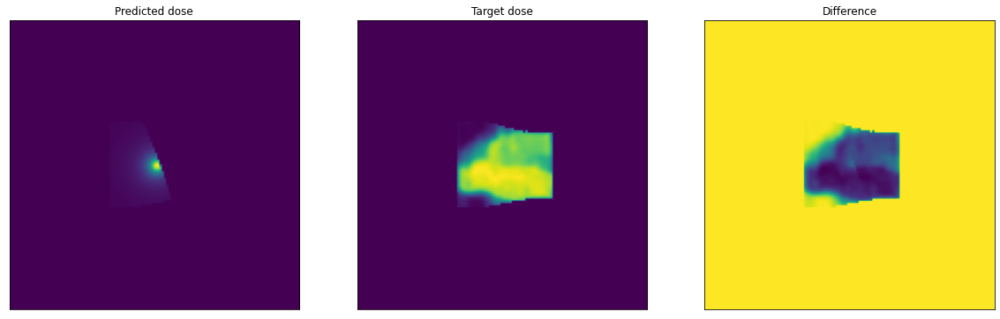

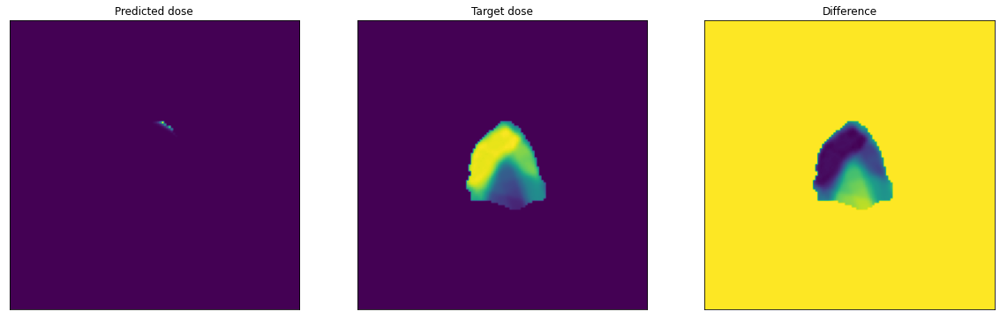

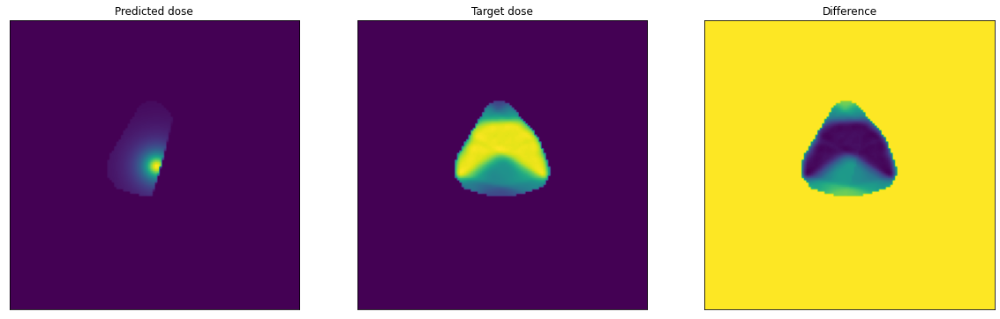

<Figure size 432x288 with 0 Axes>

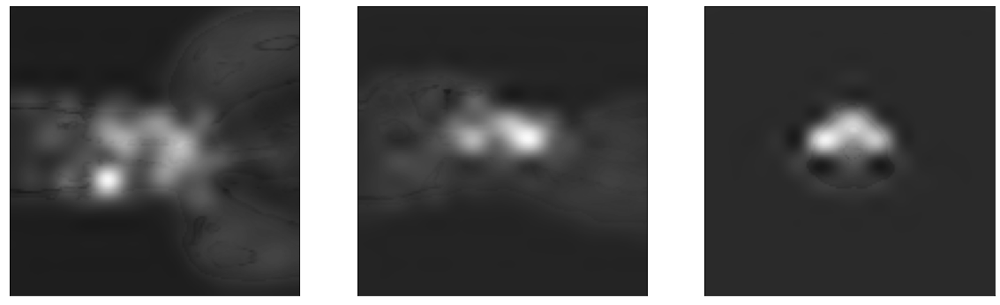

Epoch 22 performed in 171.197s



Epoch number 23 out of 200


EPOCH #23/200 - BATCH #1/150
Loading the data...
Data loaded in 0.234
Generator training...
Mean absolute error : 0.031
Generator trained in 0.789
Attention weight sigma  [[7.574673e-05], [0.0]]
Total training time : 1.026s

--------------------------------------------------------------------------------

EPOCH #23/200 - BATCH #2/150
Loading the data...
Data loaded in 0.299
Generator training...
Mean absolute error : 0.031
Generator trained in 0.790
Attention weight sigma  [[7.609122e-05], [0.0]]
Total training time : 1.091s

--------------------------------------------------------------------------------

EPOCH #23/200 - BATCH #3/150
Loading the data...
Data loaded in 0.314
Generator training...
Mean absolute error : 0.030
Generator trained in 0.794
Attention weight sigma  [[7.614562e-05], [0.0]]
Total training time : 1.110s

--------------------------------------------------------------------------------

EPOCH #23/200 - 

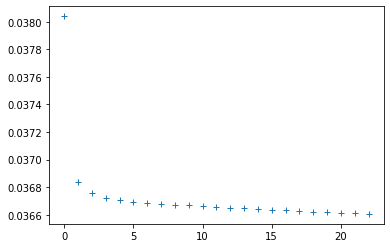

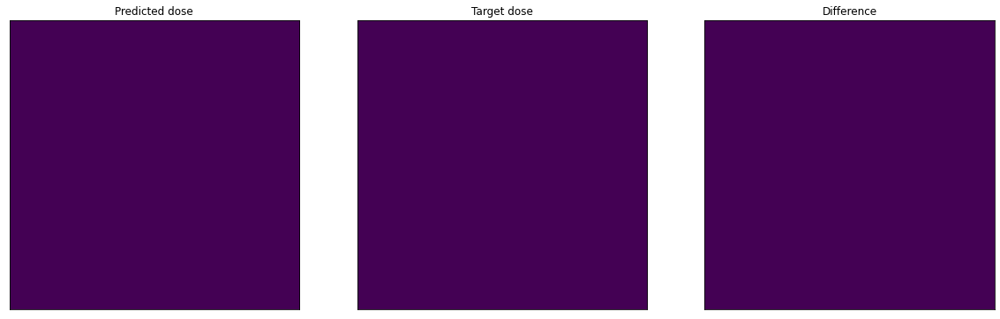

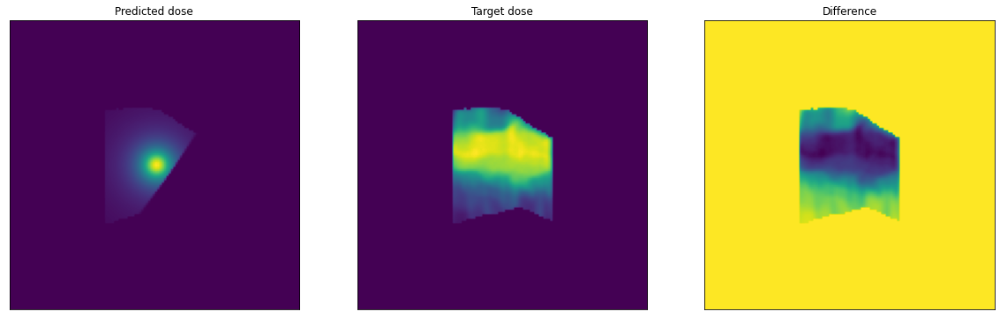

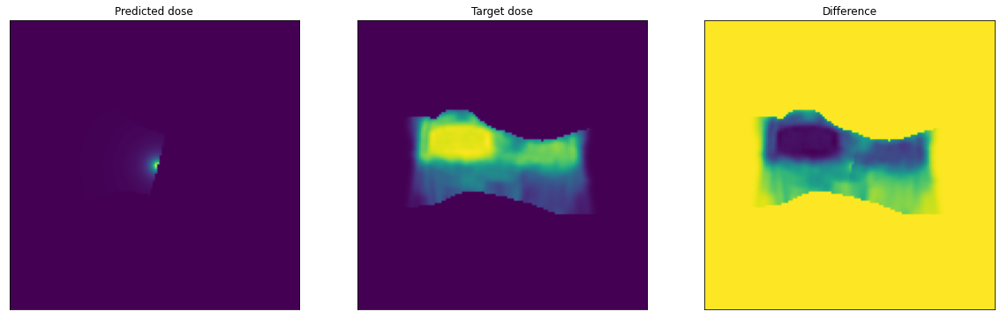

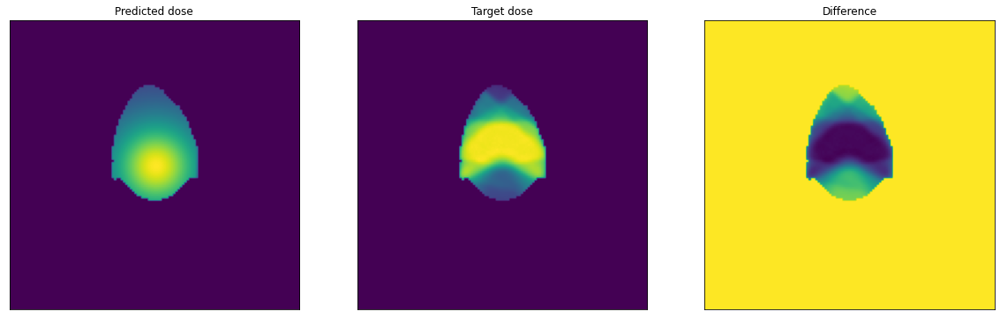

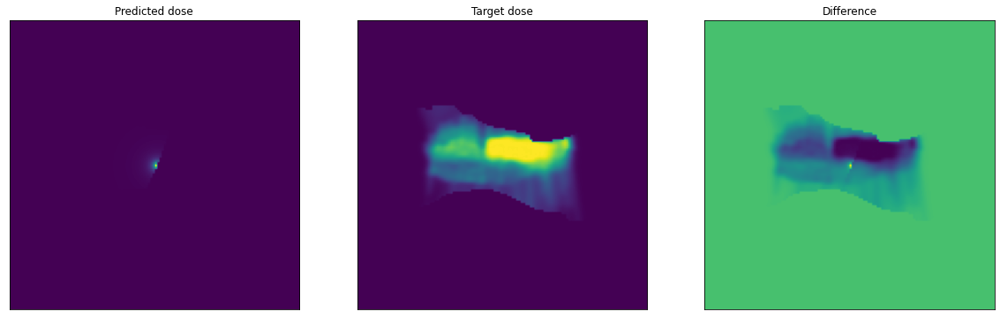

<Figure size 432x288 with 0 Axes>

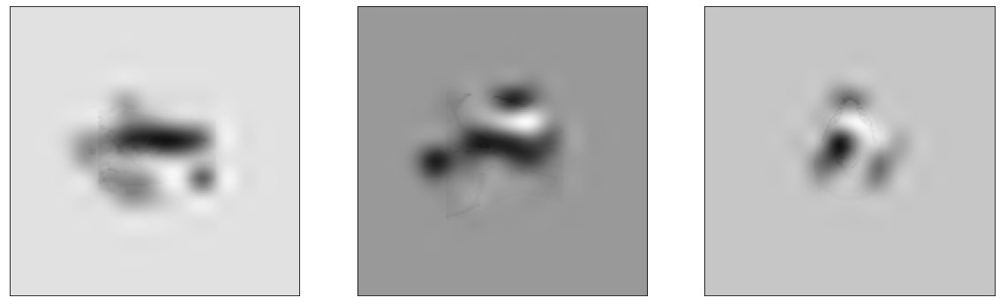

Epoch 23 performed in 171.888s



Epoch number 24 out of 200


EPOCH #24/200 - BATCH #1/150
Loading the data...
Data loaded in 0.410
Generator training...
Mean absolute error : 0.041
Generator trained in 0.796
Attention weight sigma  [[8.3990555e-05], [0.0]]
Total training time : 1.209s

--------------------------------------------------------------------------------

EPOCH #24/200 - BATCH #2/150
Loading the data...
Data loaded in 0.269
Generator training...
Mean absolute error : 0.029
Generator trained in 0.791
Attention weight sigma  [[8.457097e-05], [0.0]]
Total training time : 1.062s

--------------------------------------------------------------------------------

EPOCH #24/200 - BATCH #3/150
Loading the data...
Data loaded in 0.257
Generator training...
Mean absolute error : 0.034
Generator trained in 0.796
Attention weight sigma  [[8.433944e-05], [0.0]]
Total training time : 1.056s

--------------------------------------------------------------------------------

EPOCH #24/200 -

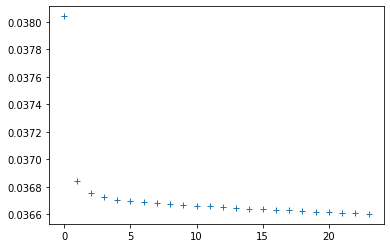

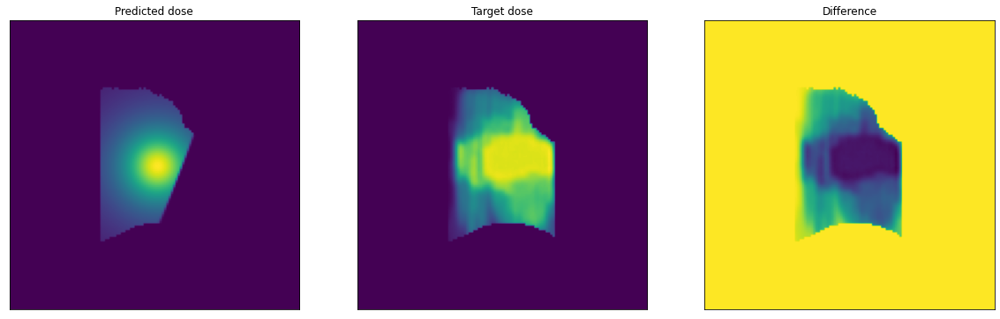

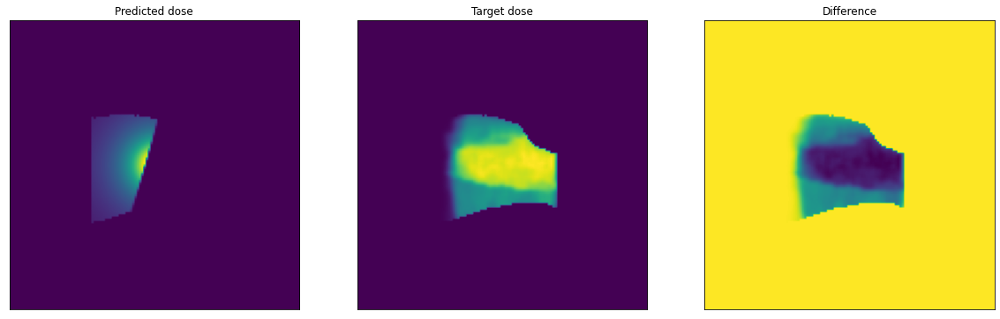

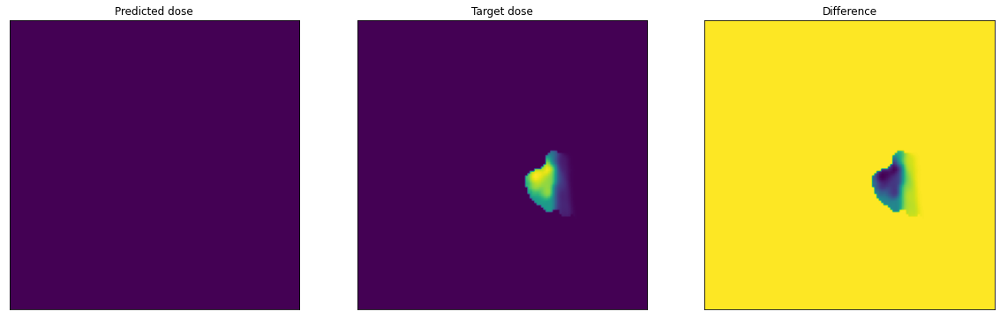

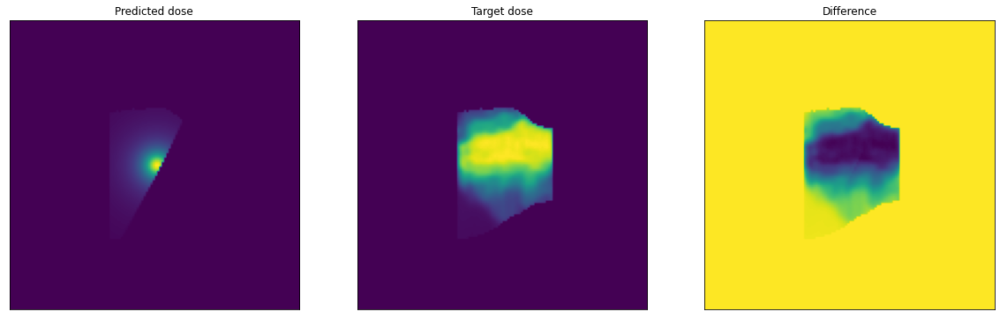

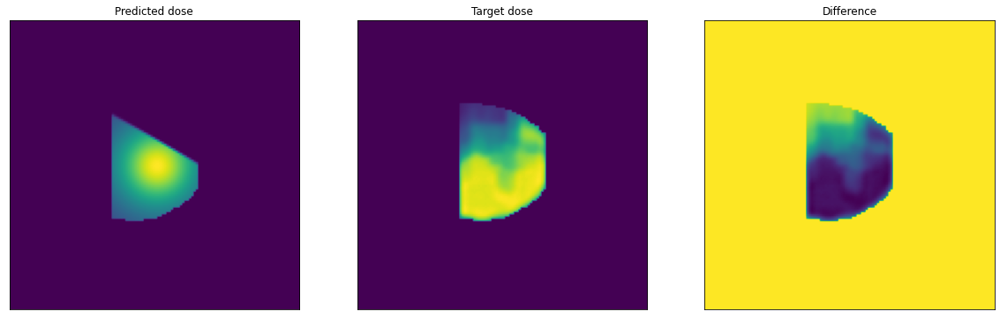

<Figure size 432x288 with 0 Axes>

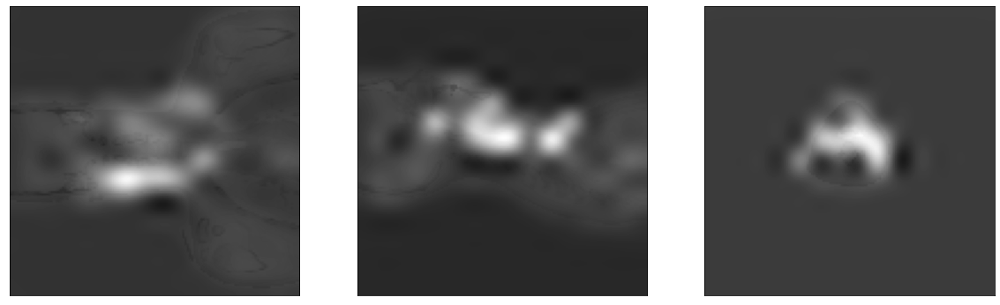

Epoch 24 performed in 172.116s



Epoch number 25 out of 200


EPOCH #25/200 - BATCH #1/150
Loading the data...
Data loaded in 0.375
Generator training...
Mean absolute error : 0.053
Generator trained in 0.799
Attention weight sigma  [[5.3549447e-05], [0.0]]
Total training time : 1.176s

--------------------------------------------------------------------------------

EPOCH #25/200 - BATCH #2/150
Loading the data...
Data loaded in 0.252
Generator training...
Mean absolute error : 0.031
Generator trained in 0.786
Attention weight sigma  [[5.5664896e-05], [0.0]]
Total training time : 1.040s

--------------------------------------------------------------------------------

EPOCH #25/200 - BATCH #3/150
Loading the data...
Data loaded in 0.291
Generator training...
Mean absolute error : 0.040
Generator trained in 0.794
Attention weight sigma  [[5.694885e-05], [0.0]]
Total training time : 1.086s

--------------------------------------------------------------------------------

EPOCH #25/200 

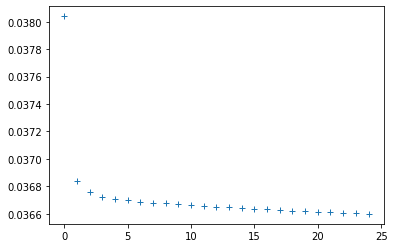

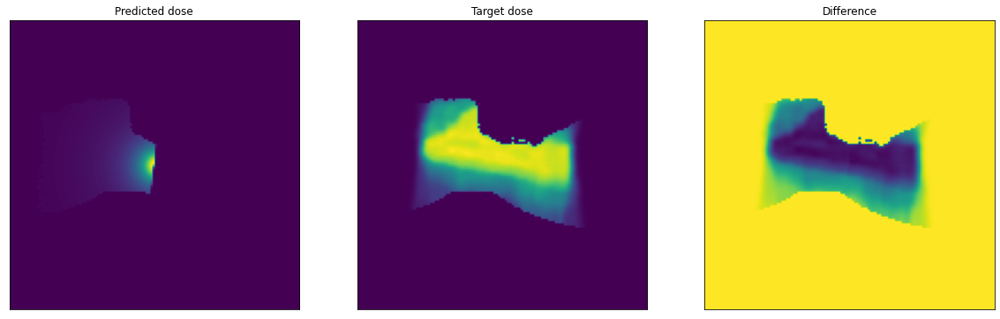

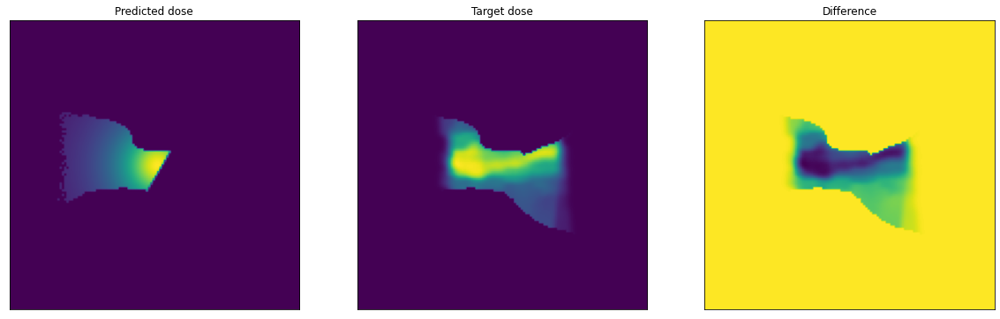

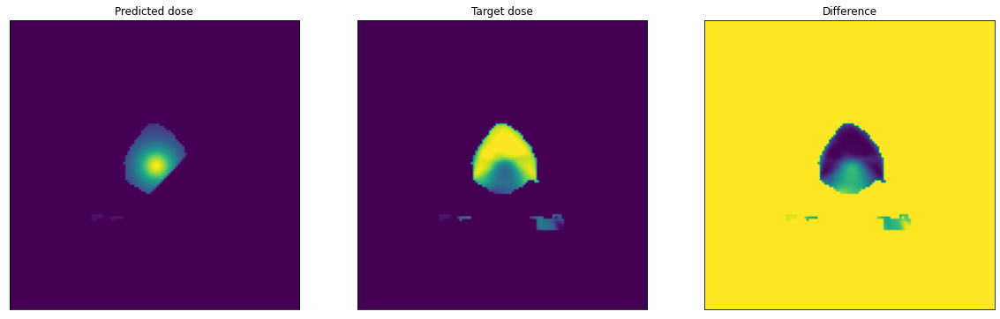

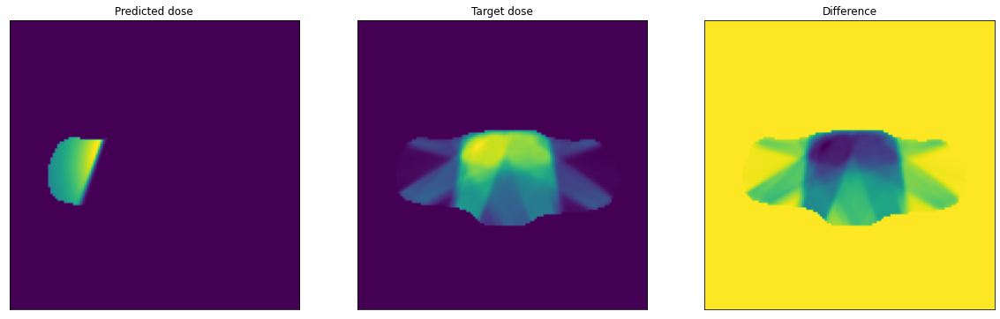

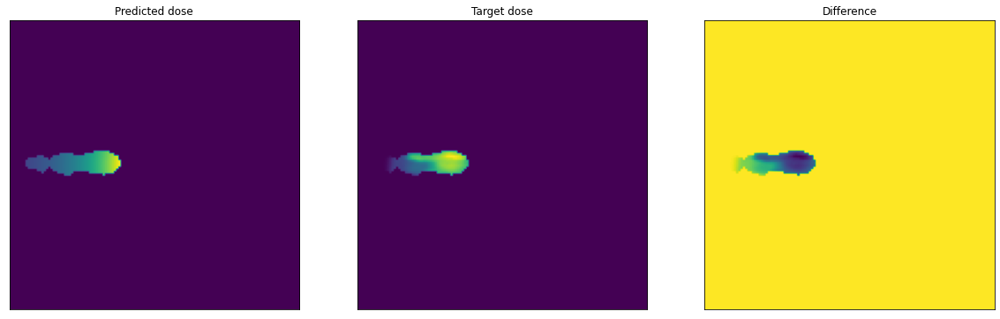

<Figure size 432x288 with 0 Axes>

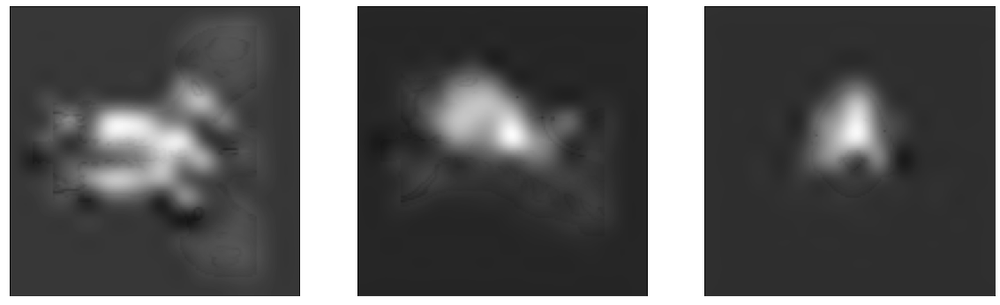

Epoch 25 performed in 171.938s



Epoch number 26 out of 200


EPOCH #26/200 - BATCH #1/150
Loading the data...
Data loaded in 0.355
Generator training...
Mean absolute error : 0.033
Generator trained in 0.796
Attention weight sigma  [[6.316269e-05], [0.0]]
Total training time : 1.153s

--------------------------------------------------------------------------------

EPOCH #26/200 - BATCH #2/150
Loading the data...
Data loaded in 0.287
Generator training...
Mean absolute error : 0.030
Generator trained in 0.806
Attention weight sigma  [[6.356586e-05], [0.0]]
Total training time : 1.095s

--------------------------------------------------------------------------------

EPOCH #26/200 - BATCH #3/150
Loading the data...
Data loaded in 0.269
Generator training...
Mean absolute error : 0.037
Generator trained in 0.791
Attention weight sigma  [[6.5114145e-05], [0.0]]
Total training time : 1.063s

--------------------------------------------------------------------------------

EPOCH #26/200 -

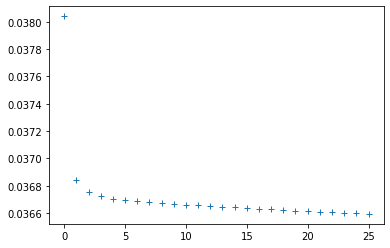

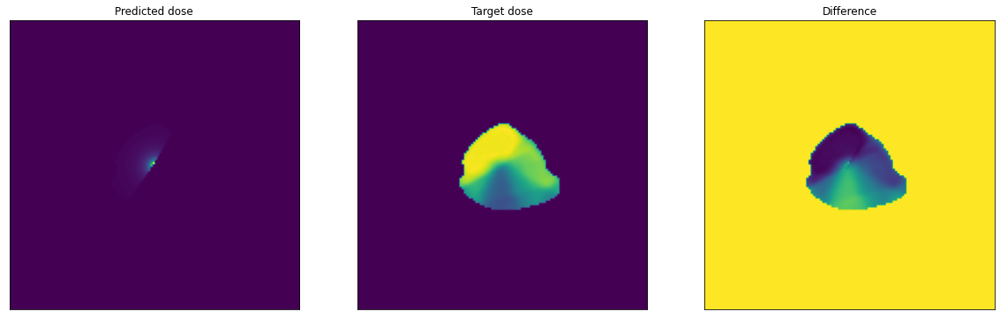

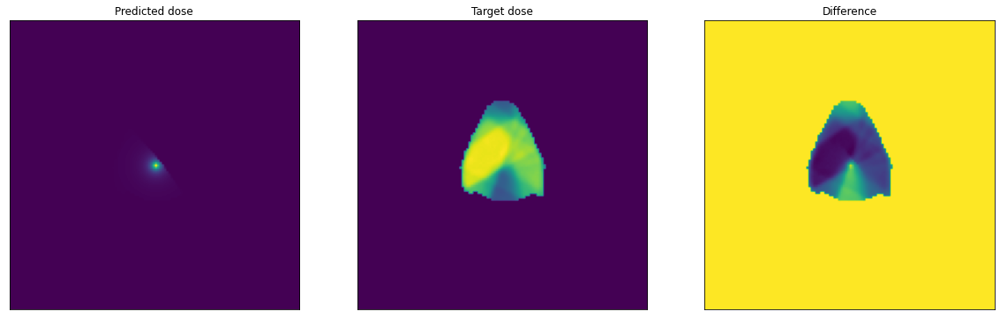

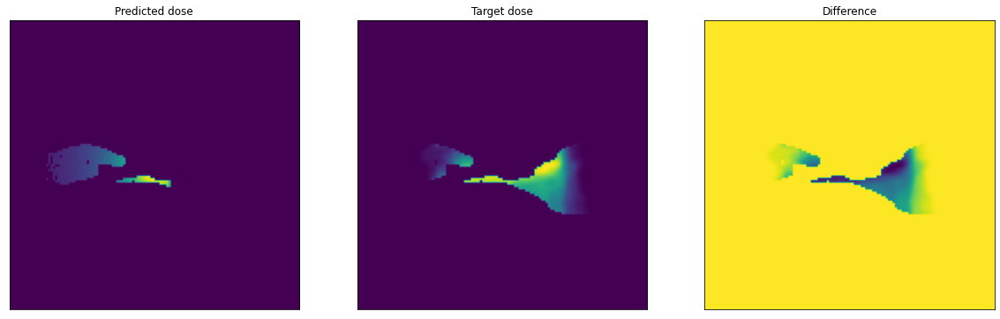

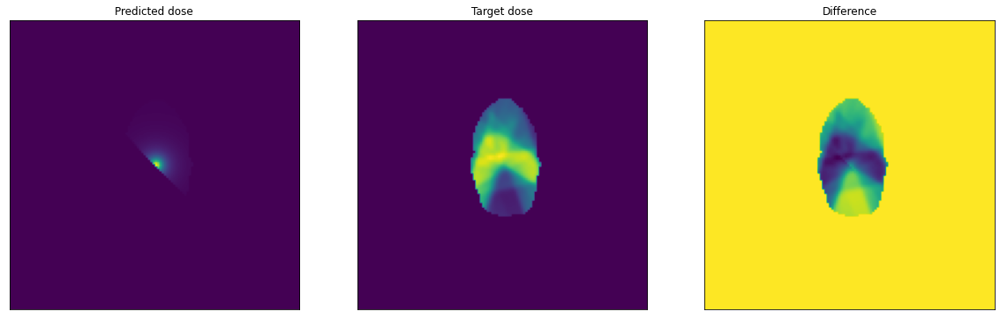

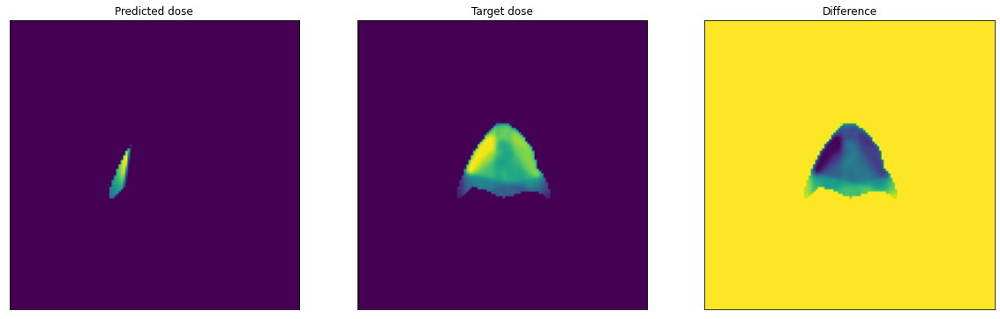

<Figure size 432x288 with 0 Axes>

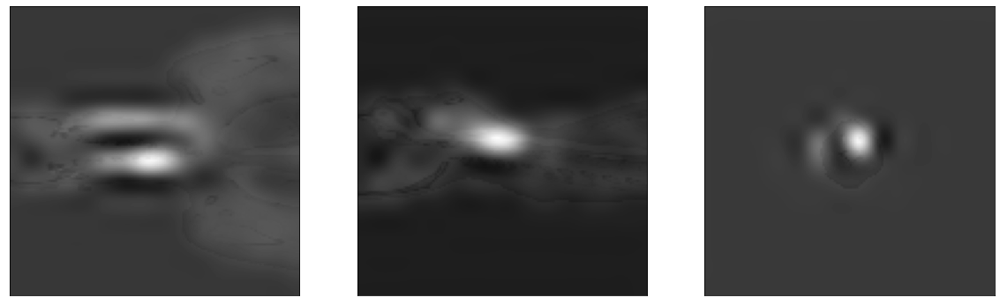

Epoch 26 performed in 172.522s



Epoch number 27 out of 200


EPOCH #27/200 - BATCH #1/150
Loading the data...
Data loaded in 0.341
Generator training...
Mean absolute error : 0.036
Generator trained in 0.808
Attention weight sigma  [[6.724693e-05], [0.0]]
Total training time : 1.151s

--------------------------------------------------------------------------------

EPOCH #27/200 - BATCH #2/150
Loading the data...
Data loaded in 0.341
Generator training...
Mean absolute error : 0.032
Generator trained in 0.784
Attention weight sigma  [[6.7380635e-05], [0.0]]
Total training time : 1.128s

--------------------------------------------------------------------------------

EPOCH #27/200 - BATCH #3/150
Loading the data...
Data loaded in 0.377
Generator training...
Mean absolute error : 0.036
Generator trained in 0.788
Attention weight sigma  [[6.724698e-05], [0.0]]
Total training time : 1.167s

--------------------------------------------------------------------------------

EPOCH #27/200 -

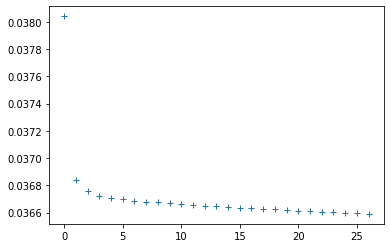

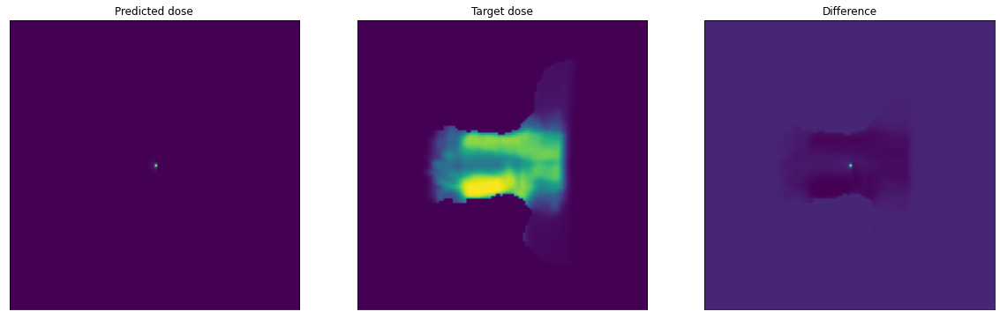

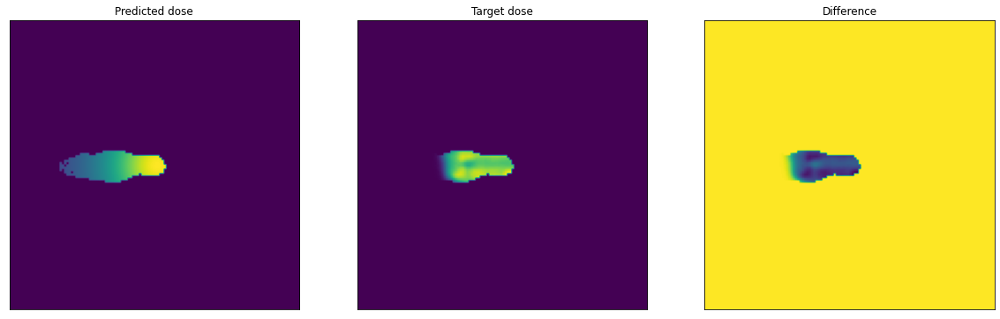

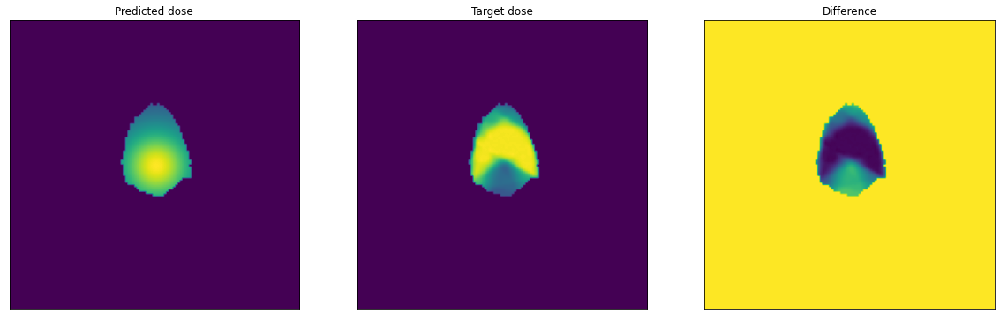

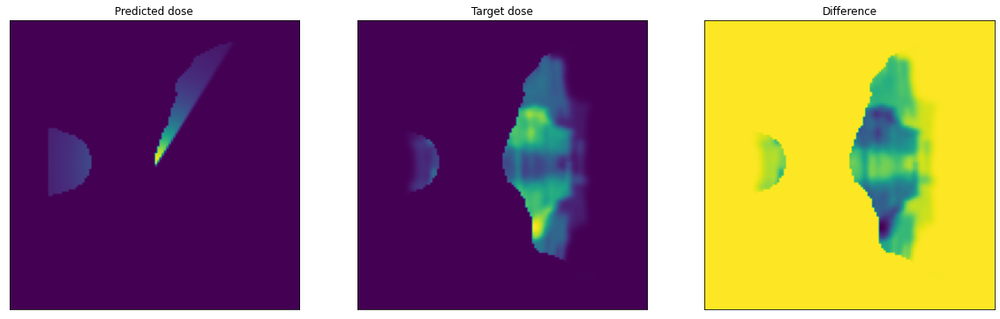

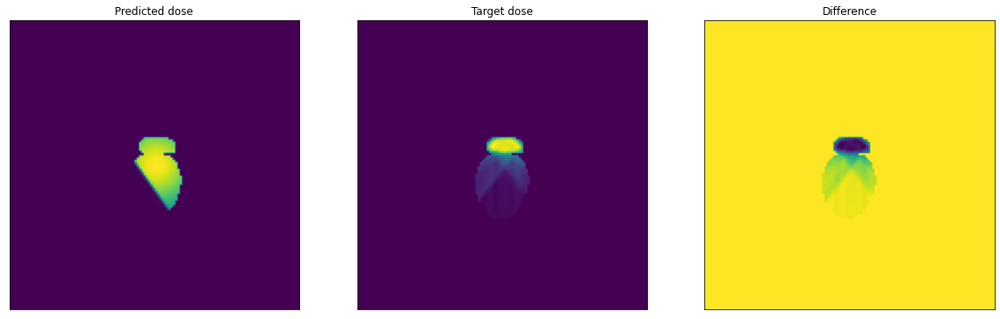

<Figure size 432x288 with 0 Axes>

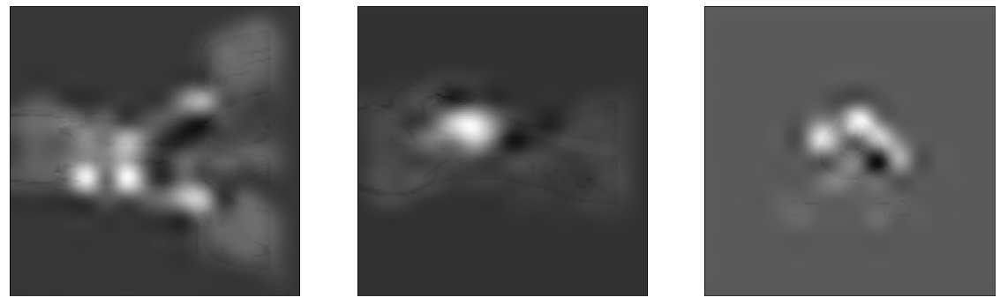

Epoch 27 performed in 172.297s



Epoch number 28 out of 200


EPOCH #28/200 - BATCH #1/150
Loading the data...
Data loaded in 0.281
Generator training...
Mean absolute error : 0.029
Generator trained in 0.776
Attention weight sigma  [[5.38946e-05], [0.0]]
Total training time : 1.059s

--------------------------------------------------------------------------------

EPOCH #28/200 - BATCH #2/150
Loading the data...
Data loaded in 0.251
Generator training...
Mean absolute error : 0.034
Generator trained in 0.790
Attention weight sigma  [[5.3612617e-05], [0.0]]
Total training time : 1.043s

--------------------------------------------------------------------------------

EPOCH #28/200 - BATCH #3/150
Loading the data...
Data loaded in 0.274
Generator training...
Mean absolute error : 0.037
Generator trained in 0.783
Attention weight sigma  [[5.4424872e-05], [0.0]]
Total training time : 1.059s

--------------------------------------------------------------------------------

EPOCH #28/200 -

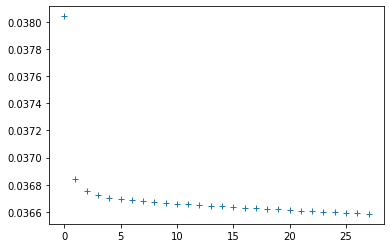

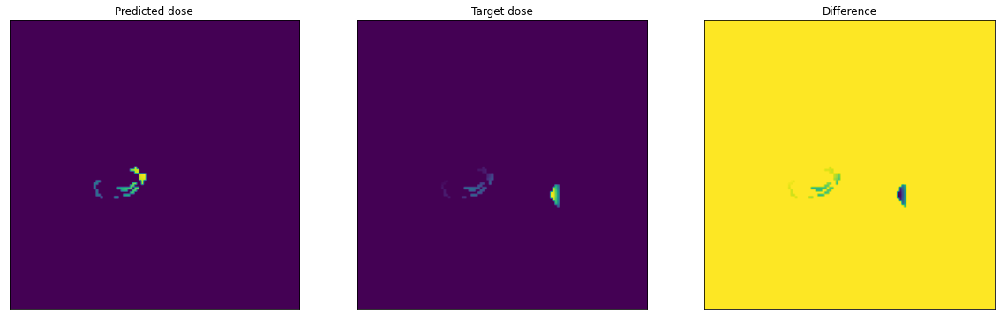

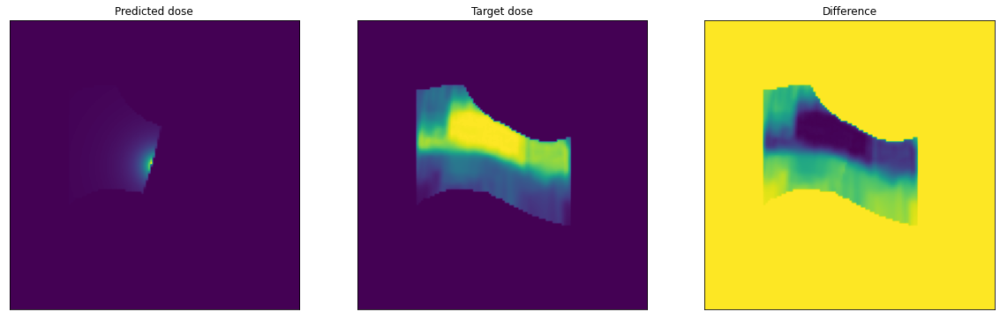

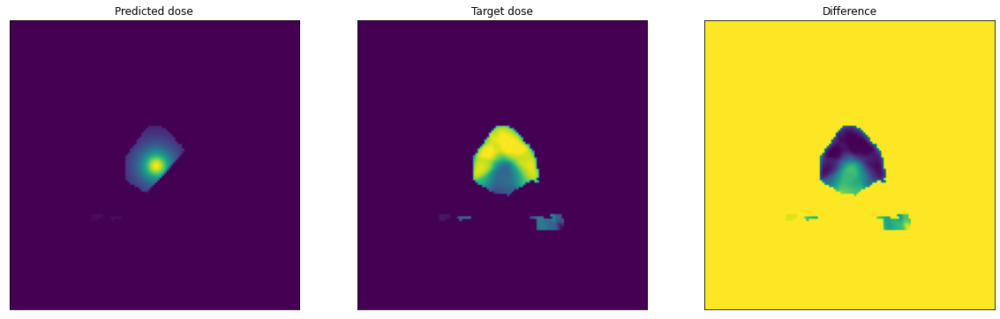

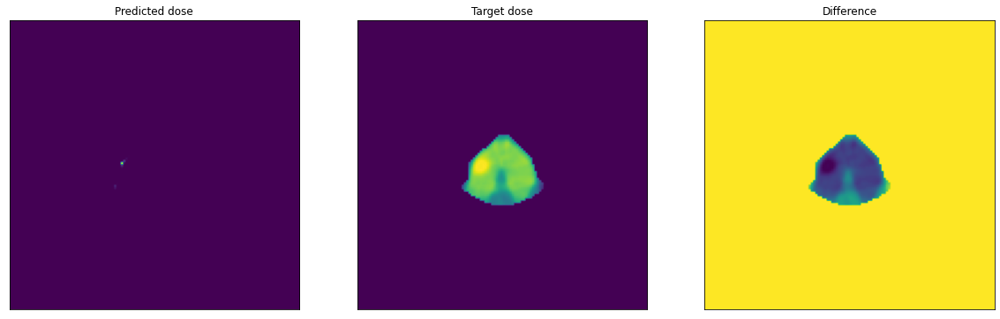

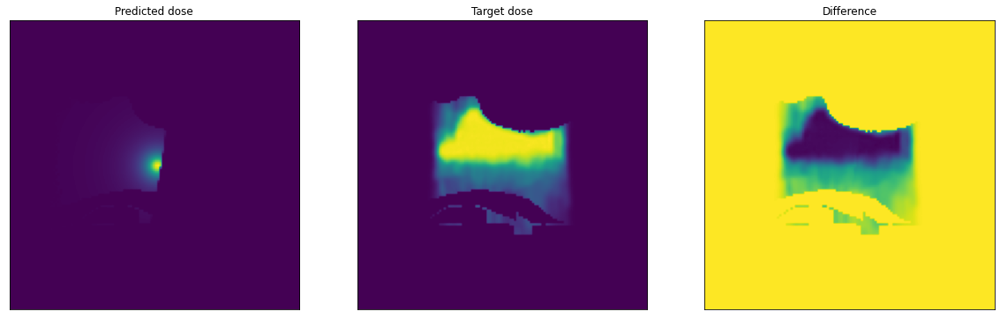

<Figure size 432x288 with 0 Axes>

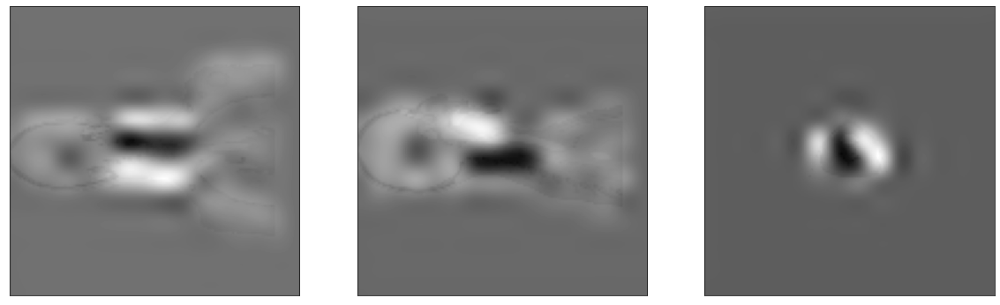

Epoch 28 performed in 173.227s



Epoch number 29 out of 200


EPOCH #29/200 - BATCH #1/150
Loading the data...
Data loaded in 0.386
Generator training...
Mean absolute error : 0.074
Generator trained in 0.777
Attention weight sigma  [[6.0346905e-05], [0.0]]
Total training time : 1.166s

--------------------------------------------------------------------------------

EPOCH #29/200 - BATCH #2/150
Loading the data...
Data loaded in 0.335
Generator training...
Mean absolute error : 0.034
Generator trained in 0.781
Attention weight sigma  [[6.0738737e-05], [0.0]]
Total training time : 1.119s

--------------------------------------------------------------------------------

EPOCH #29/200 - BATCH #3/150
Loading the data...
Data loaded in 0.255
Generator training...
Mean absolute error : 0.037
Generator trained in 0.783
Attention weight sigma  [[6.2194165e-05], [0.0]]
Total training time : 1.041s

--------------------------------------------------------------------------------

EPOCH #29/200

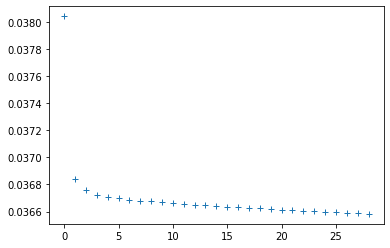

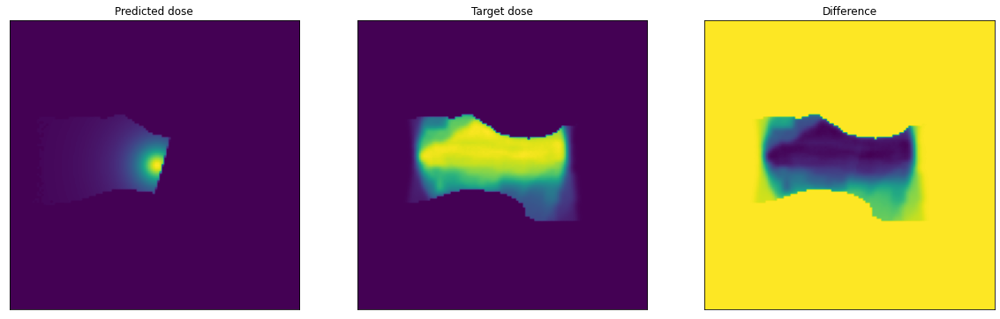

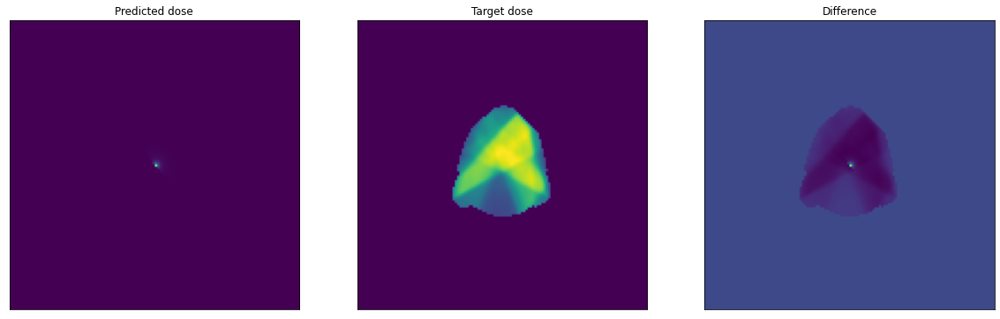

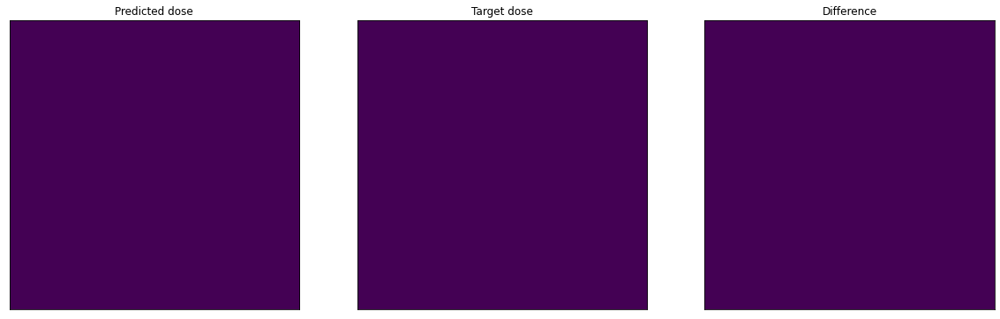

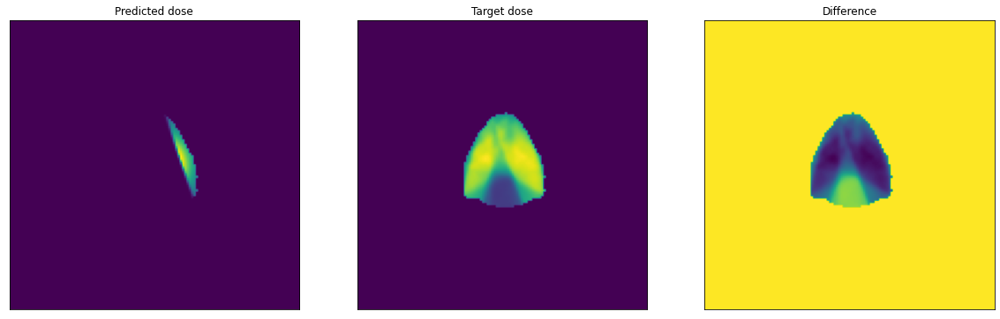

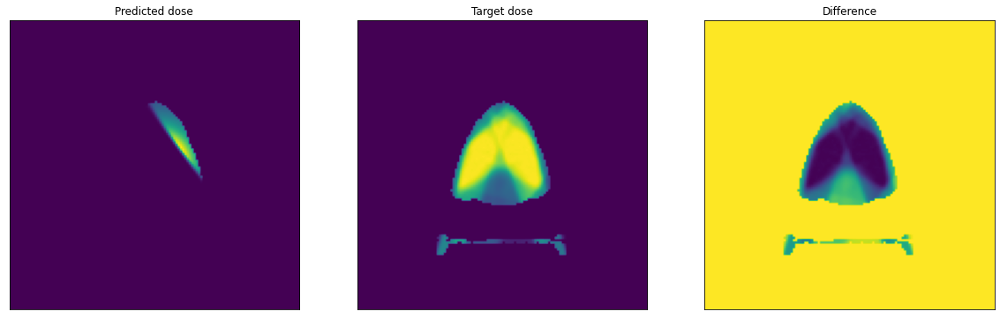

<Figure size 432x288 with 0 Axes>

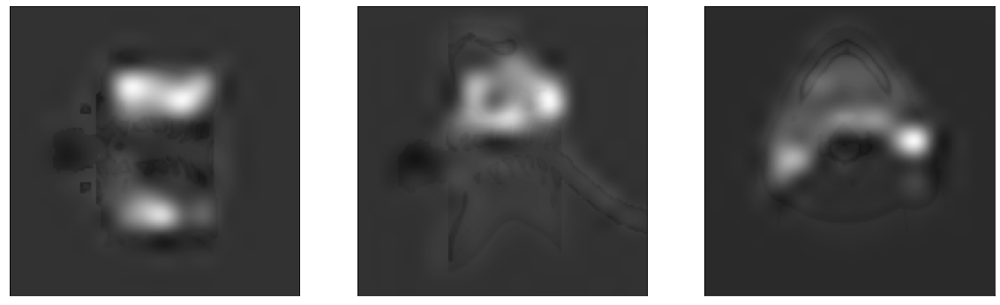

Epoch 29 performed in 166.006s



Epoch number 30 out of 200


EPOCH #30/200 - BATCH #1/150
Loading the data...
Data loaded in 0.296
Generator training...
Mean absolute error : 0.032
Generator trained in 0.781
Attention weight sigma  [[5.5825574e-05], [0.0]]
Total training time : 1.078s

--------------------------------------------------------------------------------

EPOCH #30/200 - BATCH #2/150
Loading the data...
Data loaded in 0.238
Generator training...
Mean absolute error : 0.033
Generator trained in 0.771
Attention weight sigma  [[5.5313543e-05], [0.0]]
Total training time : 1.011s

--------------------------------------------------------------------------------

EPOCH #30/200 - BATCH #3/150
Loading the data...
Data loaded in 0.292
Generator training...
Mean absolute error : 0.041
Generator trained in 0.771
Attention weight sigma  [[5.6227433e-05], [0.0]]
Total training time : 1.065s

--------------------------------------------------------------------------------

EPOCH #30/200

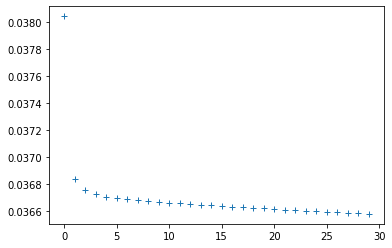

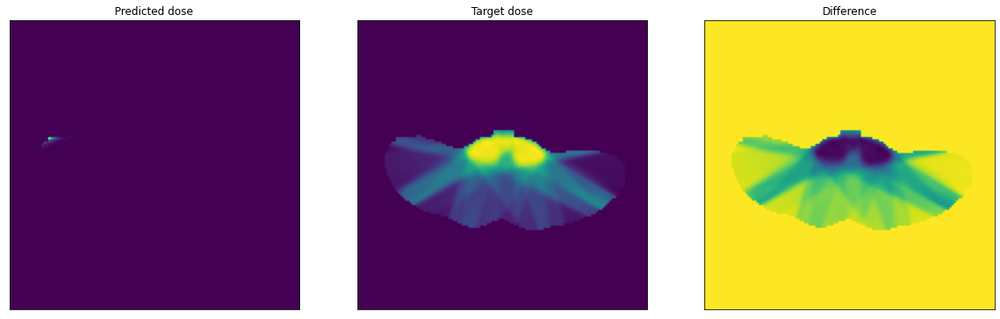

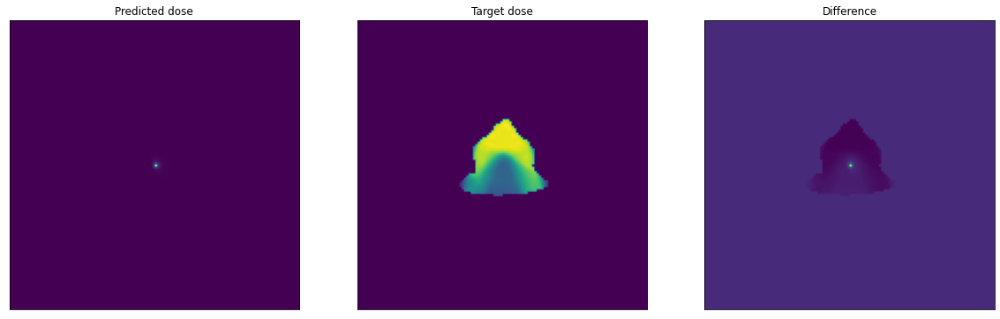

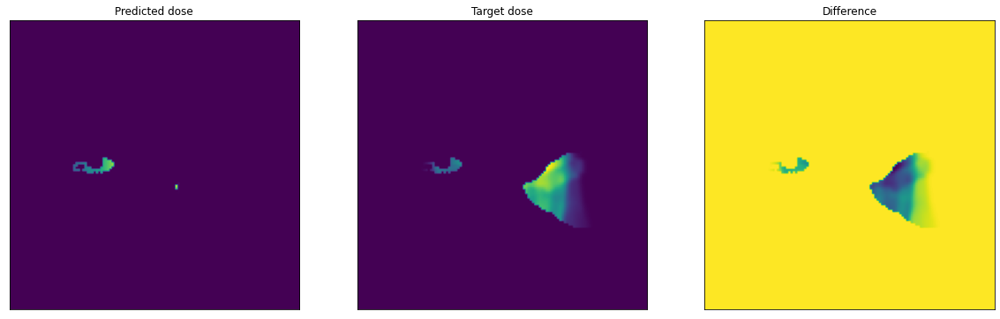

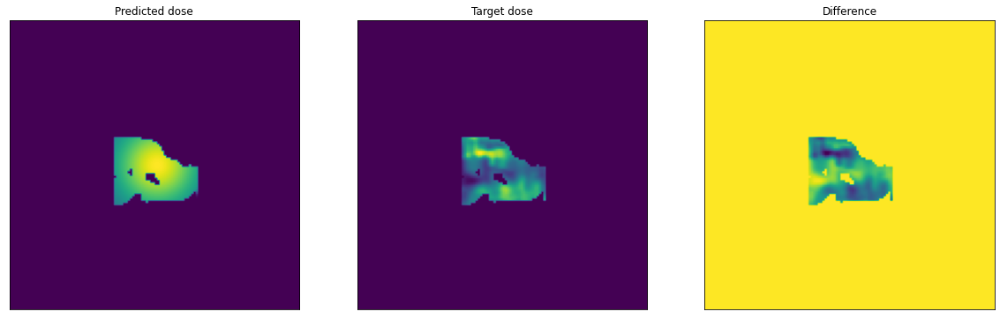

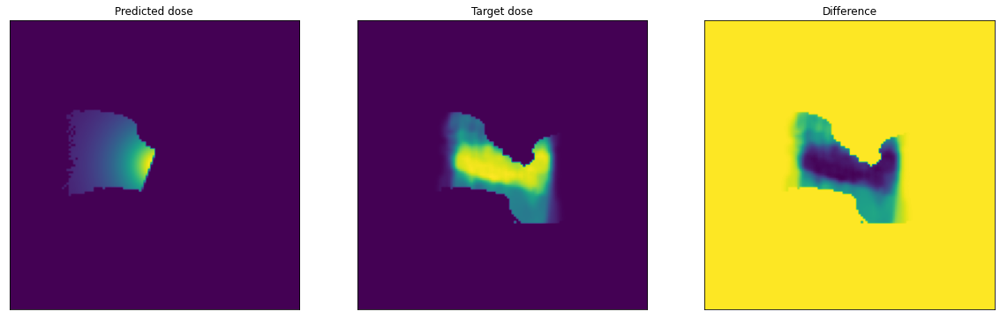

<Figure size 432x288 with 0 Axes>

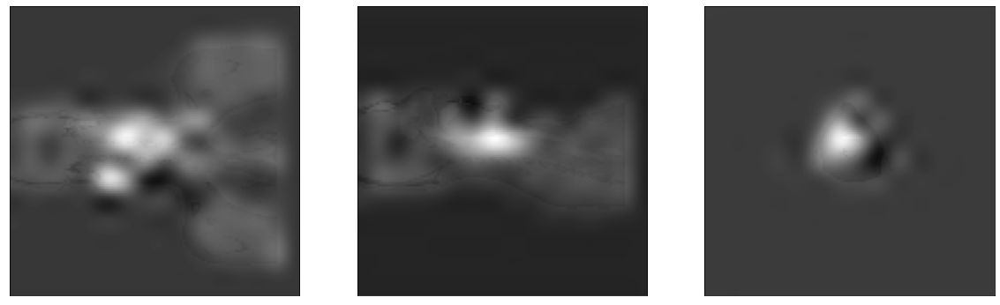

Epoch 30 performed in 165.173s



Epoch number 31 out of 200


EPOCH #31/200 - BATCH #1/150
Loading the data...
Data loaded in 0.275
Generator training...
Mean absolute error : 0.027
Generator trained in 0.782
Attention weight sigma  [[4.6802063e-05], [0.0]]
Total training time : 1.059s

--------------------------------------------------------------------------------

EPOCH #31/200 - BATCH #2/150
Loading the data...
Data loaded in 0.215
Generator training...
Mean absolute error : 0.033
Generator trained in 0.771
Attention weight sigma  [[4.4651606e-05], [0.0]]
Total training time : 0.989s

--------------------------------------------------------------------------------

EPOCH #31/200 - BATCH #3/150
Loading the data...
Data loaded in 0.217
Generator training...
Mean absolute error : 0.029
Generator trained in 0.779
Attention weight sigma  [[4.434714e-05], [0.0]]
Total training time : 0.998s

--------------------------------------------------------------------------------

EPOCH #31/200 

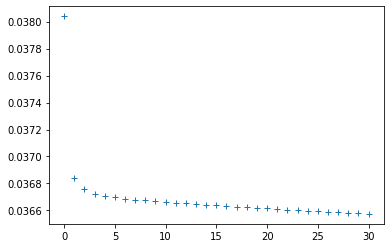

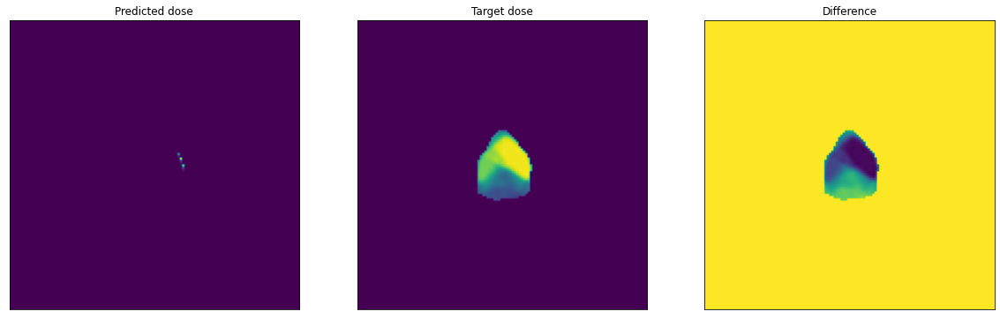

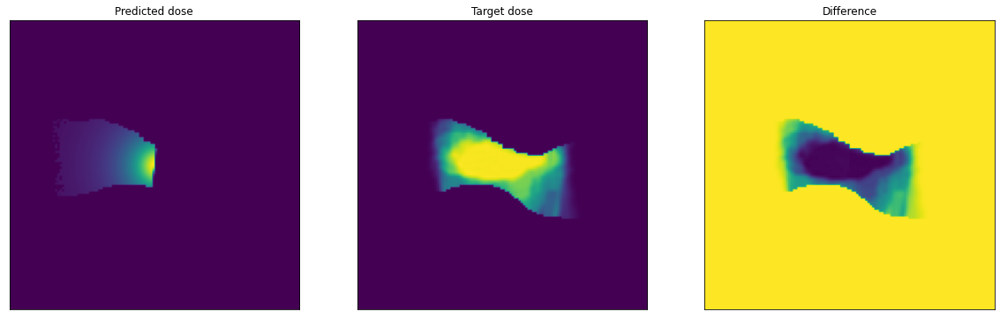

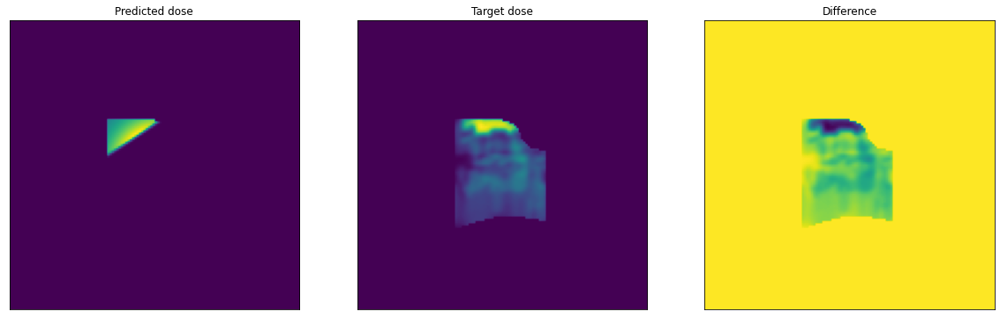

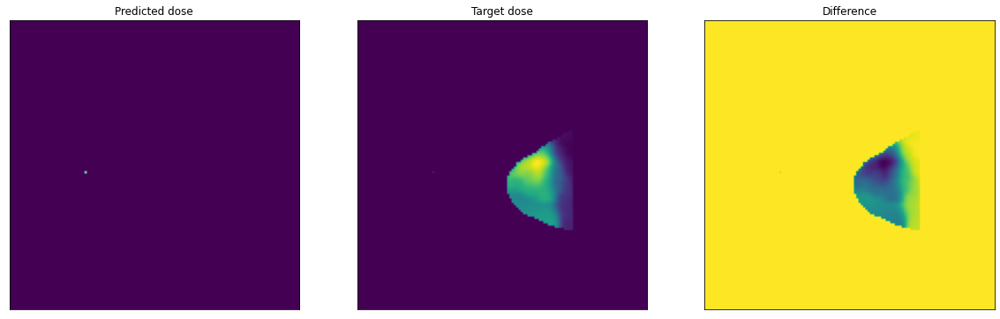

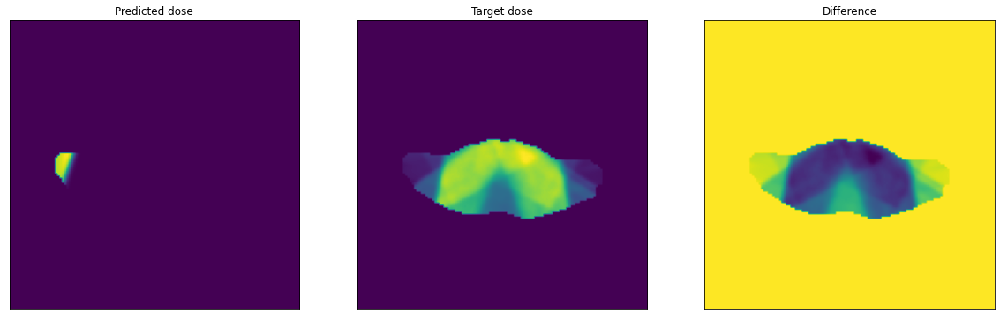

<Figure size 432x288 with 0 Axes>

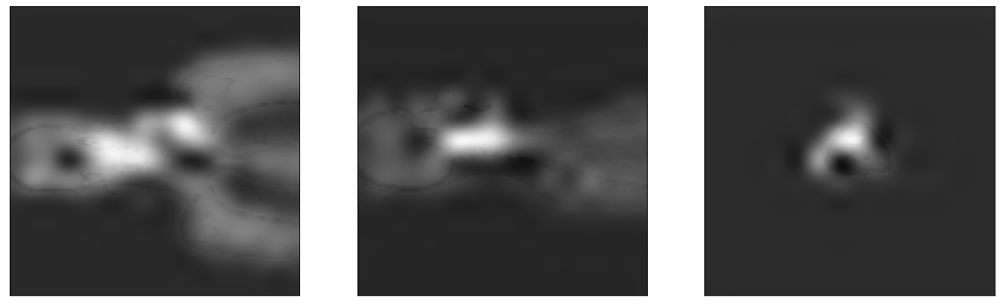

Epoch 31 performed in 164.219s



Epoch number 32 out of 200


EPOCH #32/200 - BATCH #1/150
Loading the data...
Data loaded in 0.246
Generator training...
Mean absolute error : 0.039
Generator trained in 0.770
Attention weight sigma  [[5.6745517e-05], [0.0]]
Total training time : 1.018s

--------------------------------------------------------------------------------

EPOCH #32/200 - BATCH #2/150
Loading the data...
Data loaded in 0.267
Generator training...
Mean absolute error : 0.043
Generator trained in 0.765
Attention weight sigma  [[5.7101606e-05], [0.0]]
Total training time : 1.034s

--------------------------------------------------------------------------------

EPOCH #32/200 - BATCH #3/150
Loading the data...
Data loaded in 0.212
Generator training...
Mean absolute error : 0.033
Generator trained in 0.775
Attention weight sigma  [[5.641897e-05], [0.0]]
Total training time : 0.989s

--------------------------------------------------------------------------------

EPOCH #32/200 

In [0]:
# Train a model
data_loader_train = DataLoader(training_paths, batch_size=1)
dose_prediction_model_train = PredictionModel(data_loader_train, results_dir, model_name=prediction_name)
dose_prediction_model_train.number_of_cones = 40
dose_prediction_model_train.gen_use_attention_layer = True
dose_prediction_model_train.use_sn = False
# dose_prediction_model_train.initial_number_of_filters = 8
dose_prediction_model_train.initialize_networks()
tf.keras.utils.plot_model(dose_prediction_model_train.generator_, os.path.join(results_dir,prediction_name,'generator_graph.png'))
dose_prediction_model_train.train_generator_model(epochs=number_of_training_epochs, save_frequency=1, keep_model_history=1)

In [0]:
dose_prediction_model_train.generator_.save(os.path.join(results_dir,prediction_name,'models','generator'))

In [0]:
model = dose_prediction_model_train.generator_
batch = data_loader_train.get_batch(1)
output = model.predict([batch['ct'], batch['structure_masks'], h['possible_dose_mask']]
cone_coordinates = dose_prediction_model_train.get_cone_coordinates([batch['ct'], batch['structure_masks'], batch['possible_dose_mask']])
cone_coefficients = dose_prediction_model_train.get_cone_coefficients([batch['ct'], batch['structure_masks'], batch['possible_dose_mask']])

first_image = output[0,:,:,:,0]
visualize_3d_image(first_image)

6

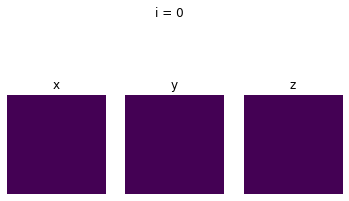

In [0]:
second_image = output[1,:,:,:,0]
visualize_3d_image(second_image)

Note that during training we will only keep models that are __save_frequency * keep_model_history__ epochs back from the
current epoch. We do this because models are very large (~1 GB). 

Now that the model is trained we can use it to predict the dose for the set of held-out patients from the training set 
that we set aside earlier. We start by making a new data loader for the held-out set, and use it to predict (and save) a 
set of out-of-sample dose distributions. Note that we change the mode of the data loader to 'dose_prediction' to 
load only the data needed to make a prediction.

In [0]:
# Predict dose for the held out set
data_loader_hold_out = DataLoader(hold_out_paths, mode_name='dose_prediction')
dose_prediction_model_hold_out = PredictionModel(data_loader_hold_out, results_dir,
                                                 model_name=prediction_name, stage='hold-out-tests')
dose_prediction_model_hold_out.predict_dose(epoch=number_of_training_epochs)

Load each predicted dose distribution and evaluate it against the ground truth using the 
competition metrics.

In [0]:
# Evaluate dose metrics
data_loader_hold_out_eval = DataLoader(hold_out_paths, mode_name='evaluation')  # Set data loader
prediction_paths = get_paths(dose_prediction_model_hold_out.prediction_dir, ext='csv')
hold_out_prediction_loader = DataLoader(prediction_paths, mode_name='predicted_dose')  # Set prediction loader
dose_evaluator = EvaluateDose(data_loader_hold_out_eval, hold_out_prediction_loader)
# print out scores if data was left for a hold out set
if not data_loader_hold_out_eval.file_paths_list:
    print('No patient information was given to calculate metrics')
else:
    dvh_score, dose_score = dose_evaluator.make_metrics()
    print('For this out-of-sample test:\n'
          '\tthe DVH score is {:.3f}\n '
          '\tthe dose score is {:.3f}'.format(dvh_score, dose_score))

If the model is performing well here you can try predicting the dose from the OpenKBP validation set. All you need to do
is use the same prediction model that was just trained and predict the dose for the patients in the validation set 

In [0]:
# Apply model to validation set
validation_data_paths = get_paths(validation_data_dir, ext='')  # gets the path of each plan's directory
validation_data_loader = DataLoader(validation_data_paths, mode_name='dose_prediction')
dose_prediction_model_validation = PredictionModel(validation_data_loader, results_dir,
                                                   model_name=prediction_name, stage='validation')
dose_prediction_model_validation.predict_dose(epoch=number_of_training_epochs)

You may wish to check that the metrics seem reasonable. Although there's no baseline available you can still
evaluate the predictions based against on dose metrics to double check that your prediction seems reasonable. 


In [0]:
validation_eval_data_loader = DataLoader(validation_data_paths, mode_name='dose_prediction')  # Set data loader
dose_evaluator = EvaluateDose(validation_eval_data_loader)
dose_evaluator.make_metrics()
validation_prediction_metrics = dose_evaluator.reference_dose_metric_df.head()

Once you're happy with your dose distributions you can zip up the predictions with the code block below. The zipped file
will contain the dose distributions for the validation set. It can be uploaded directly to CodaLab.

In [0]:
# Zip dose to submit
submission_dir = make_directory_and_return_path('{}/submissions'.format(results_dir))
shutil.make_archive('{}/{}'.format(submission_dir, prediction_name), 'zip', dose_prediction_model_validation.prediction_dir)